# Predicting molecular biomarkers for cancer therapeutic response

Unlike cytotoxic chemotherapies, novel cancer therapeutics are specific and targeted in nature. Hence, identifying mechanism of action (MOA) for drugs are important not only for identifying biological targets and enrolement biomarkers, but also for ruling out non-specific activity. The goal of the project is to nominate transcriptomic/RNA expression biomarker for drug response. 

For individual patient derived cell lines compound response is available in the form of LogAC50 values. The exp dataset contains molecular expression/transcriptomic features for individual cell lines. The goal of the project is to associate the best gene expression features that predict response. 

Biological datasets are feature-heavy and often correlating feature with response results in overfitting (p/n ratio problem). To overcome this, a regularized regression may come handy. 

Biomarkers are a general term; it could mean genes that predict drug response both as a cause or as an effect. Hence to establish causation, we need further validation in the laboratory settings.

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
#Loading logAC50 values
#path = 'C:\\Users\\aubhi\\LOGAC50.csv'
path = '/Users/aubhishekzaman/Desktop/Dataset for Capstone 2/Data_from_core_3rd/LOGAC50.csv'
AC50= pd.read_csv(path)

## Data Wrangling

The datasets are in two different csv tables. They need to be merged.
The LogAC50 (drug response) is in the form where rows are cell lines and 2nd column is the response.
The expression is in the form that rows are genes and columns are cell lines. To merge the datasets expression will be transposed. 



In [4]:
AC50.head()

,Cell_line,ve-LOGAC50
0,H650,5.218079
1,H1581,6.100549
2,H1770,5.583757
3,A549,5.992182
4,H522,6.389748


In [6]:
AC50.describe()

,ve-LOGAC50
count,49.000000
mean,5.687873
std,0.511979
min,4.673664
25%,5.302771
50%,5.614394
75%,5.987163
max,7.347754


In [7]:
#path2 = 'C:/Users/aubhi/RNA_SEQ Frozen pane.csv'

path2= '/Users/aubhishekzaman/Desktop/Dataset for Capstone 2/Data_from_core_3rd/RNA_SEQ Frozen pane.csv'
exp= pd.read_csv(path2)

In [8]:
exp.set_index ('ENSEMBL', inplace= False)

,HUGO,A427,Cal.12T,Calu.1,Calu.3,DFCI.024,EBC1,EKVX,H1155,H1184,...,HCC4018,HCC4019,HCC44,HCC515,HCC78,HCC827,HCC95,Hop92,PC.9,Sk.Lu.1
ENSEMBL,,,,,,,,,,,,,,,,,,,,,
ENSG00000268020,AL627309.2,0.00000,0.00000,0.00000,0.00000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.000,0.0000,0.00000,0.0000,0.00000,0.0000,0.0000,0.0000,0.000,0.000
ENSG00000240361,OR4G11P,0.00000,0.00000,0.00000,0.00000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.000,0.0000,0.00000,0.0000,0.00000,0.0000,0.0000,0.0000,0.000,0.000
ENSG00000237613,FAM138A,0.00000,0.00000,0.00542,0.01090,0.0000,0.0000,0.0000,0.0000,0.0113,...,0.000,0.0000,0.00345,0.0113,0.03310,0.0000,0.0000,0.0457,0.000,0.000
ENSG00000186092,OR4F5,0.00000,0.00000,0.00000,0.00822,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.000,0.0000,0.00000,0.0000,0.00000,0.0000,0.0000,0.0000,0.000,0.000
ENSG00000239906,RP11-34P13.14,1.68000,2.56000,0.36500,3.46000,4.3500,2.2300,0.7500,1.3200,2.4500,...,1.500,0.8260,1.71000,0.1430,2.26000,1.4800,5.3300,0.2090,0.987,0.942
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSG00000221485,AC145212.2,0.00000,0.00000,0.00000,0.00000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.000,0.0000,0.00000,0.0000,0.00000,0.0000,0.0000,0.0000,0.000,0.000
ENSG00000223061,AC145212.3,0.00000,0.00000,0.00000,0.00000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.000,0.0000,0.00000,0.0000,0.00000,0.0000,0.0000,0.0000,0.000,0.000
ENSG00000238315,AL360154.2,0.00000,0.00000,0.00000,0.00000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.000,0.0000,0.00000,0.0000,0.00000,0.0000,0.0000,0.0000,0.000,0.000


In [9]:
exp.head()

,ENSEMBL,HUGO,A427,Cal.12T,Calu.1,Calu.3,DFCI.024,EBC1,EKVX,H1155,...,HCC4018,HCC4019,HCC44,HCC515,HCC78,HCC827,HCC95,Hop92,PC.9,Sk.Lu.1
0,ENSG00000268020,AL627309.2,0.00,0.00,0.00000,0.00000,0.00,0.00,0.00,0.00,...,0.0,0.000,0.00000,0.0000,0.0000,0.00,0.00,0.0000,0.000,0.000
1,ENSG00000240361,OR4G11P,0.00,0.00,0.00000,0.00000,0.00,0.00,0.00,0.00,...,0.0,0.000,0.00000,0.0000,0.0000,0.00,0.00,0.0000,0.000,0.000
2,ENSG00000237613,FAM138A,0.00,0.00,0.00542,0.01090,0.00,0.00,0.00,0.00,...,0.0,0.000,0.00345,0.0113,0.0331,0.00,0.00,0.0457,0.000,0.000
3,ENSG00000186092,OR4F5,0.00,0.00,0.00000,0.00822,0.00,0.00,0.00,0.00,...,0.0,0.000,0.00000,0.0000,0.0000,0.00,0.00,0.0000,0.000,0.000
4,ENSG00000239906,RP11-34P13.14,1.68,2.56,0.36500,3.46000,4.35,2.23,0.75,1.32,...,1.5,0.826,1.71000,0.1430,2.2600,1.48,5.33,0.2090,0.987,0.942


In [10]:
exp.describe()

,A427,Cal.12T,Calu.1,Calu.3,DFCI.024,EBC1,EKVX,H1155,H1184,H125,...,HCC4018,HCC4019,HCC44,HCC515,HCC78,HCC827,HCC95,Hop92,PC.9,Sk.Lu.1
count,54469.000000,54473.000000,54466.000000,54471.000000,54467.000000,54466.000000,54473.000000,54452.000000,54472.000000,54471.000000,...,54459.000000,54465.000000,54478.000000,54461.000000,54459.000000,5.446800e+04,54462.000000,54469.000000,54459.000000,54464.000000
mean,10.036555,9.236673,9.830680,9.820348,8.186112,8.344387,10.249596,9.201276,8.052935,10.155752,...,10.434196,10.203980,9.647762,9.897343,10.240811,9.792174e+00,9.695934,9.583064,9.828960,8.107297
std,90.896833,104.204582,89.557576,92.473506,78.220780,76.820955,108.770768,67.673871,69.416290,96.290506,...,118.313319,92.282038,93.678522,92.659186,85.256581,7.680094e+01,82.327880,101.962793,85.866853,82.328092
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000732,0.002460,0.000000,0.000000,...,0.018400,0.000000,0.000000,0.000000,0.000000,1.662500e-21,0.000000,0.000000,0.000000,0.000000
75%,0.932000,0.689000,0.786750,0.879000,0.875000,0.840000,1.200000,1.270000,0.817000,0.924500,...,1.690000,1.040000,0.710000,0.922000,0.774000,1.070000e+00,1.110000,0.904000,0.961000,0.824250
max,7240.000000,8270.000000,6330.000000,6200.000000,5950.000000,5660.000000,11700.000000,5990.000000,5510.000000,9000.000000,...,11300.000000,7950.000000,8330.000000,7230.000000,5120.000000,5.190000e+03,3720.000000,9990.000000,4690.000000,6470.000000


In [11]:
exp.reset_index()
exp

,ENSEMBL,HUGO,A427,Cal.12T,Calu.1,Calu.3,DFCI.024,EBC1,EKVX,H1155,...,HCC4018,HCC4019,HCC44,HCC515,HCC78,HCC827,HCC95,Hop92,PC.9,Sk.Lu.1
0,ENSG00000268020,AL627309.2,0.00000,0.00000,0.00000,0.00000,0.0000,0.0000,0.0000,0.0000,...,0.000,0.0000,0.00000,0.0000,0.00000,0.0000,0.0000,0.0000,0.000,0.000
1,ENSG00000240361,OR4G11P,0.00000,0.00000,0.00000,0.00000,0.0000,0.0000,0.0000,0.0000,...,0.000,0.0000,0.00000,0.0000,0.00000,0.0000,0.0000,0.0000,0.000,0.000
2,ENSG00000237613,FAM138A,0.00000,0.00000,0.00542,0.01090,0.0000,0.0000,0.0000,0.0000,...,0.000,0.0000,0.00345,0.0113,0.03310,0.0000,0.0000,0.0457,0.000,0.000
3,ENSG00000186092,OR4F5,0.00000,0.00000,0.00000,0.00822,0.0000,0.0000,0.0000,0.0000,...,0.000,0.0000,0.00000,0.0000,0.00000,0.0000,0.0000,0.0000,0.000,0.000
4,ENSG00000239906,RP11-34P13.14,1.68000,2.56000,0.36500,3.46000,4.3500,2.2300,0.7500,1.3200,...,1.500,0.8260,1.71000,0.1430,2.26000,1.4800,5.3300,0.2090,0.987,0.942
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54483,ENSG00000221485,AC145212.2,0.00000,0.00000,0.00000,0.00000,0.0000,0.0000,0.0000,0.0000,...,0.000,0.0000,0.00000,0.0000,0.00000,0.0000,0.0000,0.0000,0.000,0.000
54484,ENSG00000223061,AC145212.3,0.00000,0.00000,0.00000,0.00000,0.0000,0.0000,0.0000,0.0000,...,0.000,0.0000,0.00000,0.0000,0.00000,0.0000,0.0000,0.0000,0.000,0.000
54485,ENSG00000238315,AL360154.2,0.00000,0.00000,0.00000,0.00000,0.0000,0.0000,0.0000,0.0000,...,0.000,0.0000,0.00000,0.0000,0.00000,0.0000,0.0000,0.0000,0.000,0.000
54486,ENSG00000215642,AL360154.1,0.00000,0.00719,0.00317,0.01730,0.0709,0.0143,0.0242,0.0326,...,0.369,0.0137,0.00000,0.0037,0.00000,0.0389,0.2010,0.0000,0.455,0.000


In [12]:
#Tranposing exp to merge; an intersection strategy was adopted
exp_T= exp.T
exp_T.head()

,0,1,2,3,4,5,6,7,8,9,...,54478,54479,54480,54481,54482,54483,54484,54485,54486,54487
ENSEMBL,ENSG00000268020,ENSG00000240361,ENSG00000237613,ENSG00000186092,ENSG00000239906,ENSG00000238009,ENSG00000239945,ENSG00000233750,ENSG00000237683,ENSG00000268903,...,ENSG00000255783,ENSG00000256974,ENSG00000215689,ENSG00000229510,ENSG00000215750,ENSG00000221485,ENSG00000223061,ENSG00000238315,ENSG00000215642,ENSG00000234295
HUGO,AL627309.2,OR4G11P,FAM138A,OR4F5,RP11-34P13.14,RP11-34P13.7,RP11-34P13.8,RP11-34P13.10,AL627309.1,RP11-34P13.15,...,AC018692.3,AC018692.4,MGC39584,AC018692.2,AC145212.1,AC145212.2,AC145212.3,AL360154.2,AL360154.1,AC109135.1
A427,0.0,0.0,0.0,0.0,1.68,0.313,0.24,0.0432,0.784,0.436,...,0.0,0.0,0.26,0.0,0.803,0.0,0.0,0.0,0.0,0.00142
Cal.12T,0.0,0.0,0.0,0.0,2.56,0.644,0.0686,0.549,4.25,2.13,...,0.0,0.0,0.0266,0.0,0.479,0.0,0.0,0.0,0.00719,0.0017
Calu.1,0.0,0.0,0.00542,0.0,0.365,0.117,0.0174,0.0388,0.493,0.155,...,0.0,0.0,0.0,0.0,0.317,0.0,0.0,0.0,0.00317,0.006


In [13]:
df1= exp.drop("ENSEMBL", axis =1)

In [14]:
df1.head()

,HUGO,A427,Cal.12T,Calu.1,Calu.3,DFCI.024,EBC1,EKVX,H1155,H1184,...,HCC4018,HCC4019,HCC44,HCC515,HCC78,HCC827,HCC95,Hop92,PC.9,Sk.Lu.1
0,AL627309.2,0.00,0.00,0.00000,0.00000,0.00,0.00,0.00,0.00,0.0000,...,0.0,0.000,0.00000,0.0000,0.0000,0.00,0.00,0.0000,0.000,0.000
1,OR4G11P,0.00,0.00,0.00000,0.00000,0.00,0.00,0.00,0.00,0.0000,...,0.0,0.000,0.00000,0.0000,0.0000,0.00,0.00,0.0000,0.000,0.000
2,FAM138A,0.00,0.00,0.00542,0.01090,0.00,0.00,0.00,0.00,0.0113,...,0.0,0.000,0.00345,0.0113,0.0331,0.00,0.00,0.0457,0.000,0.000
3,OR4F5,0.00,0.00,0.00000,0.00822,0.00,0.00,0.00,0.00,0.0000,...,0.0,0.000,0.00000,0.0000,0.0000,0.00,0.00,0.0000,0.000,0.000
4,RP11-34P13.14,1.68,2.56,0.36500,3.46000,4.35,2.23,0.75,1.32,2.4500,...,1.5,0.826,1.71000,0.1430,2.2600,1.48,5.33,0.2090,0.987,0.942


In [15]:
#Transpose
df2= df1.T

In [16]:
df2.head()

,0,1,2,3,4,5,6,7,8,9,...,54478,54479,54480,54481,54482,54483,54484,54485,54486,54487
HUGO,AL627309.2,OR4G11P,FAM138A,OR4F5,RP11-34P13.14,RP11-34P13.7,RP11-34P13.8,RP11-34P13.10,AL627309.1,RP11-34P13.15,...,AC018692.3,AC018692.4,MGC39584,AC018692.2,AC145212.1,AC145212.2,AC145212.3,AL360154.2,AL360154.1,AC109135.1
A427,0.0,0.0,0.0,0.0,1.68,0.313,0.24,0.0432,0.784,0.436,...,0.0,0.0,0.26,0.0,0.803,0.0,0.0,0.0,0.0,0.00142
Cal.12T,0.0,0.0,0.0,0.0,2.56,0.644,0.0686,0.549,4.25,2.13,...,0.0,0.0,0.0266,0.0,0.479,0.0,0.0,0.0,0.00719,0.0017
Calu.1,0.0,0.0,0.00542,0.0,0.365,0.117,0.0174,0.0388,0.493,0.155,...,0.0,0.0,0.0,0.0,0.317,0.0,0.0,0.0,0.00317,0.006
Calu.3,0.0,0.0,0.0109,0.00822,3.46,1.9,0.104,0.752,6.64,1.72,...,0.0,0.0,0.0,0.0,1.73,0.0,0.0,0.0,0.0173,0.118


In [17]:
df2.reset_index(drop=False, inplace=True)
df2.head()

,index,0,1,2,3,4,5,6,7,8,...,54478,54479,54480,54481,54482,54483,54484,54485,54486,54487
0,HUGO,AL627309.2,OR4G11P,FAM138A,OR4F5,RP11-34P13.14,RP11-34P13.7,RP11-34P13.8,RP11-34P13.10,AL627309.1,...,AC018692.3,AC018692.4,MGC39584,AC018692.2,AC145212.1,AC145212.2,AC145212.3,AL360154.2,AL360154.1,AC109135.1
1,A427,0.0,0.0,0.0,0.0,1.68,0.313,0.24,0.0432,0.784,...,0.0,0.0,0.26,0.0,0.803,0.0,0.0,0.0,0.0,0.00142
2,Cal.12T,0.0,0.0,0.0,0.0,2.56,0.644,0.0686,0.549,4.25,...,0.0,0.0,0.0266,0.0,0.479,0.0,0.0,0.0,0.00719,0.0017
3,Calu.1,0.0,0.0,0.00542,0.0,0.365,0.117,0.0174,0.0388,0.493,...,0.0,0.0,0.0,0.0,0.317,0.0,0.0,0.0,0.00317,0.006
4,Calu.3,0.0,0.0,0.0109,0.00822,3.46,1.9,0.104,0.752,6.64,...,0.0,0.0,0.0,0.0,1.73,0.0,0.0,0.0,0.0173,0.118


In [18]:
df2.shape

(97, 54489)

In [19]:
df2.describe()

,index,0,1,2,3,4,5,6,7,8,...,54478,54479,54480,54481,54482,54483,54484,54485,54486,54487
count,97,97.0,97.0,97.0,97.0,97.00,97.000,97.0000,97.0000,97.000,...,97.0,97.0,97.0,97.0,97.00,97.0,97.0,97.0,97.0,97.0
unique,97,2.0,7.0,38.0,9.0,92.00,86.000,92.0000,92.0000,90.000,...,2.0,2.0,33.0,2.0,93.00,2.0,2.0,2.0,79.0,85.0
top,HUGO,0.0,0.0,0.0,0.0,1.26,0.186,0.0901,0.0546,0.823,...,0.0,0.0,0.0,0.0,1.01,0.0,0.0,0.0,0.0,0.0
freq,1,96.0,91.0,59.0,89.0,2.00,2.000,2.0000,2.0000,2.000,...,96.0,96.0,64.0,96.0,2.00,96.0,96.0,96.0,17.0,8.0


In [20]:
df2.head()

,index,0,1,2,3,4,5,6,7,8,...,54478,54479,54480,54481,54482,54483,54484,54485,54486,54487
0,HUGO,AL627309.2,OR4G11P,FAM138A,OR4F5,RP11-34P13.14,RP11-34P13.7,RP11-34P13.8,RP11-34P13.10,AL627309.1,...,AC018692.3,AC018692.4,MGC39584,AC018692.2,AC145212.1,AC145212.2,AC145212.3,AL360154.2,AL360154.1,AC109135.1
1,A427,0.0,0.0,0.0,0.0,1.68,0.313,0.24,0.0432,0.784,...,0.0,0.0,0.26,0.0,0.803,0.0,0.0,0.0,0.0,0.00142
2,Cal.12T,0.0,0.0,0.0,0.0,2.56,0.644,0.0686,0.549,4.25,...,0.0,0.0,0.0266,0.0,0.479,0.0,0.0,0.0,0.00719,0.0017
3,Calu.1,0.0,0.0,0.00542,0.0,0.365,0.117,0.0174,0.0388,0.493,...,0.0,0.0,0.0,0.0,0.317,0.0,0.0,0.0,0.00317,0.006
4,Calu.3,0.0,0.0,0.0109,0.00822,3.46,1.9,0.104,0.752,6.64,...,0.0,0.0,0.0,0.0,1.73,0.0,0.0,0.0,0.0173,0.118


In [21]:
#Merging the two tables
l_merged = df2.merge(AC50, left_on= "index", right_on= 'Cell_line', how = 'inner')

In [22]:
l_merged.head(30)

,index,0,1,2,3,4,5,6,7,8,...,54480,54481,54482,54483,54484,54485,54486,54487,Cell_line,ve-LOGAC50
0,EKVX,0.0,0.0,0.0,0.0,0.75,0.213,0.000004,0.0737,1.6,...,0.0111,0.0,2.98,0.0,0.0,0.0,0.0242,0.152,EKVX,4.978811
1,H1299,0.0,0.0149,0.00711,0.0,0.296,0.0671,0.0597,0.0698,0.912,...,0.0,0.0,1.57,0.0,0.0,0.0,0.0131,0.136,H1299,5.410050
2,H1355,0.0,0.0,0.0,0.0,0.148,0.0558,0.0,0.0174,0.127,...,0.287,0.0,1.22,0.0,0.0,0.0,0.0231,0.0096,H1355,5.714443
3,H1373,0.0,0.0,0.0,0.0,0.138,0.392,0.131,0.0706,0.444,...,0.0137,0.0,1.37,0.0,0.0,0.0,0.00369,0.00696,H1373,5.186419
4,H157,0.0,0.0,0.0,0.0,1.13,0.628,0.139,0.146,1.28,...,1.39,0.0,0.553,0.0,0.0,0.0,0.00332,0.0518,H157,5.838890
5,H1573,0.0,0.0,0.0,0.0,1.01,0.19,0.224,0.057,1.51,...,0.0101,0.0,1.54,0.0,0.0,0.0,0.0634,0.107,H1573,5.416801
6,H1581,0.0,0.0181,0.0443,0.0166,2.04,0.491,0.154,0.101,4.03,...,0.333,0.0,1.05,0.0,0.0,0.0,0.0209,0.0156,H1581,6.100549
7,H1651,0.0,0.0,0.0,0.0,0.492,0.0915,0.0216,0.0409,0.679,...,0.0,0.0,0.763,0.0,0.0,0.0,0.00984,0.0201,H1651,5.759451
8,H1693,0.0,0.0,0.0531,0.0,1.56,0.21,0.148,0.0492,1.97,...,1.39,0.0,5.46,0.0,0.0,0.0,0.0192,0.0156,H1693,6.657578
9,H1703,0.0,0.0,0.0,0.0,1.06,0.225,0.0297,0.148,2.31,...,0.0,0.0,2.54,0.0,0.0,0.0,0.183,0.205,H1703,5.939302


## Exploratory data analysis and data clean-up

The data contains null values. as a astrategy, gene for which expression was not detected will be ignored and hence will be replaced with xero. Merging process caused some datatypes ro convert to object. To perform numeic operations object datatypes were converted to numeric.

In [23]:
#check missing values
l_merged.isnull().values.sum()

641

In [24]:
#replace missing values with 0
l_merged.fillna(0.0)

,index,0,1,2,3,4,5,6,7,8,...,54480,54481,54482,54483,54484,54485,54486,54487,Cell_line,ve-LOGAC50
0,EKVX,0.0,0.0000,0.00000,0.00000,0.7500,0.2130,3.840000e-06,0.0737,1.600,...,0.0111,0.0,2.980,0.0,0.0,0.0,0.02420,0.15200,EKVX,4.978811
1,H1299,0.0,0.0149,0.00711,0.00000,0.2960,0.0671,5.970000e-02,0.0698,0.912,...,0.0000,0.0,1.570,0.0,0.0,0.0,0.01310,0.13600,H1299,5.410050
2,H1355,0.0,0.0000,0.00000,0.00000,0.1480,0.0558,8.540000e-08,0.0174,0.127,...,0.2870,0.0,1.220,0.0,0.0,0.0,0.02310,0.00960,H1355,5.714443
3,H1373,0.0,0.0000,0.00000,0.00000,0.1380,0.3920,1.310000e-01,0.0706,0.444,...,0.0137,0.0,1.370,0.0,0.0,0.0,0.00369,0.00696,H1373,5.186419
4,H157,0.0,0.0000,0.00000,0.00000,1.1300,0.6280,1.390000e-01,0.1460,1.280,...,1.3900,0.0,0.553,0.0,0.0,0.0,0.00332,0.05180,H157,5.838890
5,H1573,0.0,0.0000,0.00000,0.00000,1.0100,0.1900,2.240000e-01,0.0570,1.510,...,0.0101,0.0,1.540,0.0,0.0,0.0,0.06340,0.10700,H1573,5.416801
6,H1581,0.0,0.0181,0.04430,0.01660,2.0400,0.4910,1.540000e-01,0.1010,4.030,...,0.3330,0.0,1.050,0.0,0.0,0.0,0.02090,0.01560,H1581,6.100549
7,H1651,0.0,0.0000,0.00000,0.00000,0.4920,0.0915,2.160000e-02,0.0409,0.679,...,0.0000,0.0,0.763,0.0,0.0,0.0,0.00984,0.02010,H1651,5.759451
8,H1693,0.0,0.0000,0.05310,0.00000,1.5600,0.2100,1.480000e-01,0.0492,1.970,...,1.3900,0.0,5.460,0.0,0.0,0.0,0.01920,0.01560,H1693,6.657578
9,H1703,0.0,0.0000,0.00000,0.00000,1.0600,0.2250,2.970000e-02,0.1480,2.310,...,0.0000,0.0,2.540,0.0,0.0,0.0,0.18300,0.20500,H1703,5.939302


In [26]:
np.isnan(l_merged.any()).sum()

0

In [27]:
np.isfinite(l_merged.all())

index         True
0             True
1             True
2             True
3             True
              ... 
54485         True
54486         True
54487         True
Cell_line     True
ve-LOGAC50    True
Length: 54491, dtype: bool

In [28]:
l_merged.describe()

,ve-LOGAC50
count,29.000000
mean,5.667210
std,0.588645
min,4.673664
25%,5.264401
50%,5.567031
75%,5.987163
max,7.347754


In [29]:
l_merged.head()

,index,0,1,2,3,4,5,6,7,8,...,54480,54481,54482,54483,54484,54485,54486,54487,Cell_line,ve-LOGAC50
0,EKVX,0.0,0.0,0.0,0.0,0.75,0.213,0.000004,0.0737,1.6,...,0.0111,0.0,2.98,0.0,0.0,0.0,0.0242,0.152,EKVX,4.978811
1,H1299,0.0,0.0149,0.00711,0.0,0.296,0.0671,0.0597,0.0698,0.912,...,0.0,0.0,1.57,0.0,0.0,0.0,0.0131,0.136,H1299,5.410050
2,H1355,0.0,0.0,0.0,0.0,0.148,0.0558,0.0,0.0174,0.127,...,0.287,0.0,1.22,0.0,0.0,0.0,0.0231,0.0096,H1355,5.714443
3,H1373,0.0,0.0,0.0,0.0,0.138,0.392,0.131,0.0706,0.444,...,0.0137,0.0,1.37,0.0,0.0,0.0,0.00369,0.00696,H1373,5.186419
4,H157,0.0,0.0,0.0,0.0,1.13,0.628,0.139,0.146,1.28,...,1.39,0.0,0.553,0.0,0.0,0.0,0.00332,0.0518,H157,5.838890


In [30]:
#datatype checking for numerical operations
l_merged.dtypes

index          object
0              object
1              object
2              object
3              object
               ...   
54485          object
54486          object
54487          object
Cell_line      object
ve-LOGAC50    float64
Length: 54491, dtype: object

In [31]:
l_merged_2 = l_merged.iloc[:, 1:54491]
l_merged_2.head()

,0,1,2,3,4,5,6,7,8,9,...,54480,54481,54482,54483,54484,54485,54486,54487,Cell_line,ve-LOGAC50
0,0.0,0.0,0.0,0.0,0.75,0.213,0.000004,0.0737,1.6,0.596,...,0.0111,0.0,2.98,0.0,0.0,0.0,0.0242,0.152,EKVX,4.978811
1,0.0,0.0149,0.00711,0.0,0.296,0.0671,0.0597,0.0698,0.912,1.6,...,0.0,0.0,1.57,0.0,0.0,0.0,0.0131,0.136,H1299,5.410050
2,0.0,0.0,0.0,0.0,0.148,0.0558,0.0,0.0174,0.127,0.111,...,0.287,0.0,1.22,0.0,0.0,0.0,0.0231,0.0096,H1355,5.714443
3,0.0,0.0,0.0,0.0,0.138,0.392,0.131,0.0706,0.444,0.299,...,0.0137,0.0,1.37,0.0,0.0,0.0,0.00369,0.00696,H1373,5.186419
4,0.0,0.0,0.0,0.0,1.13,0.628,0.139,0.146,1.28,0.346,...,1.39,0.0,0.553,0.0,0.0,0.0,0.00332,0.0518,H157,5.838890


In [32]:
l_merged_3 = l_merged_2.drop(['Cell_line'], axis =1)
l_merged_3.head()

,0,1,2,3,4,5,6,7,8,9,...,54479,54480,54481,54482,54483,54484,54485,54486,54487,ve-LOGAC50
0,0.0,0.0,0.0,0.0,0.75,0.213,0.000004,0.0737,1.6,0.596,...,0.0,0.0111,0.0,2.98,0.0,0.0,0.0,0.0242,0.152,4.978811
1,0.0,0.0149,0.00711,0.0,0.296,0.0671,0.0597,0.0698,0.912,1.6,...,0.0,0.0,0.0,1.57,0.0,0.0,0.0,0.0131,0.136,5.410050
2,0.0,0.0,0.0,0.0,0.148,0.0558,0.0,0.0174,0.127,0.111,...,0.0,0.287,0.0,1.22,0.0,0.0,0.0,0.0231,0.0096,5.714443
3,0.0,0.0,0.0,0.0,0.138,0.392,0.131,0.0706,0.444,0.299,...,0.0,0.0137,0.0,1.37,0.0,0.0,0.0,0.00369,0.00696,5.186419
4,0.0,0.0,0.0,0.0,1.13,0.628,0.139,0.146,1.28,0.346,...,0.0,1.39,0.0,0.553,0.0,0.0,0.0,0.00332,0.0518,5.838890


In [33]:
#Datatype conversion
l_merged_4 = l_merged_3.apply(pd.to_numeric)
l_merged_4.describe()

,0,1,2,3,4,5,6,7,8,9,...,54479,54480,54481,54482,54483,54484,54485,54486,54487,ve-LOGAC50
count,29.0,29.000000,29.000000,29.000000,29.000000,29.000000,2.900000e+01,29.000000,29.000000,29.000000,...,29.0,29.000000,29.0,29.000000,29.0,29.0,29.0,29.000000,29.000000,29.000000
mean,0.0,0.001138,0.005409,0.000862,1.111859,0.280462,1.171093e-01,0.073507,1.370966,0.776379,...,0.0,0.217417,0.0,1.952586,0.0,0.0,0.0,0.048352,0.093780,5.667210
std,0.0,0.004276,0.012778,0.003404,0.999418,0.158442,1.208443e-01,0.047245,1.007226,1.102892,...,0.0,0.422635,0.0,1.782430,0.0,0.0,0.0,0.057471,0.088583,0.588645
min,0.0,0.000000,0.000000,0.000000,0.039900,0.055800,8.540000e-08,0.017400,0.127000,0.111000,...,0.0,0.000000,0.0,0.161000,0.0,0.0,0.0,0.000000,0.000000,4.673664
25%,0.0,0.000000,0.000000,0.000000,0.492000,0.186000,2.160000e-02,0.045700,0.640000,0.242000,...,0.0,0.000000,0.0,0.936000,0.0,0.0,0.0,0.009840,0.015600,5.264401
50%,0.0,0.000000,0.000000,0.000000,0.956000,0.232000,7.910000e-02,0.056600,1.150000,0.428000,...,0.0,0.000000,0.0,1.370000,0.0,0.0,0.0,0.024200,0.070400,5.567031
75%,0.0,0.000000,0.006040,0.000000,1.480000,0.388000,1.540000e-01,0.079300,2.060000,0.838000,...,0.0,0.224000,0.0,2.680000,0.0,0.0,0.0,0.060700,0.144000,5.987163
max,0.0,0.018100,0.053100,0.016600,5.330000,0.629000,4.120000e-01,0.230000,4.030000,5.930000,...,0.0,1.390000,0.0,8.510000,0.0,0.0,0.0,0.201000,0.304000,7.347754


In [34]:
l_merged_4.dtypes

0             float64
1             float64
2             float64
3             float64
4             float64
               ...   
54484         float64
54485         float64
54486         float64
54487         float64
ve-LOGAC50    float64
Length: 54489, dtype: object

In [35]:
l_merged_5= l_merged_4.replace(np.nan, 0)
l_merged_5.head()

,0,1,2,3,4,5,6,7,8,9,...,54479,54480,54481,54482,54483,54484,54485,54486,54487,ve-LOGAC50
0,0.0,0.0000,0.00000,0.0,0.750,0.2130,3.840000e-06,0.0737,1.600,0.596,...,0.0,0.0111,0.0,2.980,0.0,0.0,0.0,0.02420,0.15200,4.978811
1,0.0,0.0149,0.00711,0.0,0.296,0.0671,5.970000e-02,0.0698,0.912,1.600,...,0.0,0.0000,0.0,1.570,0.0,0.0,0.0,0.01310,0.13600,5.410050
2,0.0,0.0000,0.00000,0.0,0.148,0.0558,8.540000e-08,0.0174,0.127,0.111,...,0.0,0.2870,0.0,1.220,0.0,0.0,0.0,0.02310,0.00960,5.714443
3,0.0,0.0000,0.00000,0.0,0.138,0.3920,1.310000e-01,0.0706,0.444,0.299,...,0.0,0.0137,0.0,1.370,0.0,0.0,0.0,0.00369,0.00696,5.186419
4,0.0,0.0000,0.00000,0.0,1.130,0.6280,1.390000e-01,0.1460,1.280,0.346,...,0.0,1.3900,0.0,0.553,0.0,0.0,0.0,0.00332,0.05180,5.838890


In [36]:
l_merged_5.dtypes

0             float64
1             float64
2             float64
3             float64
4             float64
               ...   
54484         float64
54485         float64
54486         float64
54487         float64
ve-LOGAC50    float64
Length: 54489, dtype: object

# Data preparation for modeling

For the regularized regression elastic net algorthm modeling will be the first one to do.
Non-zero matrix factorization (NMF) algorithm will be tried second.
A PCA will be indicate if data complexity can be reduced in any meaningful way. However, the genes will not be discrete in NMF and PCA.

## Elastic net regularized regression

In [37]:
y= np.array(l_merged_5["ve-LOGAC50"])

In [38]:
y.shape

(29,)

In [39]:
X= np.array(l_merged_5.iloc[:, 0:54487 ])

In [40]:
X.shape

(29, 54487)

In [41]:
#Split data: import train-test split

from sklearn.model_selection import train_test_split

In [42]:
X_train, X_test, y_train, y_test = train_test_split (X, y, test_size = 0.25) 

In [43]:
#import elasticnet
from sklearn.linear_model import ElasticNet
from sklearn.metrics import mean_squared_error
import warnings;warnings.simplefilter('ignore')

In [44]:
#setting alpha
a_min = 0.0001
a_max= 0.2
a_num= 200
alphas= np.linspace (a_min, a_max, a_num)

In [128]:
#creating the model by setting alpha

for a in alphas:
    eNet_AC50 = ElasticNet (alpha = a).fit(X, y)
    score = eNet_AC50.score(X, y)
    y_pred = eNet_AC50.predict (X)
    mse = mean_squared_error (y, y_pred)
    print ('Alpha:{0:4f}, R2:{1:4f}, MSE:{2:4f}, RMSE:{3:4f}'
          .format(a, score, mse, np.sqrt(mse)))

Alpha:0.000100, R2:1.000000, MSE:0.000000, RMSE:0.000001
Alpha:0.001105, R2:1.000000, MSE:0.000000, RMSE:0.000007
Alpha:0.002109, R2:1.000000, MSE:0.000000, RMSE:0.000015
Alpha:0.003114, R2:1.000000, MSE:0.000000, RMSE:0.000024
Alpha:0.004118, R2:1.000000, MSE:0.000000, RMSE:0.000029
Alpha:0.005123, R2:1.000000, MSE:0.000000, RMSE:0.000031
Alpha:0.006127, R2:1.000000, MSE:0.000000, RMSE:0.000038
Alpha:0.007132, R2:1.000000, MSE:0.000000, RMSE:0.000035
Alpha:0.008136, R2:1.000000, MSE:0.000000, RMSE:0.000042
Alpha:0.009141, R2:1.000000, MSE:0.000000, RMSE:0.000050
Alpha:0.010145, R2:1.000000, MSE:0.000000, RMSE:0.000051
Alpha:0.011150, R2:1.000000, MSE:0.000000, RMSE:0.000055
Alpha:0.012154, R2:1.000000, MSE:0.000000, RMSE:0.000062
Alpha:0.013159, R2:1.000000, MSE:0.000000, RMSE:0.000068
Alpha:0.014163, R2:1.000000, MSE:0.000000, RMSE:0.000076
Alpha:0.015168, R2:1.000000, MSE:0.000000, RMSE:0.000088
Alpha:0.016172, R2:1.000000, MSE:0.000000, RMSE:0.000096
Alpha:0.017177, R2:1.000000, MS

Alpha:0.144751, R2:0.999998, MSE:0.000001, RMSE:0.000777
Alpha:0.145756, R2:0.999998, MSE:0.000001, RMSE:0.000783
Alpha:0.146760, R2:0.999998, MSE:0.000001, RMSE:0.000788
Alpha:0.147765, R2:0.999998, MSE:0.000001, RMSE:0.000794
Alpha:0.148769, R2:0.999998, MSE:0.000001, RMSE:0.000799
Alpha:0.149774, R2:0.999998, MSE:0.000001, RMSE:0.000804
Alpha:0.150778, R2:0.999998, MSE:0.000001, RMSE:0.000810
Alpha:0.151783, R2:0.999998, MSE:0.000001, RMSE:0.000815
Alpha:0.152787, R2:0.999998, MSE:0.000001, RMSE:0.000821
Alpha:0.153792, R2:0.999998, MSE:0.000001, RMSE:0.000826
Alpha:0.154796, R2:0.999998, MSE:0.000001, RMSE:0.000832
Alpha:0.155801, R2:0.999998, MSE:0.000001, RMSE:0.000837
Alpha:0.156806, R2:0.999998, MSE:0.000001, RMSE:0.000844
Alpha:0.157810, R2:0.999998, MSE:0.000001, RMSE:0.000865
Alpha:0.158815, R2:0.999998, MSE:0.000001, RMSE:0.000873
Alpha:0.159819, R2:0.999998, MSE:0.000001, RMSE:0.000914
Alpha:0.160824, R2:0.999997, MSE:0.000001, RMSE:0.000922
Alpha:0.161828, R2:0.999997, MS

In [45]:
from sklearn.model_selection import GridSearchCV

In [ ]:
# Use grid search to tune the parameters:

parametersGrid = {"max_iter": [1, 5, 10, 100, 500, 1000, 5000, 10000],
                "alpha": [0.0001, 0.001, 0.01, 0.1, 1, 10, 100],
                "l1_ratio": np.arange(0.0, 1.0, 0.1)}

eNet = ElasticNet()
gridsearch = GridSearchCV(eNet, parametersGrid, scoring='accuracy', cv=10)
grid= gridsearch.fit(X_train, y_train)
y_pred = grid.predict(X_test)
print("Best parameters from gridsearch: {}".format(gridsearch.best_params_))
print("CV score=%0.3f" % gridsearch.best_score_)
cv_results = gridsearch.cv_results_
print(cv_results)

In [100]:
#Tuned model with the alpha
eNet_AC50_tuned = ElasticNet (alpha = 0.0001).fit(X_train, y_train)

In [101]:
#Predicted models; will be compared with the y_test
y_pred_tuned = eNet_AC50_tuned.predict(X_test)

In [ ]:
score_tuned = eNet_AC50_tuned.score(X_test, y_test)
mse_tuned = mean_squared_error (y_test, y_pred_tuned)
print ('R2:{0:4f}, MSE:{1:4f}, RMSE:{2:4f}'
        .format(score_tuned, mse_tuned, np.sqrt(mse_tuned)))

There was not much of a correlation, but since this is an algorthm where we are trying to capture the outliers this is not unexprcted. The RMSE and MSE scores indicate that the model is tunes well between test and prediction.

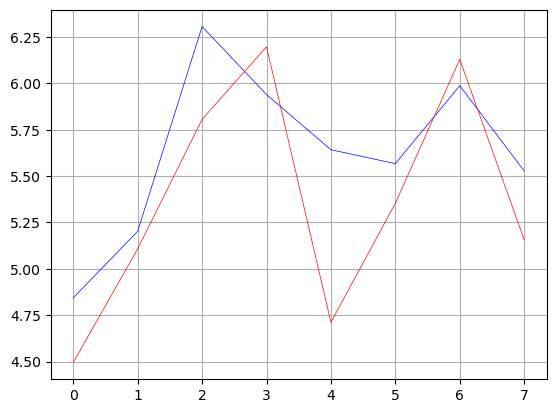

In [103]:
import matplotlib.pyplot as plt
x_ax = range(len(X_test))
plt.plot(x_ax, y_test, lw = 0.5, color = 'blue', label = 'observed')
plt.plot(x_ax, y_pred_tuned, lw = 0.5, color = 'red', label = 'predicted')
plt.grid()
plt.show()

In [104]:
from sklearn.linear_model import ElasticNetCV

In [105]:
#10 fold CV
eNet_AC50_CV = ElasticNetCV(alphas = alphas, cv =10)
mymodel = eNet_AC50_CV.fit (X_train, y_train)

In [106]:
print (mymodel.alpha_)

0.2


In [107]:
print (mymodel.intercept_)

6.068705787957474


In [108]:
print (mymodel.coef_)

[ 0. -0.  0. ...  0.  0. -0.]


In [109]:
#predicting on test data
y_pred = mymodel.predict(X_test)

In [110]:
score_2= mymodel.score(X_test, y_test)
mse_2 = mean_squared_error (y_test, y_pred)
print ('R2:{0:4f}, MSE:{1:4f}, RMSE:{2:4f}'
       .format(score_2, mse_2, np.sqrt(mse_tuned)))

R2:-1.118108, MSE:0.395996, RMSE:0.435258


Cross validation has not improved the score significantly. However, as a good practice we'll keep the cross validation in our process for the next compounds.

In [111]:
importance = mymodel.coef_
# summarize feature importance
for i,v in enumerate(importance):
 print('Feature: %0d, Score: %.10f' % (i,v))
# plot feature importance
pyplot.bar([x for x in range(len(importance))], importance)
pyplot.show()

Feature: 0, Score: 0.0000000000
Feature: 1, Score: -0.0000000000
Feature: 2, Score: 0.0000000000
Feature: 3, Score: 0.0000000000
Feature: 4, Score: 0.0000000000
Feature: 5, Score: -0.0000000000
Feature: 6, Score: -0.0000000000
Feature: 7, Score: -0.0000000000
Feature: 8, Score: 0.0000000000
Feature: 9, Score: 0.0000000000
Feature: 10, Score: 0.0000000000
Feature: 11, Score: 0.0000000000
Feature: 12, Score: 0.0000000000
Feature: 13, Score: 0.0000000000
Feature: 14, Score: 0.0000000000
Feature: 15, Score: 0.0000000000
Feature: 16, Score: -0.0000000000
Feature: 17, Score: -0.0000000000
Feature: 18, Score: 0.0000000000
Feature: 19, Score: -0.0000000000
Feature: 20, Score: 0.0000000000
Feature: 21, Score: 0.0000000000
Feature: 22, Score: 0.0000000000
Feature: 23, Score: 0.0000000000
Feature: 24, Score: 0.0000000000
Feature: 25, Score: 0.0000000000
Feature: 26, Score: 0.0000000000
Feature: 27, Score: 0.0000000000
Feature: 28, Score: -0.0000000000
Feature: 29, Score: 0.0000000000
Feature: 30,

NameError: name 'pyplot' is not defined

In [112]:
#g = df.groupby('Store', as_index=False)['Size'].sum().sort_values(by='Size', ascending=False).head(10)

feature_score= pd.DataFrame([x for x in range(len(importance))], importance)
feature_score.head(5)


,0
0.0,0
-0.0,1
0.0,2
0.0,3
0.0,4


<AxesSubplot:>

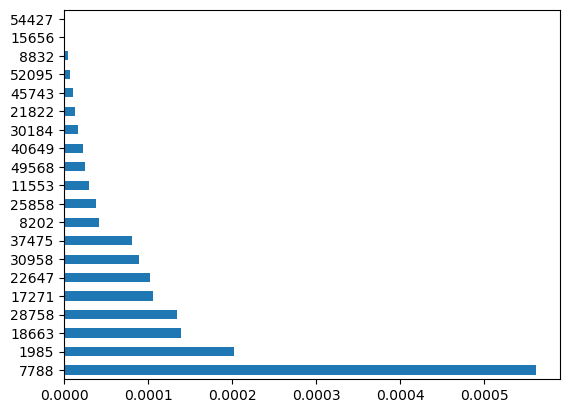

In [115]:
feat_importances = pd.Series(mymodel.coef_)
feat_importances.nlargest(20).plot(kind='barh')

This barplot does not have the gene names; to include the gene names in the plot we can print out the corresponding gene names below. The following few codes work with generating a visualization so that we can do a vertical barplot with the associated gene names at the bottom

In [116]:
df2.iloc[:, 7789]

0       FN1
1     0.494
2     0.588
3     632.0
4      21.1
      ...  
92     11.8
93     1.25
94    615.0
95     1.11
96      0.0
Name: 7788, Length: 97, dtype: object

## Non-zero matrix factorization
The following codes will try to apply a non-zero matrix factorization algoithms for the predictions.

In [130]:
l_merged_5.shape
l_merged_5.head()

,0,1,2,3,4,5,6,7,8,9,...,54479,54480,54481,54482,54483,54484,54485,54486,54487,ve-LOGAC50
0,0.0,0.0000,0.00000,0.0,0.750,0.2130,3.840000e-06,0.0737,1.600,0.596,...,0.0,0.0111,0.0,2.980,0.0,0.0,0.0,0.02420,0.15200,4.978811
1,0.0,0.0149,0.00711,0.0,0.296,0.0671,5.970000e-02,0.0698,0.912,1.600,...,0.0,0.0000,0.0,1.570,0.0,0.0,0.0,0.01310,0.13600,5.410050
2,0.0,0.0000,0.00000,0.0,0.148,0.0558,8.540000e-08,0.0174,0.127,0.111,...,0.0,0.2870,0.0,1.220,0.0,0.0,0.0,0.02310,0.00960,5.714443
3,0.0,0.0000,0.00000,0.0,0.138,0.3920,1.310000e-01,0.0706,0.444,0.299,...,0.0,0.0137,0.0,1.370,0.0,0.0,0.0,0.00369,0.00696,5.186419
4,0.0,0.0000,0.00000,0.0,1.130,0.6280,1.390000e-01,0.1460,1.280,0.346,...,0.0,1.3900,0.0,0.553,0.0,0.0,0.0,0.00332,0.05180,5.838890


In [131]:
l_merged_6= l_merged_5.drop('ve-LOGAC50', axis =1)
l_merged_6.head()

,0,1,2,3,4,5,6,7,8,9,...,54478,54479,54480,54481,54482,54483,54484,54485,54486,54487
0,0.0,0.0000,0.00000,0.0,0.750,0.2130,3.840000e-06,0.0737,1.600,0.596,...,0.0,0.0,0.0111,0.0,2.980,0.0,0.0,0.0,0.02420,0.15200
1,0.0,0.0149,0.00711,0.0,0.296,0.0671,5.970000e-02,0.0698,0.912,1.600,...,0.0,0.0,0.0000,0.0,1.570,0.0,0.0,0.0,0.01310,0.13600
2,0.0,0.0000,0.00000,0.0,0.148,0.0558,8.540000e-08,0.0174,0.127,0.111,...,0.0,0.0,0.2870,0.0,1.220,0.0,0.0,0.0,0.02310,0.00960
3,0.0,0.0000,0.00000,0.0,0.138,0.3920,1.310000e-01,0.0706,0.444,0.299,...,0.0,0.0,0.0137,0.0,1.370,0.0,0.0,0.0,0.00369,0.00696
4,0.0,0.0000,0.00000,0.0,1.130,0.6280,1.390000e-01,0.1460,1.280,0.346,...,0.0,0.0,1.3900,0.0,0.553,0.0,0.0,0.0,0.00332,0.05180


In [132]:
# Import NMF
from sklearn.decomposition import NMF

# Create an NMF instance: model
model = NMF(n_components = 10)

# Fit the model to articles
model.fit (l_merged_6)

# Transform the articles: nmf_features
nmf_features_genes = model.transform(l_merged_6)

# Print the NMF features
print(nmf_features_genes.round(2))

[[0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 2.95900e+01 0.00000e+00
  3.65900e+01 1.14850e+02 0.00000e+00 1.99700e+01]
 [0.00000e+00 5.43500e+01 1.72000e+01 8.68000e+00 0.00000e+00 0.00000e+00
  0.00000e+00 4.04800e+01 9.71000e+00 2.44300e+01]
 [0.00000e+00 4.04600e+01 2.29000e+00 8.61000e+00 1.73500e+01 6.75000e+00
  7.60600e+01 0.00000e+00 2.70000e-01 6.15000e+00]
 [0.00000e+00 4.42400e+01 5.96000e+00 0.00000e+00 2.38900e+01 6.78000e+00
  6.34000e+00 0.00000e+00 2.84100e+01 2.69300e+01]
 [0.00000e+00 2.90100e+01 2.26000e+00 6.78100e+01 1.36000e+00 1.71600e+01
  2.98000e+00 6.61300e+01 1.13400e+01 4.07000e+00]
 [0.00000e+00 0.00000e+00 0.00000e+00 1.04600e+01 0.00000e+00 8.87000e+00
  0.00000e+00 6.52000e+00 1.60840e+02 1.44500e+01]
 [2.61534e+03 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00
  0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00]
 [0.00000e+00 3.20000e+00 1.18400e+01 2.70000e+00 2.20900e+01 0.00000e+00
  1.30600e+01 1.09400e+01 1.54500e+01 5.77100e+01]


In [133]:
# Create a pandas DataFrame: df
df_NMF_gene = pd.DataFrame(nmf_features_genes)

df_NMF_gene

,0,1,2,3,4,5,6,7,8,9
0,0.000000,0.000000,0.000000,0.000000,29.588999,0.000000,36.585514,114.850600,0.000000,19.971974
1,0.000000,54.347782,17.195179,8.676599,0.000000,0.000000,0.000000,40.481882,9.714924,24.429717
2,0.000000,40.462810,2.285708,8.605293,17.347582,6.754052,76.058224,0.000000,0.266610,6.148990
3,0.000000,44.239622,5.961813,0.000000,23.885802,6.783060,6.337091,0.000000,28.411678,26.932749
4,0.000000,29.013359,2.260295,67.814560,1.362434,17.158994,2.976561,66.128519,11.335981,4.068420
5,0.000000,0.000000,0.000000,10.461027,0.000000,8.865923,0.000000,6.524048,160.835142,14.451458
6,2615.344863,0.000000,0.000000,0.000000,0.000000,0.000059,0.000000,0.000000,0.000000,0.000014
7,0.000000,3.201301,11.842548,2.703585,22.088437,0.000000,13.060430,10.938936,15.448012,57.705396
8,0.000268,43.115179,53.595290,0.762774,12.626045,5.646408,0.000000,0.930627,0.000000,0.000000
9,0.000677,31.207098,1.292309,11.203492,33.852400,0.000000,0.000000,79.240174,31.368452,0.000000


In [134]:
df_NMF_gene.mean(axis =0).sort_values(ascending = False)


0    90.184395
7    23.311481
2    19.369156
9    19.116595
1    18.705160
4    18.518749
3    18.511849
6    14.487009
8    12.146327
5    12.041040
dtype: float64

<AxesSubplot:>

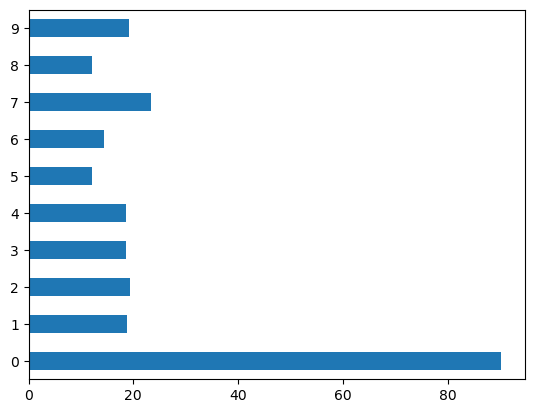

In [135]:
nmf_major_component= df_NMF_gene.mean(axis =0)
nmf_major_component.plot(kind='barh')

In [136]:
# Select row 3: component
component = df_NMF_gene.iloc[:, 0]

# Print result of nlargest
print(component.nlargest(20))

#The cell line that is skewing the info 

6     2615.344863
9        0.000677
11       0.000370
8        0.000268
26       0.000260
25       0.000223
27       0.000208
18       0.000174
28       0.000169
12       0.000143
16       0.000047
24       0.000040
17       0.000026
0        0.000000
1        0.000000
2        0.000000
3        0.000000
4        0.000000
5        0.000000
7        0.000000
Name: 0, dtype: float64


## Principal component analysis

In [137]:
# Importing libraries
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Separating out the features and the target variable
X_pca = l_merged_5.drop('ve-LOGAC50', axis =1)
y_pca = l_merged_5['ve-LOGAC50']

# Standardizing the features
scaler = StandardScaler()
X_scaled_pca = scaler.fit_transform(X_pca)

# Performing PCA with 2 components
pca = PCA()
X_scaled_pca_fit = pca.fit_transform(X_scaled_pca)

# Printing the shape of the original and reduced data
print('Original shape: ', X_pca.shape)
print('Reduced shape: ', X_scaled_pca_fit.shape)


Original shape:  (29, 54488)
Reduced shape:  (29, 29)


In [138]:
X_scaled_pca_fit_df = pd.DataFrame(X_scaled_pca_fit)
X_scaled_pca_fit_df.head()

,0,1,2,3,4,5,6,7,8,9,...,19,20,21,22,23,24,25,26,27,28
0,-6.169086,-46.484736,-12.538770,-41.243745,20.126382,-32.629825,16.283060,-21.443480,-29.856964,31.374457,...,33.801232,-6.734578,-7.837393,18.015942,-9.630956,11.265155,1.055151,14.540581,-3.127539,9.987819e-13
1,-7.531262,-54.931532,17.189950,25.038052,-27.713614,9.411060,31.562639,-44.791782,47.686072,-5.682976,...,62.397855,-14.308611,-30.712054,7.265432,-26.869426,-5.146752,-12.414580,10.241668,-4.538653,9.987819e-13
2,-27.457852,-9.127811,-36.270426,-18.724861,-3.031051,-28.935232,-17.756854,-31.238165,-9.970121,-5.182563,...,-8.523059,-22.541944,-16.616787,-14.767763,-16.532678,-23.552185,53.272627,-24.242104,116.383992,9.987819e-13
3,-23.875627,16.332907,-6.664913,50.496743,-0.261025,18.382923,6.656468,0.912171,-5.471949,-3.925674,...,-36.849306,-19.227267,6.036702,22.997438,26.762565,111.661156,81.887191,6.201916,-13.287669,9.987819e-13
4,-2.800824,-46.445361,-43.558182,16.167558,-32.669959,37.736364,19.050050,-1.226936,46.144424,-3.645076,...,-8.464452,53.627353,11.134337,22.031891,-46.363607,-2.798023,11.926569,3.989131,8.740782,9.987819e-13


In [139]:
X_scaled_pca_fit_df.mean()

0    -2.480468e-13
1    -2.790718e-13
2    -4.067245e-13
3     1.715103e-14
4    -7.509702e-14
5     1.950317e-13
6    -1.523992e-13
7    -1.347581e-13
8     1.293678e-13
9     2.065474e-13
10    6.226437e-14
11    1.753234e-13
12   -4.189752e-14
13    5.382667e-14
14    3.334344e-13
15    2.274962e-13
16    1.593515e-13
17    4.103997e-14
18    6.860413e-15
19    1.407303e-13
20    9.457569e-14
21    8.655146e-14
22    7.423181e-14
23   -4.116707e-13
24   -1.331043e-13
25   -2.342953e-13
26    6.198873e-14
27    1.332574e-13
28    9.987819e-13
dtype: float64

In [140]:
X_scaled_pca_fit_df.std(ddof=1)

0     7.294757e+01
1     5.349652e+01
2     4.693678e+01
3     4.616372e+01
4     4.329012e+01
5     4.274511e+01
6     4.177224e+01
7     4.147837e+01
8     4.083569e+01
9     3.941546e+01
10    3.926543e+01
11    3.854353e+01
12    3.815330e+01
13    3.697347e+01
14    3.653665e+01
15    3.524204e+01
16    3.482827e+01
17    3.436965e+01
18    3.353082e+01
19    3.320616e+01
20    3.257356e+01
21    3.243264e+01
22    3.125875e+01
23    3.107166e+01
24    3.013367e+01
25    2.995982e+01
26    2.863494e+01
27    2.795985e+01
28    2.746087e-26
dtype: float64

In [141]:
X_scaled_pca_fit_2 = PCA().fit(X_scaled_pca)

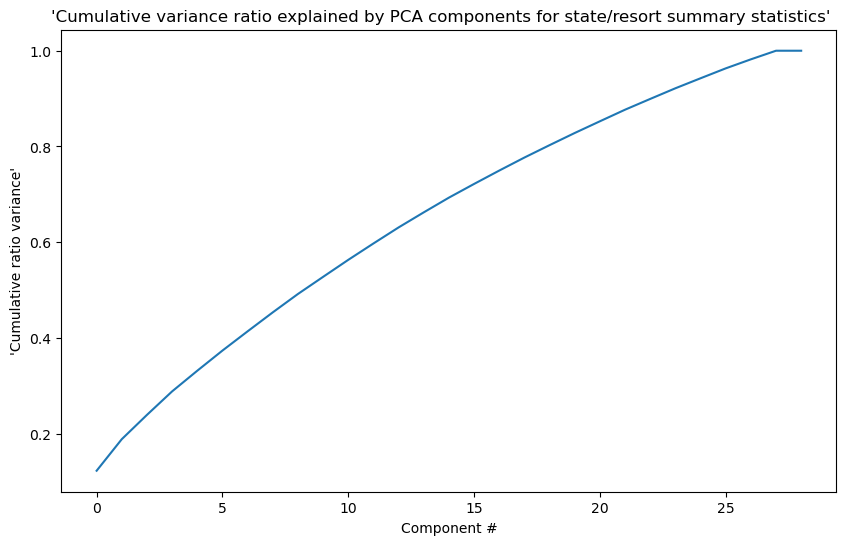

In [142]:
plt.subplots(figsize=(10, 6))
plt.plot(X_scaled_pca_fit_2.explained_variance_ratio_.cumsum())
plt.xlabel("Component #")
plt.ylabel("'Cumulative ratio variance'")
plt.title("'Cumulative variance ratio explained by PCA components for state/resort summary statistics'   ");

In [143]:
l_merged_6T= l_merged_6.T
l_merged_6T

,0,1,2,3,4,5,6,7,8,9,...,19,20,21,22,23,24,25,26,27,28
0,0.0000,0.00000,0.0000,0.00000,0.00000,0.0000,0.0000,0.00000,0.0000,0.000,...,0.00000,0.0000,0.00000,0.0000,0.0000,0.00000,0.000,0.00000,0.0000,0.0000
1,0.0000,0.01490,0.0000,0.00000,0.00000,0.0000,0.0181,0.00000,0.0000,0.000,...,0.00000,0.0000,0.00000,0.0000,0.0000,0.00000,0.000,0.00000,0.0000,0.0000
2,0.0000,0.00711,0.0000,0.00000,0.00000,0.0000,0.0443,0.00000,0.0531,0.000,...,0.00402,0.0000,0.00781,0.0000,0.0000,0.00796,0.000,0.00000,0.0000,0.0000
3,0.0000,0.00000,0.0000,0.00000,0.00000,0.0000,0.0166,0.00000,0.0000,0.000,...,0.00000,0.0000,0.00839,0.0000,0.0000,0.00000,0.000,0.00000,0.0000,0.0000
4,0.7500,0.29600,0.1480,0.13800,1.13000,1.0100,2.0400,0.49200,1.5600,1.060,...,1.77000,0.2740,0.41800,1.2600,0.0399,1.56000,0.678,0.88700,1.4800,5.3300
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54483,0.0000,0.00000,0.0000,0.00000,0.00000,0.0000,0.0000,0.00000,0.0000,0.000,...,0.00000,0.0000,0.00000,0.0000,0.0000,0.00000,0.000,0.00000,0.0000,0.0000
54484,0.0000,0.00000,0.0000,0.00000,0.00000,0.0000,0.0000,0.00000,0.0000,0.000,...,0.00000,0.0000,0.00000,0.0000,0.0000,0.00000,0.000,0.00000,0.0000,0.0000
54485,0.0000,0.00000,0.0000,0.00000,0.00000,0.0000,0.0000,0.00000,0.0000,0.000,...,0.00000,0.0000,0.00000,0.0000,0.0000,0.00000,0.000,0.00000,0.0000,0.0000
54486,0.0242,0.01310,0.0231,0.00369,0.00332,0.0634,0.0209,0.00984,0.0192,0.183,...,0.03750,0.0520,0.05700,0.0000,0.0607,0.00353,0.168,0.00271,0.0389,0.2010


In [144]:
# Import NMF
from sklearn.decomposition import NMF

# Create an NMF instance: model
model = NMF(n_components = 10)

# Fit the model to articles
model.fit (l_merged_6T)

# Transform the articles: nmf_features
nmf_features_cell_line = model.transform(l_merged_6T)

# Print the NMF features
print(nmf_features_cell_line.round(2))

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [145]:
# Import pandas
import pandas as pd

# Create a pandas DataFrame: df
df_NMF_cell_line = pd.DataFrame(nmf_features_cell_line)

df_NMF_cell_line

,0,1,2,3,4,5,6,7,8,9
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.000007,0.000056,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.000017,0.000019,0.000089,0.000000,0.000000,0.000000,0.000069,0.000000,0.000000,0.000037
3,0.000006,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000027
4,0.000780,0.005868,0.025318,0.000000,0.003689,0.005769,0.000022,0.009038,0.005924,0.001658
...,...,...,...,...,...,...,...,...,...,...
54483,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
54484,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
54485,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
54486,0.000008,0.000602,0.000742,0.000200,0.000424,0.000264,0.000180,0.000009,0.000345,0.000000


## Now trying other compounds...
All the other compounds can be tried using the elastic net algorthm. For that we'll merge the compound AC50 values for >10 compounds with the original expression data, and run elastic net using the expression as features and each compound AC50 column as the target regressor. Following, we'll try a for loop to streamline this calculations.

In [146]:
#Loading logAC50 values
#path = 'C:\\Users\\aubhi\\LOGAC50.csv'
path_3 = '/Users/aubhishekzaman/Desktop/Dataset for Capstone 2/Data_from_core_3rd/LOGAC50_all.csv'
AC50_3= pd.read_csv(path_3)

In [147]:
AC50_3.head()

,Lot Barcode,SW174769-3,SW202558-2,SW209495-1,SW209496-1,SW209497-1,SW209498-1,SW209499-1,SW209500-1,SW209501-1,SW209502-1,SW209503-1,SW209504-1,PAK4i
0,A549,-4.625252,-4.305395,-6.139063,-6.602060,-4.305395,-5.991400,-7.966576,-4.533132,-4.628932,-4.903090,-4.798603,-5.512862,-5.991400
1,calu1,-4.305395,-4.305395,-7.442493,-7.444906,-5.464706,-5.747147,-7.889410,-4.580044,-4.305395,-4.809668,-5.083546,-6.134896,-5.970616
2,calu6,-5.390406,-4.305395,-7.026872,-7.057992,-4.305395,-5.540608,-8.319664,-4.305395,-4.338187,-4.669586,-4.939302,-5.782516,-5.301899
3,H125,-4.610834,-4.305395,-6.628932,-6.782516,-4.305395,-5.319664,-7.841638,-4.305395,-4.318759,-4.539102,-5.103474,-5.590067,-5.747147
4,H157,-4.457175,-6.886057,-6.191789,-7.134896,-4.305395,-5.899629,-8.010995,-4.305395,-4.414539,-4.548214,-4.962574,-5.530178,-5.838632


In [148]:
#Merging the files to generate a single table with expression and responses
l_merged_all = df2.merge(AC50_3, left_on= "index", right_on= 'Lot Barcode', how = 'inner')

In [149]:
l_merged_all

,index,0,1,2,3,4,5,6,7,8,...,SW209496-1,SW209497-1,SW209498-1,SW209499-1,SW209500-1,SW209501-1,SW209502-1,SW209503-1,SW209504-1,PAK4i
0,EKVX,0.0,0.0,0.0,0.0,0.75,0.213,0.000004,0.0737,1.6,...,-6.085128,-5.044793,-6.306273,-7.759451,-4.527244,-4.681937,-5.343902,-5.655608,-5.665546,-4.978811
1,H125,0.0,0.0,0.0,0.0,0.119,0.324,0.287,0.0358,0.242,...,-6.782516,-4.305395,-5.319664,-7.841638,-4.305395,-4.318759,-4.539102,-5.103474,-5.590067,-5.747147
2,H1299,0.0,0.0149,0.00711,0.0,0.296,0.0671,0.0597,0.0698,0.912,...,-7.230623,-5.111259,-6.023192,-7.806875,-4.576754,-4.978811,-5.488117,-5.116907,-5.777284,-5.410050
3,H1355,0.0,0.0,0.0,0.0,0.148,0.0558,0.0,0.0174,0.127,...,-6.906578,-4.305395,-6.278189,-8.023192,-4.305395,-4.546682,-4.524329,-4.787812,-5.441291,-5.714443
4,H1373,0.0,0.0,0.0,0.0,0.138,0.392,0.131,0.0706,0.444,...,-5.920819,-4.305395,-5.623423,-7.258061,-4.305395,-4.442493,-5.140862,-4.747147,-5.537602,-5.186419
5,H157,0.0,0.0,0.0,0.0,1.13,0.628,0.139,0.146,1.28,...,-7.134896,-4.305395,-5.899629,-8.010995,-4.305395,-4.414539,-4.548214,-4.962574,-5.530178,-5.838632
6,H1573,0.0,0.0,0.0,0.0,1.01,0.19,0.224,0.057,1.51,...,-6.782516,-4.492144,-5.621602,-8.232844,-4.343902,-4.305395,-5.007446,-5.085128,-5.585027,-5.416801
7,H1581,0.0,0.0181,0.0443,0.0166,2.04,0.491,0.154,0.101,4.03,...,-6.669586,-4.305395,-4.671620,-7.449772,-4.435334,-4.653647,-4.373660,-5.001305,-5.570248,-6.100727
8,H1651,0.0,0.0,0.0,0.0,0.492,0.0915,0.0216,0.0409,0.679,...,-6.224754,-4.910095,-5.543634,-7.826814,-4.305395,-4.350665,-4.420216,-4.756962,-5.593460,-5.759451
9,H1693,0.0,0.0,0.0531,0.0,1.56,0.21,0.148,0.0492,1.97,...,-6.735182,-4.818156,-5.450997,-7.835647,-4.605548,-4.560667,-4.580044,-5.562249,-5.661544,-6.657577


In [150]:
#Data prep; null values are replaced with zero
l_merged_all.isnull().values.sum()

697

In [151]:
l_merged_all.fillna(0.0)

,index,0,1,2,3,4,5,6,7,8,...,SW209496-1,SW209497-1,SW209498-1,SW209499-1,SW209500-1,SW209501-1,SW209502-1,SW209503-1,SW209504-1,PAK4i
0,EKVX,0.0,0.0000,0.00000,0.00000,0.7500,0.2130,3.840000e-06,0.0737,1.600,...,-6.085128,-5.044793,-6.306273,-7.759451,-4.527244,-4.681937,-5.343902,-5.655608,-5.665546,-4.978811
1,H125,0.0,0.0000,0.00000,0.00000,0.1190,0.3240,2.870000e-01,0.0358,0.242,...,-6.782516,-4.305395,-5.319664,-7.841638,-4.305395,-4.318759,-4.539102,-5.103474,-5.590067,-5.747147
2,H1299,0.0,0.0149,0.00711,0.00000,0.2960,0.0671,5.970000e-02,0.0698,0.912,...,-7.230623,-5.111259,-6.023192,-7.806875,-4.576754,-4.978811,-5.488117,-5.116907,-5.777284,-5.410050
3,H1355,0.0,0.0000,0.00000,0.00000,0.1480,0.0558,8.540000e-08,0.0174,0.127,...,-6.906578,-4.305395,-6.278189,-8.023192,-4.305395,-4.546682,-4.524329,-4.787812,-5.441291,-5.714443
4,H1373,0.0,0.0000,0.00000,0.00000,0.1380,0.3920,1.310000e-01,0.0706,0.444,...,-5.920819,-4.305395,-5.623423,-7.258061,-4.305395,-4.442493,-5.140862,-4.747147,-5.537602,-5.186419
5,H157,0.0,0.0000,0.00000,0.00000,1.1300,0.6280,1.390000e-01,0.1460,1.280,...,-7.134896,-4.305395,-5.899629,-8.010995,-4.305395,-4.414539,-4.548214,-4.962574,-5.530178,-5.838632
6,H1573,0.0,0.0000,0.00000,0.00000,1.0100,0.1900,2.240000e-01,0.0570,1.510,...,-6.782516,-4.492144,-5.621602,-8.232844,-4.343902,-4.305395,-5.007446,-5.085128,-5.585027,-5.416801
7,H1581,0.0,0.0181,0.04430,0.01660,2.0400,0.4910,1.540000e-01,0.1010,4.030,...,-6.669586,-4.305395,-4.671620,-7.449772,-4.435334,-4.653647,-4.373660,-5.001305,-5.570248,-6.100727
8,H1651,0.0,0.0000,0.00000,0.00000,0.4920,0.0915,2.160000e-02,0.0409,0.679,...,-6.224754,-4.910095,-5.543634,-7.826814,-4.305395,-4.350665,-4.420216,-4.756962,-5.593460,-5.759451
9,H1693,0.0,0.0000,0.05310,0.00000,1.5600,0.2100,1.480000e-01,0.0492,1.970,...,-6.735182,-4.818156,-5.450997,-7.835647,-4.605548,-4.560667,-4.580044,-5.562249,-5.661544,-6.657577


In [152]:
np.isnan(l_merged_all.any()).sum()

0

In [153]:
np.isfinite(l_merged_all.all())

index         True
0             True
1             True
2             True
3             True
              ... 
SW209501-1    True
SW209502-1    True
SW209503-1    True
SW209504-1    True
PAK4i         True
Length: 54503, dtype: bool

In [154]:
l_merged_all.describe()

,SW174769-3,SW202558-2,SW209495-1,SW209496-1,SW209497-1,SW209498-1,SW209499-1,SW209500-1,SW209501-1,SW209502-1,SW209503-1,SW209504-1,PAK4i
count,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000
mean,-4.756936,-5.199101,-6.592333,-6.720535,-4.757248,-5.780511,-7.810445,-4.482642,-4.585979,-4.789430,-5.378281,-5.643106,-5.664536
std,0.341274,1.391774,0.449579,0.453574,0.413340,0.430066,0.338156,0.394419,0.262503,0.305290,0.767070,0.158020,0.560217
min,-5.474955,-8.026410,-7.400117,-7.570248,-5.573489,-6.815309,-8.503070,-6.531653,-5.397940,-5.488117,-8.140862,-6.057992,-7.347754
25%,-4.935878,-6.930038,-6.964584,-7.073733,-5.110418,-6.035551,-8.030468,-4.530585,-4.713171,-4.985970,-5.687995,-5.662544,-5.951267
50%,-4.729360,-4.305395,-6.598613,-6.758849,-4.812516,-5.814558,-7.826814,-4.389943,-4.560667,-4.746220,-5.091835,-5.588384,-5.604548
75%,-4.516374,-4.305395,-6.242675,-6.380257,-4.305395,-5.570942,-7.592707,-4.305395,-4.357305,-4.572087,-4.897075,-5.554404,-5.354927
max,-4.305395,-4.305395,-5.696804,-5.850781,-4.305395,-4.671620,-7.082494,-4.305395,-4.305395,-4.330683,-4.709965,-5.431798,-4.673664


In [155]:
l_merged_all.head()

,index,0,1,2,3,4,5,6,7,8,...,SW209496-1,SW209497-1,SW209498-1,SW209499-1,SW209500-1,SW209501-1,SW209502-1,SW209503-1,SW209504-1,PAK4i
0,EKVX,0.0,0.0,0.0,0.0,0.75,0.213,0.000004,0.0737,1.6,...,-6.085128,-5.044793,-6.306273,-7.759451,-4.527244,-4.681937,-5.343902,-5.655608,-5.665546,-4.978811
1,H125,0.0,0.0,0.0,0.0,0.119,0.324,0.287,0.0358,0.242,...,-6.782516,-4.305395,-5.319664,-7.841638,-4.305395,-4.318759,-4.539102,-5.103474,-5.590067,-5.747147
2,H1299,0.0,0.0149,0.00711,0.0,0.296,0.0671,0.0597,0.0698,0.912,...,-7.230623,-5.111259,-6.023192,-7.806875,-4.576754,-4.978811,-5.488117,-5.116907,-5.777284,-5.410050
3,H1355,0.0,0.0,0.0,0.0,0.148,0.0558,0.0,0.0174,0.127,...,-6.906578,-4.305395,-6.278189,-8.023192,-4.305395,-4.546682,-4.524329,-4.787812,-5.441291,-5.714443
4,H1373,0.0,0.0,0.0,0.0,0.138,0.392,0.131,0.0706,0.444,...,-5.920819,-4.305395,-5.623423,-7.258061,-4.305395,-4.442493,-5.140862,-4.747147,-5.537602,-5.186419


In [156]:
l_merged_all.dtypes

index          object
0              object
1              object
2              object
3              object
               ...   
SW209501-1    float64
SW209502-1    float64
SW209503-1    float64
SW209504-1    float64
PAK4i         float64
Length: 54503, dtype: object

In [157]:
l_merged_all_2 = l_merged_all.iloc[:, 1:54504]
l_merged_all_2.head()

,0,1,2,3,4,5,6,7,8,9,...,SW209496-1,SW209497-1,SW209498-1,SW209499-1,SW209500-1,SW209501-1,SW209502-1,SW209503-1,SW209504-1,PAK4i
0,0.0,0.0,0.0,0.0,0.75,0.213,0.000004,0.0737,1.6,0.596,...,-6.085128,-5.044793,-6.306273,-7.759451,-4.527244,-4.681937,-5.343902,-5.655608,-5.665546,-4.978811
1,0.0,0.0,0.0,0.0,0.119,0.324,0.287,0.0358,0.242,0.125,...,-6.782516,-4.305395,-5.319664,-7.841638,-4.305395,-4.318759,-4.539102,-5.103474,-5.590067,-5.747147
2,0.0,0.0149,0.00711,0.0,0.296,0.0671,0.0597,0.0698,0.912,1.6,...,-7.230623,-5.111259,-6.023192,-7.806875,-4.576754,-4.978811,-5.488117,-5.116907,-5.777284,-5.410050
3,0.0,0.0,0.0,0.0,0.148,0.0558,0.0,0.0174,0.127,0.111,...,-6.906578,-4.305395,-6.278189,-8.023192,-4.305395,-4.546682,-4.524329,-4.787812,-5.441291,-5.714443
4,0.0,0.0,0.0,0.0,0.138,0.392,0.131,0.0706,0.444,0.299,...,-5.920819,-4.305395,-5.623423,-7.258061,-4.305395,-4.442493,-5.140862,-4.747147,-5.537602,-5.186419


In [158]:
l_merged_all_3 = l_merged_all_2.drop(['Lot Barcode'], axis =1)
l_merged_all_3.head()

,0,1,2,3,4,5,6,7,8,9,...,SW209496-1,SW209497-1,SW209498-1,SW209499-1,SW209500-1,SW209501-1,SW209502-1,SW209503-1,SW209504-1,PAK4i
0,0.0,0.0,0.0,0.0,0.75,0.213,0.000004,0.0737,1.6,0.596,...,-6.085128,-5.044793,-6.306273,-7.759451,-4.527244,-4.681937,-5.343902,-5.655608,-5.665546,-4.978811
1,0.0,0.0,0.0,0.0,0.119,0.324,0.287,0.0358,0.242,0.125,...,-6.782516,-4.305395,-5.319664,-7.841638,-4.305395,-4.318759,-4.539102,-5.103474,-5.590067,-5.747147
2,0.0,0.0149,0.00711,0.0,0.296,0.0671,0.0597,0.0698,0.912,1.6,...,-7.230623,-5.111259,-6.023192,-7.806875,-4.576754,-4.978811,-5.488117,-5.116907,-5.777284,-5.410050
3,0.0,0.0,0.0,0.0,0.148,0.0558,0.0,0.0174,0.127,0.111,...,-6.906578,-4.305395,-6.278189,-8.023192,-4.305395,-4.546682,-4.524329,-4.787812,-5.441291,-5.714443
4,0.0,0.0,0.0,0.0,0.138,0.392,0.131,0.0706,0.444,0.299,...,-5.920819,-4.305395,-5.623423,-7.258061,-4.305395,-4.442493,-5.140862,-4.747147,-5.537602,-5.186419


In [159]:
l_merged_all_4 = l_merged_all_3.apply(pd.to_numeric)
l_merged_all_4.describe()

,0,1,2,3,4,5,6,7,8,9,...,SW209496-1,SW209497-1,SW209498-1,SW209499-1,SW209500-1,SW209501-1,SW209502-1,SW209503-1,SW209504-1,PAK4i
count,32.0,32.000000,32.000000,32.000000,32.000000,32.000000,3.200000e+01,32.000000,32.000000,32.000000,...,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000
mean,0.0,0.001859,0.005296,0.000781,1.145403,0.287794,1.341303e-01,0.079078,1.429062,0.751250,...,-6.720535,-4.757248,-5.780511,-7.810445,-4.482642,-4.585979,-4.789430,-5.378281,-5.643106,-5.664536
std,0.0,0.006067,0.012209,0.003245,1.015848,0.155219,1.273857e-01,0.053004,1.063460,1.055627,...,0.453574,0.413340,0.430066,0.338156,0.394419,0.262503,0.305290,0.767070,0.158020,0.560217
min,0.0,0.000000,0.000000,0.000000,0.039900,0.055800,8.540000e-08,0.017400,0.127000,0.111000,...,-7.570248,-5.573489,-6.815309,-8.503070,-6.531653,-5.397940,-5.488117,-8.140862,-6.057992,-7.347754
25%,0.0,0.000000,0.000000,0.000000,0.473500,0.189000,2.767500e-02,0.044500,0.599000,0.241250,...,-7.073733,-5.110418,-6.035551,-8.030468,-4.530585,-4.713171,-4.985970,-5.687995,-5.662544,-5.951267
50%,0.0,0.000000,0.000000,0.000000,0.983000,0.265000,8.390000e-02,0.056800,1.215000,0.431000,...,-6.758849,-4.812516,-5.814558,-7.826814,-4.389943,-4.560667,-4.746220,-5.091835,-5.588384,-5.604548
75%,0.0,0.000000,0.006308,0.000000,1.500000,0.389000,2.347500e-01,0.087575,2.090000,0.850500,...,-6.380257,-4.305395,-5.570942,-7.592707,-4.305395,-4.357305,-4.572087,-4.897075,-5.554404,-5.354927
max,0.0,0.026500,0.053100,0.016600,5.330000,0.629000,4.120000e-01,0.230000,4.030000,5.930000,...,-5.850781,-4.305395,-4.671620,-7.082494,-4.305395,-4.305395,-4.330683,-4.709965,-5.431798,-4.673664


In [160]:
l_merged_all_4.dtypes

0             float64
1             float64
2             float64
3             float64
4             float64
               ...   
SW209501-1    float64
SW209502-1    float64
SW209503-1    float64
SW209504-1    float64
PAK4i         float64
Length: 54501, dtype: object

In [161]:
l_merged_all_5= l_merged_all_4.replace(np.nan, 0)
l_merged_all_5.head()

,0,1,2,3,4,5,6,7,8,9,...,SW209496-1,SW209497-1,SW209498-1,SW209499-1,SW209500-1,SW209501-1,SW209502-1,SW209503-1,SW209504-1,PAK4i
0,0.0,0.0000,0.00000,0.0,0.750,0.2130,3.840000e-06,0.0737,1.600,0.596,...,-6.085128,-5.044793,-6.306273,-7.759451,-4.527244,-4.681937,-5.343902,-5.655608,-5.665546,-4.978811
1,0.0,0.0000,0.00000,0.0,0.119,0.3240,2.870000e-01,0.0358,0.242,0.125,...,-6.782516,-4.305395,-5.319664,-7.841638,-4.305395,-4.318759,-4.539102,-5.103474,-5.590067,-5.747147
2,0.0,0.0149,0.00711,0.0,0.296,0.0671,5.970000e-02,0.0698,0.912,1.600,...,-7.230623,-5.111259,-6.023192,-7.806875,-4.576754,-4.978811,-5.488117,-5.116907,-5.777284,-5.410050
3,0.0,0.0000,0.00000,0.0,0.148,0.0558,8.540000e-08,0.0174,0.127,0.111,...,-6.906578,-4.305395,-6.278189,-8.023192,-4.305395,-4.546682,-4.524329,-4.787812,-5.441291,-5.714443
4,0.0,0.0000,0.00000,0.0,0.138,0.3920,1.310000e-01,0.0706,0.444,0.299,...,-5.920819,-4.305395,-5.623423,-7.258061,-4.305395,-4.442493,-5.140862,-4.747147,-5.537602,-5.186419


In [162]:
y_SW174769_3= np.array(l_merged_all_5["SW174769-3"])

In [163]:
X_all= np.array(l_merged_all_5.iloc[:, 0:54487 ])

In [164]:
y_SW174769_3.shape
X_all.shape

(32, 54487)

In [165]:
X_train_SW174769_3, X_test_SW174769_3, y_train_SW174769_3, y_test_SW174769_3 = train_test_split (X_all, y_SW174769_3, test_size = 0.25) 


In [ ]:
for a in alphas:
    eNet_AC50_SW174769_3 = ElasticNet (alpha = a).fit(X_all, y_SW174769_3)
    score_SW174769_3 = eNet_AC50.score(X_all, y_SW174769_3)
    y_pred_SW174769_3 = eNet_AC50.predict (X_all)
    mse_SW174769_3 = mean_squared_error (y_SW174769_3, y_pred_SW174769_3)
    print ('Alpha:{0:4f}, R2:{1:4f}, MSE:{2:4f}, RMSE:{3:4f}'
          .format(a, score_SW174769_3, mse_SW174769_3, np.sqrt(mse_SW174769_3)))

In [ ]:
parametersGrid = {"max_iter": [1, 5, 10],
                "alpha": [0.0001, 0.001, 0.01, 0.1, 1, 10, 100],
                "l1_ratio": np.arange(0.0, 1.0, 0.1)}

eNet = ElasticNet()
gridsearch_SW174769_3 = GridSearchCV(eNet, parametersGrid, scoring='accuracy', cv=10)
grid_SW174769_3= gridsearch_SW174769_3.fit(X_train_SW174769_3, y_train_SW174769_3)
y_pred_SW174769_3 = grid_SW174769_3.predict(X_test_SW174769_3)
print("Best parameters from gridsearch: {}".format(gridsearch_SW174769_3.best_params_))
print("CV score=%0.3f" % gridsearch_SW174769_3.best_score_)
cv_results_SW174769_3 = gridsearch_SW174769_3.cv_results_
print(cv_results_SW174769_3)

In [166]:
eNet_AC50_tuned_SW174769_3 = ElasticNet (alpha = 0.0001).fit(X_train_SW174769_3, y_train_SW174769_3)


In [167]:
y_pred_tuned_SW174769_3 = eNet_AC50_tuned_SW174769_3.predict(X_test_SW174769_3)

In [168]:
score_tuned_SW174769_3 = eNet_AC50_tuned_SW174769_3.score(X_test_SW174769_3, y_test_SW174769_3)
mse_tuned_SW174769_3 = mean_squared_error (y_test_SW174769_3, y_pred_tuned_SW174769_3)
print ('R2:{0:4f}, MSE:{1:4f}, RMSE:{2:4f}'
        .format(score_tuned_SW174769_3, mse_tuned_SW174769_3, np.sqrt(mse_tuned_SW174769_3)))


R2:-0.172146, MSE:0.120712, RMSE:0.347436


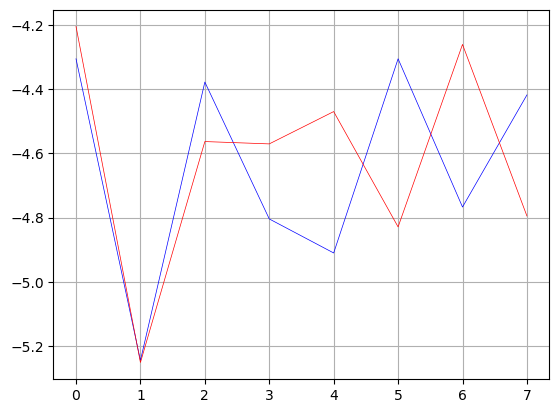

In [169]:
x_ax_SW174769_3 = range(len(X_test_SW174769_3))
plt.plot(x_ax_SW174769_3, y_test_SW174769_3, lw = 0.5, color = 'blue', label = 'observed')
plt.plot(x_ax_SW174769_3, y_pred_tuned_SW174769_3, lw = 0.5, color = 'red', label = 'predicted')
plt.grid()
plt.show()


In [170]:
eNet_AC50_CV_SW174769_3 = ElasticNetCV(alphas = alphas, cv =10)
mymodel_SW174769_3 = eNet_AC50_CV_SW174769_3.fit (X_train_SW174769_3, y_train_SW174769_3)

In [171]:
print (mymodel_SW174769_3.alpha_)

0.2


In [172]:
print (mymodel_SW174769_3.intercept_)

-4.319608967894946


In [173]:
print (mymodel_SW174769_3.coef_)

[ 0.  0. -0. ...  0.  0. -0.]


In [174]:
y_pred_SW174769_3 = mymodel_SW174769_3.predict(X_test_SW174769_3)

In [175]:
score_2_SW174769_3= mymodel_SW174769_3.score(X_test_SW174769_3, y_test_SW174769_3)
mse_2_SW174769_3 = mean_squared_error (y_test_SW174769_3, y_pred_SW174769_3)
print ('R2:{0:4f}, MSE:{1:4f}, RMSE:{2:4f}'
       .format(score_2_SW174769_3, mse_2_SW174769_3, np.sqrt(mse_tuned_SW174769_3)))

R2:-0.914654, MSE:0.197178, RMSE:0.347436


In [176]:
importance_SW174769_3 = mymodel_SW174769_3.coef_
# summarize feature importance
for i,v in enumerate(importance_SW174769_3):
 print('Feature: %0d, Score: %.10f' % (i,v))
# plot feature importance
pyplot.bar([x for x in range(len(importance_SW174769_3))], importance_SW174769_3)
pyplot.show()

Feature: 0, Score: 0.0000000000
Feature: 1, Score: 0.0000000000
Feature: 2, Score: -0.0000000000
Feature: 3, Score: -0.0000000000
Feature: 4, Score: 0.0000000000
Feature: 5, Score: 0.0000000000
Feature: 6, Score: 0.0000000000
Feature: 7, Score: 0.0000000000
Feature: 8, Score: -0.0000000000
Feature: 9, Score: 0.0000000000
Feature: 10, Score: -0.0000000000
Feature: 11, Score: -0.0000000000
Feature: 12, Score: -0.0000000000
Feature: 13, Score: 0.0000000000
Feature: 14, Score: -0.0000000000
Feature: 15, Score: 0.0000000000
Feature: 16, Score: 0.0000000000
Feature: 17, Score: 0.0000000000
Feature: 18, Score: 0.0000000000
Feature: 19, Score: 0.0000000000
Feature: 20, Score: -0.0000000000
Feature: 21, Score: 0.0000000000
Feature: 22, Score: -0.0000000000
Feature: 23, Score: 0.0000000000
Feature: 24, Score: 0.0000000000
Feature: 25, Score: -0.0000000000
Feature: 26, Score: 0.0000000000
Feature: 27, Score: 0.0000000000
Feature: 28, Score: 0.0000000000
Feature: 29, Score: -0.0000000000
Feature: 

NameError: name 'pyplot' is not defined

In [177]:
feature_score_SW174769_3 = pd.DataFrame([x for x in range(len(importance_SW174769_3))], importance_SW174769_3)
feature_score_SW174769_3.head(5)


,0
0.0,0
0.0,1
-0.0,2
-0.0,3
0.0,4


<AxesSubplot:>

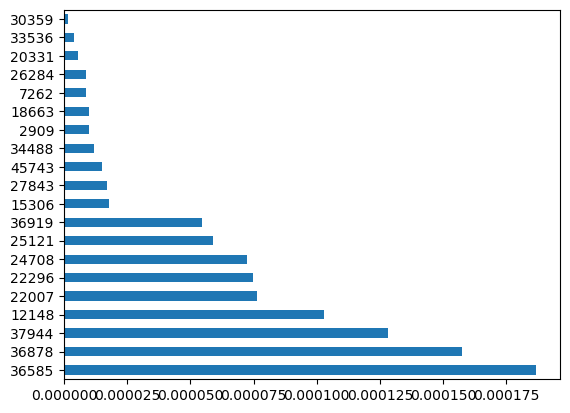

In [178]:
feat_importances_SW174769_3 = pd.Series(mymodel_SW174769_3.coef_)
feat_importances_SW174769_3.nlargest(20).plot(kind='barh')

In [ ]:
df2.iloc[:, 36586]

In [ ]:
genes_important_SW174769_3 = df2.iloc[:, [36586, 36879, 37945, 12149, 22008, 22297, 24709, 25122, 36920, 15307]]
genes_important_SW174769_3


3rd compound....

In [181]:
y_SW202558_2= np.array(l_merged_all_5["SW202558-2"])

In [182]:
X_train_SW202558_2, X_test_SW202558_2, y_train_SW202558_2, y_test_SW202558_2 = train_test_split (X_all, y_SW202558_2, test_size = 0.25) 


In [ ]:
for a in alphas:
    eNet_AC50_SW202558_2 = ElasticNet (alpha = a).fit(X_all, y_SW202558_2)
    score_SW202558_2 = eNet_AC50.score(X_all, y_SW202558_2)
    y_pred_SW202558_2 = eNet_AC50.predict (X_all)
    mse_SW202558_2 = mean_squared_error (y_SW202558_2, y_pred_SW202558_2)
    print ('Alpha:{0:4f}, R2:{1:4f}, MSE:{2:4f}, RMSE:{3:4f}'
          .format(a, score_SW202558_2, mse_SW202558_2, np.sqrt(mse_SW202558_2)))

In [ ]:
parametersGrid = {"max_iter": [1, 5, 10],
                "alpha": [0.0001, 0.001, 0.01, 0.1, 1, 10, 100],
                "l1_ratio": np.arange(0.0, 1.0, 0.1)}

eNet = ElasticNet()
gridsearch_SW202558_2 = GridSearchCV(eNet, parametersGrid, scoring='accuracy', cv=10)
grid_SW202558_2= gridsearch_SW202558_2.fit(X_train_SW202558_2, y_train_SW202558_2)
y_pred_SW202558_2 = grid_SW202558_2.predict(X_test_SW202558_2)
print("Best parameters from gridsearch: {}".format(gridsearch_SW202558_2.best_params_))
print("CV score=%0.3f" % gridsearch_SW202558_2.best_score_)
cv_results_SW202558_2 = gridsearch_SW202558_2.cv_results_
print(cv_results_SW202558_2)

In [183]:
eNet_AC50_tuned_SW202558_2 = ElasticNet (alpha = 0.0001).fit(X_train_SW202558_2, y_train_SW202558_2)


In [184]:
y_pred_tuned_SW202558_2 = eNet_AC50_tuned_SW202558_2.predict(X_test_SW202558_2)

In [185]:
score_tuned_SW202558_2 = eNet_AC50_tuned_SW202558_2.score(X_test_SW202558_2, y_test_SW202558_2)
mse_tuned_SW202558_2 = mean_squared_error (y_test_SW202558_2, y_pred_tuned_SW202558_2)
print ('R2:{0:4f}, MSE:{1:4f}, RMSE:{2:4f}'
        .format(score_tuned_SW202558_2, mse_tuned_SW202558_2, np.sqrt(mse_tuned_SW202558_2)))


R2:-0.313820, MSE:2.305349, RMSE:1.518337


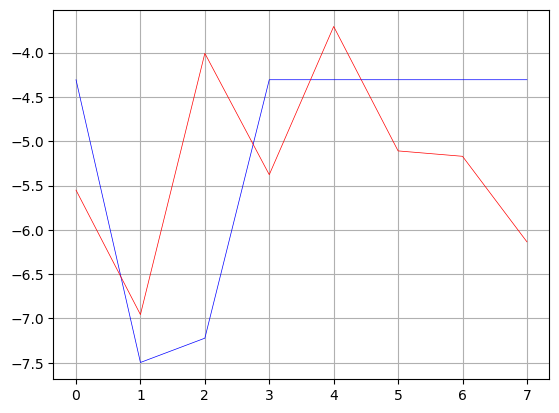

In [186]:
x_ax_SW202558_2 = range(len(X_test_SW202558_2))
plt.plot(x_ax_SW202558_2, y_test_SW202558_2, lw = 0.5, color = 'blue', label = 'observed')
plt.plot(x_ax_SW202558_2, y_pred_tuned_SW202558_2, lw = 0.5, color = 'red', label = 'predicted')
plt.grid()
plt.show()

In [187]:
eNet_AC50_CV_SW202558_2 = ElasticNetCV(alphas = alphas, cv =10)
mymodel_SW202558_2 = eNet_AC50_CV_SW202558_2.fit (X_train_SW202558_2, y_train_SW202558_2)

In [188]:
print (mymodel_SW202558_2.alpha_)

0.19899547738693468


In [189]:
print (mymodel_SW202558_2.intercept_)

-4.23892166956939


In [190]:
print (mymodel_SW202558_2.coef_)

[ 0.  0. -0. ...  0.  0. -0.]


In [191]:
y_pred_SW202558_2 = mymodel_SW202558_2.predict(X_test_SW202558_2)

In [192]:
score_2_SW202558_2= mymodel_SW202558_2.score(X_test_SW202558_2, y_test_SW202558_2)
mse_2_SW202558_2 = mean_squared_error (y_test_SW202558_2, y_pred_SW202558_2)
print ('R2:{0:4f}, MSE:{1:4f}, RMSE:{2:4f}'
       .format(score_2_SW202558_2, mse_2_SW202558_2, np.sqrt(mse_tuned_SW202558_2)))

R2:-1.650295, MSE:4.650449, RMSE:1.518337


In [193]:
importance_SW202558_2 = mymodel_SW202558_2.coef_
# summarize feature importance
for i,v in enumerate(importance_SW202558_2):
 print('Feature: %0d, Score: %.10f' % (i,v))
# plot feature importance
pyplot.bar([x for x in range(len(importance_SW202558_2))], importance_SW202558_2)
pyplot.show()

Feature: 0, Score: 0.0000000000
Feature: 1, Score: 0.0000000000
Feature: 2, Score: -0.0000000000
Feature: 3, Score: -0.0000000000
Feature: 4, Score: -0.0000000000
Feature: 5, Score: -0.0000000000
Feature: 6, Score: -0.0000000000
Feature: 7, Score: 0.0000000000
Feature: 8, Score: 0.0000000000
Feature: 9, Score: 0.0000000000
Feature: 10, Score: -0.0000000000
Feature: 11, Score: -0.0000000000
Feature: 12, Score: -0.0000000000
Feature: 13, Score: 0.0000000000
Feature: 14, Score: -0.0000000000
Feature: 15, Score: 0.0000000000
Feature: 16, Score: -0.0000000000
Feature: 17, Score: 0.0000000000
Feature: 18, Score: -0.0000000000
Feature: 19, Score: -0.0000000000
Feature: 20, Score: 0.0000000000
Feature: 21, Score: 0.0000000000
Feature: 22, Score: -0.0000000000
Feature: 23, Score: -0.0000000000
Feature: 24, Score: -0.0000000000
Feature: 25, Score: -0.0000000000
Feature: 26, Score: 0.0000000000
Feature: 27, Score: 0.0000000000
Feature: 28, Score: -0.0000000000
Feature: 29, Score: -0.0000000000
Fe

NameError: name 'pyplot' is not defined

In [194]:
feature_score_SW202558_2 = pd.DataFrame([x for x in range(len(importance_SW202558_2))], importance_SW202558_2)
feature_score_SW202558_2.head(5)


,0
0.0,0
0.0,1
-0.0,2
-0.0,3
-0.0,4


<AxesSubplot:>

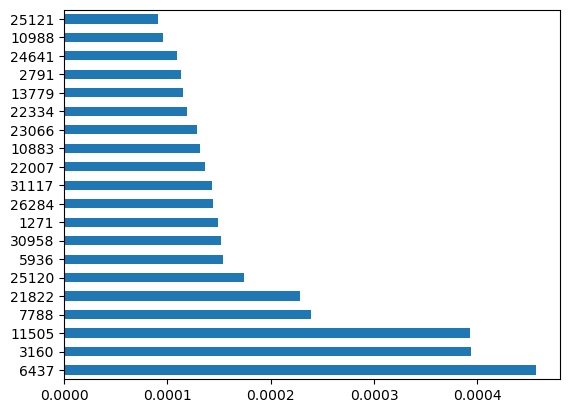

In [195]:
feat_importances_SW202558_2 = pd.Series(mymodel_SW202558_2.coef_)
feat_importances_SW202558_2.nlargest(20).plot(kind='barh')

In [ ]:
genes_important_SW202558_2 = df2.iloc[:, [6438, 3161, 11506, 7789, 21823, 25121, 5937, 30959, 1272, 26285]]
genes_important_SW202558_2

In [199]:
y_SW209495_1= np.array(l_merged_all_5["SW209495-1"])

In [200]:
X_train_SW209495_1, X_test_SW209495_1, y_train_SW209495_1, y_test_SW209495_1 = train_test_split (X_all, y_SW209495_1, test_size = 0.25) 


In [ ]:
for a in alphas:
    eNet_AC50_SW209495_1 = ElasticNet (alpha = a).fit(X_all, y_SW209495_1)
    score_SW209495_1 = eNet_AC50.score(X_all, y_SW209495_1)
    y_pred_SW209495_1 = eNet_AC50.predict (X_all)
    mse_SW209495_1 = mean_squared_error (y_SW209495_1, y_pred_SW209495_1)
    print ('Alpha:{0:4f}, R2:{1:4f}, MSE:{2:4f}, RMSE:{3:4f}'
          .format(a, score_SW209495_1, mse_SW209495_1, np.sqrt(mse_SW209495_1)))

In [ ]:
parametersGrid = {"max_iter": [1, 5, 10],
                "alpha": [0.0001, 0.001, 0.01, 0.1, 1, 10, 100],
                "l1_ratio": np.arange(0.0, 1.0, 0.1)}

eNet = ElasticNet()
gridsearch_SW209495_1 = GridSearchCV(eNet, parametersGrid, scoring='accuracy', cv=10)
grid_SW209495_1= gridsearch_SW209495_1.fit(X_train_SW209495_1, y_train_SW209495_1)
y_pred_SW209495_1 = grid_SW209495_1.predict(X_test_SW209495_1)
print("Best parameters from gridsearch: {}".format(gridsearch_SW209495_1.best_params_))
print("CV score=%0.3f" % gridsearch_SW209495_1.best_score_)
cv_results_SW209495_1 = gridsearch_SW209495_1.cv_results_
print(cv_results_SW209495_1)

In [201]:
eNet_AC50_tuned_SW209495_1 = ElasticNet (alpha = 0.0001).fit(X_train_SW209495_1, y_train_SW209495_1)

In [202]:
y_pred_tuned_SW209495_1 = eNet_AC50_tuned_SW209495_1.predict(X_test_SW209495_1)

In [203]:
score_tuned_SW209495_1 = eNet_AC50_tuned_SW209495_1.score(X_test_SW209495_1, y_test_SW209495_1)
mse_tuned_SW209495_1 = mean_squared_error (y_test_SW209495_1, y_pred_tuned_SW209495_1)
print ('R2:{0:4f}, MSE:{1:4f}, RMSE:{2:4f}'
        .format(score_tuned_SW209495_1, mse_tuned_SW209495_1, np.sqrt(mse_tuned_SW209495_1)))


R2:0.273194, MSE:0.148413, RMSE:0.385244


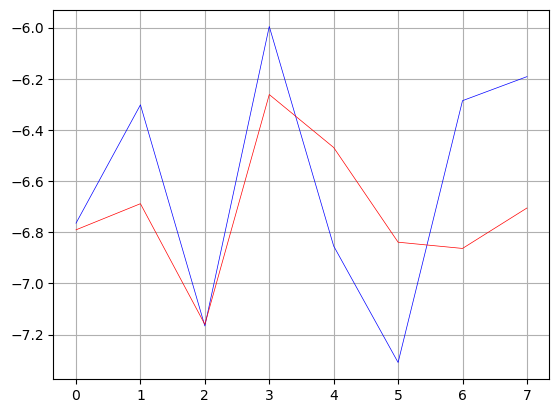

In [204]:
x_ax_SW209495_1 = range(len(X_test_SW209495_1))
plt.plot(x_ax_SW209495_1, y_test_SW209495_1, lw = 0.5, color = 'blue', label = 'observed')
plt.plot(x_ax_SW209495_1, y_pred_tuned_SW209495_1, lw = 0.5, color = 'red', label = 'predicted')
plt.grid()
plt.show()


In [205]:
eNet_AC50_CV_SW209495_1 = ElasticNetCV(alphas = alphas, cv =10)

In [206]:
mymodel_SW209495_1 = eNet_AC50_CV_SW209495_1.fit (X_train_SW209495_1, y_train_SW209495_1)

In [207]:
print (mymodel_SW209495_1.alpha_)

0.2


In [208]:
print (mymodel_SW209495_1.intercept_)

-6.186628716075546


In [209]:
print (mymodel_SW209495_1.coef_)

[ 0. -0. -0. ...  0.  0. -0.]


In [210]:
y_pred_SW209495_1 = mymodel_SW209495_1.predict(X_test_SW209495_1)

In [211]:
score_2_SW209495_1= mymodel_SW209495_1.score(X_test_SW209495_1, y_test_SW209495_1)
mse_2_SW209495_1 = mean_squared_error (y_test_SW209495_1, y_pred_SW209495_1)
print ('R2:{0:4f}, MSE:{1:4f}, RMSE:{2:4f}'
       .format(score_2_SW209495_1, mse_2_SW209495_1, np.sqrt(mse_tuned_SW209495_1)))


R2:-1.846307, MSE:0.581212, RMSE:0.385244


In [212]:
importance_SW209495_1 = mymodel_SW209495_1.coef_
# summarize feature importance
for i,v in enumerate(importance_SW209495_1):
 print('Feature: %0d, Score: %.10f' % (i,v))
# plot feature importance
pyplot.bar([x for x in range(len(importance_SW209495_1))], importance_SW209495_1)
pyplot.show()


Feature: 0, Score: 0.0000000000
Feature: 1, Score: -0.0000000000
Feature: 2, Score: -0.0000000000
Feature: 3, Score: -0.0000000000
Feature: 4, Score: 0.0000000000
Feature: 5, Score: -0.0000000000
Feature: 6, Score: -0.0000000000
Feature: 7, Score: -0.0000000000
Feature: 8, Score: 0.0000000000
Feature: 9, Score: 0.0000000000
Feature: 10, Score: 0.0000000000
Feature: 11, Score: 0.0000000000
Feature: 12, Score: 0.0000000000
Feature: 13, Score: 0.0000000000
Feature: 14, Score: -0.0000000000
Feature: 15, Score: 0.0000000000
Feature: 16, Score: 0.0000000000
Feature: 17, Score: -0.0000000000
Feature: 18, Score: 0.0000000000
Feature: 19, Score: 0.0000000000
Feature: 20, Score: -0.0000000000
Feature: 21, Score: -0.0000000000
Feature: 22, Score: -0.0000000000
Feature: 23, Score: 0.0000000000
Feature: 24, Score: 0.0000000000
Feature: 25, Score: -0.0000000000
Feature: 26, Score: 0.0000000000
Feature: 27, Score: -0.0000000000
Feature: 28, Score: -0.0000000000
Feature: 29, Score: -0.0000000000
Featu

NameError: name 'pyplot' is not defined

In [213]:
feature_score_SW209495_1 = pd.DataFrame([x for x in range(len(importance_SW209495_1))], importance_SW209495_1)
feature_score_SW209495_1.head(5)


,0
0.0,0
-0.0,1
-0.0,2
-0.0,3
0.0,4


<AxesSubplot:>

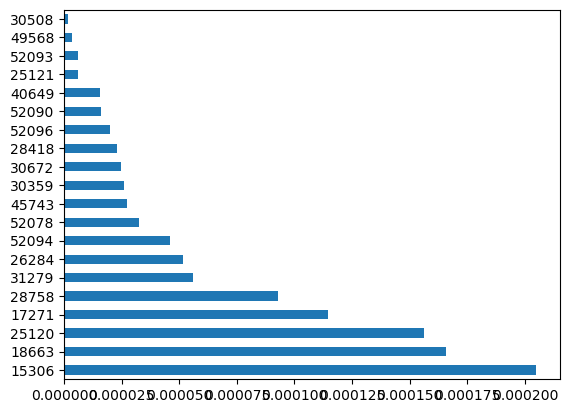

In [214]:
feat_importances_SW209495_1 = pd.Series(mymodel_SW209495_1.coef_)
feat_importances_SW209495_1.nlargest(20).plot(kind='barh')


In [ ]:
genes_important_SW209495_1 = df2.iloc[:, [15307, 18664, 25121, 17272, 28759, 31280, 26285, 52095, 52079, 45744]]
genes_important_SW209495_1


In [216]:
y_SW209496_1= np.array(l_merged_all_5["SW209496-1"])

In [217]:
X_train_SW209496_1, X_test_SW209496_1, y_train_SW209496_1, y_test_SW209496_1 = train_test_split (X_all, y_SW209496_1, test_size = 0.25)

In [ ]:
for a in alphas:
    eNet_AC50_SW209496_1 = ElasticNet (alpha = a).fit(X_all, y_SW209496_1)
    score_SW209496_1 = eNet_AC50.score(X_all, y_SW209496_1)
    y_pred_SW209496_1 = eNet_AC50.predict (X_all)
    mse_SW209496_1 = mean_squared_error (y_SW209496_1, y_pred_SW209496_1)
    print ('Alpha:{0:4f}, R2:{1:4f}, MSE:{2:4f}, RMSE:{3:4f}'
          .format(a, score_SW209496_1, mse_SW209496_1, np.sqrt(mse_SW209496_1)))


In [ ]:
parametersGrid = {"max_iter": [1, 5, 10],
                "alpha": [0.0001, 0.001, 0.01, 0.1, 1, 10, 100],
                "l1_ratio": np.arange(0.0, 1.0, 0.1)}

eNet = ElasticNet()
gridsearch_SW209496_1 = GridSearchCV(eNet, parametersGrid, scoring='accuracy', cv=10)
grid_SW209496_1= gridsearch_SW209496_1.fit(X_train_SW209496_1, y_train_SW209496_1)
y_pred_SW209496_1 = grid_SW209496_1.predict(X_test_SW209496_1)
print("Best parameters from gridsearch: {}".format(gridsearch_SW209496_1.best_params_))
print("CV score=%0.3f" % gridsearch_SW209496_1.best_score_)
cv_results_SW209496_1 = gridsearch_SW209496_1.cv_results_
print(cv_results_SW209496_1)


In [218]:
eNet_AC50_tuned_SW209496_1 = ElasticNet (alpha = 0.0001).fit(X_train_SW209496_1, y_train_SW209496_1)

In [219]:
y_pred_tuned_SW209496_1 = eNet_AC50_tuned_SW209496_1.predict(X_test_SW209496_1)

In [220]:
score_tuned_SW209496_1 = eNet_AC50_tuned_SW209496_1.score(X_test_SW209496_1, y_test_SW209496_1)
mse_tuned_SW209496_1 = mean_squared_error (y_test_SW209496_1, y_pred_tuned_SW209496_1)
print ('R2:{0:4f}, MSE:{1:4f}, RMSE:{2:4f}'
        .format(score_tuned_SW209496_1, mse_tuned_SW209496_1, np.sqrt(mse_tuned_SW209496_1)))


R2:-0.355356, MSE:0.213810, RMSE:0.462396


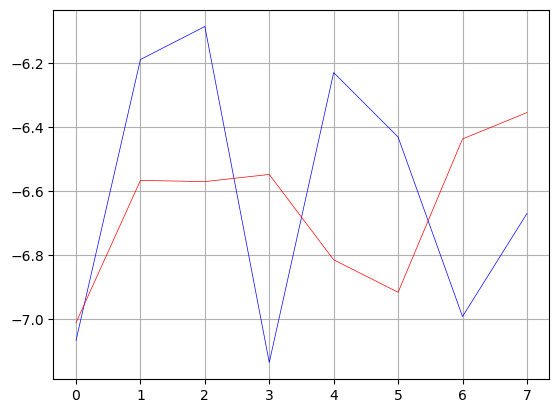

In [221]:
x_ax_SW209496_1 = range(len(X_test_SW209496_1))
plt.plot(x_ax_SW209496_1, y_test_SW209496_1, lw = 0.5, color = 'blue', label = 'observed')
plt.plot(x_ax_SW209496_1, y_pred_tuned_SW209496_1, lw = 0.5, color = 'red', label = 'predicted')
plt.grid()
plt.show()


In [222]:
eNet_AC50_CV_SW209496_1 = ElasticNetCV(alphas = alphas, cv =10)
mymodel_SW209496_1 = eNet_AC50_CV_SW209496_1.fit (X_train_SW209496_1, y_train_SW209496_1)


In [223]:
print (mymodel_SW209496_1.alpha_)

0.19698643216080403


In [224]:
print (mymodel_SW209496_1.intercept_)

-6.057512042047099


In [225]:
print (mymodel_SW209496_1.coef_)

[ 0.  0. -0. ...  0.  0. -0.]


In [226]:
y_pred_SW209496_1 = mymodel_SW209496_1.predict(X_test_SW209496_1)

In [227]:
score_2_SW209496_1= mymodel_SW209496_1.score(X_test_SW209496_1, y_test_SW209496_1)
mse_2_SW209496_1 = mean_squared_error (y_test_SW209496_1, y_pred_SW209496_1)
print ('R2:{0:4f}, MSE:{1:4f}, RMSE:{2:4f}'
       .format(score_2_SW209496_1, mse_2_SW209496_1, np.sqrt(mse_tuned_SW209496_1)))


R2:-1.102513, MSE:0.331675, RMSE:0.462396


In [228]:
importance_SW209496_1 = mymodel_SW209496_1.coef_
# summarize feature importance
for i,v in enumerate(importance_SW209496_1):
 print('Feature: %0d, Score: %.10f' % (i,v))
# plot feature importance
pyplot.bar([x for x in range(len(importance_SW209496_1))], importance_SW209496_1)
pyplot.show()


Feature: 0, Score: 0.0000000000
Feature: 1, Score: 0.0000000000
Feature: 2, Score: -0.0000000000
Feature: 3, Score: 0.0000000000
Feature: 4, Score: -0.0000000000
Feature: 5, Score: -0.0000000000
Feature: 6, Score: -0.0000000000
Feature: 7, Score: -0.0000000000
Feature: 8, Score: -0.0000000000
Feature: 9, Score: -0.0000000000
Feature: 10, Score: -0.0000000000
Feature: 11, Score: -0.0000000000
Feature: 12, Score: 0.0000000000
Feature: 13, Score: -0.0000000000
Feature: 14, Score: -0.0000000000
Feature: 15, Score: 0.0000000000
Feature: 16, Score: 0.0000000000
Feature: 17, Score: -0.0000000000
Feature: 18, Score: 0.0000000000
Feature: 19, Score: -0.0000000000
Feature: 20, Score: -0.0000000000
Feature: 21, Score: -0.0000000000
Feature: 22, Score: -0.0000000000
Feature: 23, Score: 0.0000000000
Feature: 24, Score: -0.0000000000
Feature: 25, Score: -0.0000000000
Feature: 26, Score: 0.0000000000
Feature: 27, Score: -0.0000000000
Feature: 28, Score: -0.0000000000
Feature: 29, Score: -0.0000000000

NameError: name 'pyplot' is not defined

In [229]:
feature_score_SW209496_1 = pd.DataFrame([x for x in range(len(importance_SW209496_1))], importance_SW209496_1)
feature_score_SW209496_1.head(5)


,0
0.0,0
0.0,1
-0.0,2
0.0,3
-0.0,4


<AxesSubplot:>

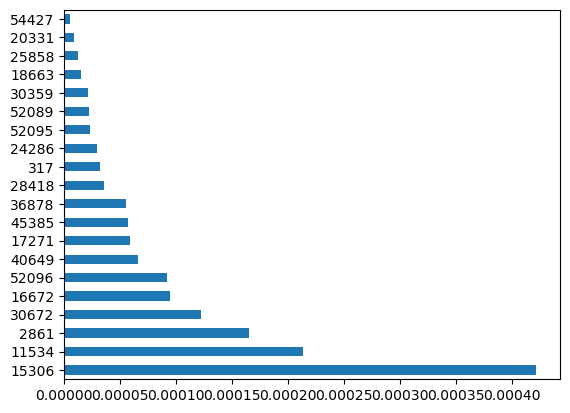

In [230]:
feat_importances_SW209496_1 = pd.Series(mymodel_SW209496_1.coef_)
feat_importances_SW209496_1.nlargest(20).plot(kind='barh')


In [ ]:
genes_important_SW209496_1 = df2.iloc[:, [15307, 11535, 2862, 30673, 16673, 52097, 40650, 17272, 45386, 36879]]
genes_important_SW209496_1

In [232]:
y_SW209497_1= np.array(l_merged_all_5["SW209497-1"])

In [233]:
X_train_SW209497_1, X_test_SW209497_1, y_train_SW209497_1, y_test_SW209497_1 = train_test_split (X_all, y_SW209497_1, test_size = 0.25)

In [ ]:
for a in alphas:
    eNet_AC50_SW209497_1 = ElasticNet (alpha = a).fit(X_all, y_SW209497_1)
    score_SW209497_1 = eNet_AC50.score(X_all, y_SW209497_1)
    y_pred_SW209497_1 = eNet_AC50.predict (X_all)
    mse_SW209497_1 = mean_squared_error (y_SW209497_1, y_pred_SW209497_1)
    print ('Alpha:{0:4f}, R2:{1:4f}, MSE:{2:4f}, RMSE:{3:4f}'
          .format(a, score_SW209497_1, mse_SW209497_1, np.sqrt(mse_SW209497_1)))


In [ ]:
parametersGrid = {"max_iter": [1, 5, 10],
                "alpha": [0.0001, 0.001, 0.01, 0.1, 1, 10, 100],
                "l1_ratio": np.arange(0.0, 1.0, 0.1)}

eNet = ElasticNet()
gridsearch_SW209497_1 = GridSearchCV(eNet, parametersGrid, scoring='accuracy', cv=10)
grid_SW209497_1= gridsearch_SW209497_1.fit(X_train_SW209497_1, y_train_SW209497_1)
y_pred_SW209497_1 = grid_SW209497_1.predict(X_test_SW209497_1)
print("Best parameters from gridsearch: {}".format(gridsearch_SW209497_1.best_params_))
print("CV score=%0.3f" % gridsearch_SW209497_1.best_score_)
cv_results_SW209497_1 = gridsearch_SW209497_1.cv_results_
print(cv_results_SW209497_1)


In [234]:
eNet_AC50_tuned_SW209497_1 = ElasticNet (alpha = 0.0001).fit(X_train_SW209497_1, y_train_SW209497_1)

In [235]:
y_pred_tuned_SW209497_1 = eNet_AC50_tuned_SW209497_1.predict(X_test_SW209497_1)

In [236]:
score_tuned_SW209497_1 = eNet_AC50_tuned_SW209497_1.score(X_test_SW209497_1, y_test_SW209497_1)
mse_tuned_SW209497_1 = mean_squared_error (y_test_SW209497_1, y_pred_tuned_SW209497_1)
print ('R2:{0:4f}, MSE:{1:4f}, RMSE:{2:4f}'
        .format(score_tuned_SW209497_1, mse_tuned_SW209497_1, np.sqrt(mse_tuned_SW209497_1)))


R2:-3.499115, MSE:0.510749, RMSE:0.714667


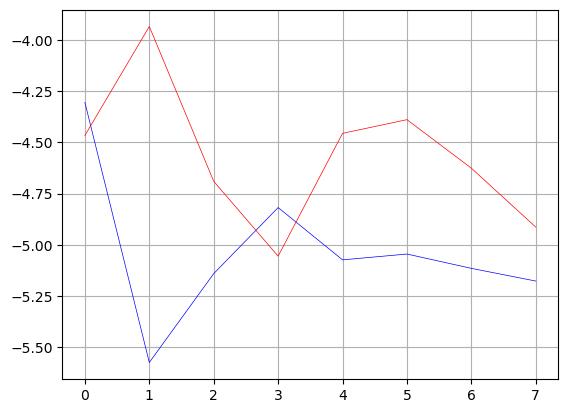

In [237]:
x_ax_SW209497_1 = range(len(X_test_SW209497_1))
plt.plot(x_ax_SW209497_1, y_test_SW209497_1, lw = 0.5, color = 'blue', label = 'observed')
plt.plot(x_ax_SW209497_1, y_pred_tuned_SW209497_1, lw = 0.5, color = 'red', label = 'predicted')
plt.grid()
plt.show()


In [238]:
eNet_AC50_CV_SW209497_1 = ElasticNetCV(alphas = alphas, cv =10)
mymodel_SW209497_1 = eNet_AC50_CV_SW209497_1.fit (X_train_SW209497_1, y_train_SW209497_1)


In [239]:
print (mymodel_SW209497_1.alpha_)

0.03827185929648241


In [240]:
print (mymodel_SW209497_1.intercept_)

-4.62909764829938


In [241]:
print (mymodel_SW209497_1.coef_)

[ 0.  0. -0. ...  0.  0. -0.]


In [242]:
y_pred_SW209497_1 = mymodel_SW209497_1.predict(X_test_SW209497_1)

In [243]:
score_2_SW209497_1= mymodel_SW209497_1.score(X_test_SW209497_1, y_test_SW209497_1)
mse_2_SW209497_1 = mean_squared_error (y_test_SW209497_1, y_pred_SW209497_1)
print ('R2:{0:4f}, MSE:{1:4f}, RMSE:{2:4f}'
       .format(score_2_SW209497_1, mse_2_SW209497_1, np.sqrt(mse_tuned_SW209497_1)))


R2:-3.203252, MSE:0.477162, RMSE:0.714667


In [244]:
importance_SW209497_1 = mymodel_SW209497_1.coef_
# summarize feature importance
for i,v in enumerate(importance_SW209497_1):
    print('Feature: %0d, Score: %.10f' % (i,v))
# plot feature importance
pyplot.bar([x for x in range(len(importance_SW209497_1))], importance_SW209497_1)
pyplot.show()


Feature: 0, Score: 0.0000000000
Feature: 1, Score: 0.0000000000
Feature: 2, Score: -0.0000000000
Feature: 3, Score: -0.0000000000
Feature: 4, Score: -0.0000000000
Feature: 5, Score: -0.0000000000
Feature: 6, Score: -0.0000000000
Feature: 7, Score: -0.0000000000
Feature: 8, Score: -0.0000000000
Feature: 9, Score: -0.0000000000
Feature: 10, Score: -0.0000000000
Feature: 11, Score: -0.0000000000
Feature: 12, Score: -0.0000000000
Feature: 13, Score: 0.0000000000
Feature: 14, Score: -0.0000000000
Feature: 15, Score: 0.0000000000
Feature: 16, Score: 0.0000000000
Feature: 17, Score: -0.0000000000
Feature: 18, Score: 0.0000000000
Feature: 19, Score: -0.0000000000
Feature: 20, Score: -0.0000000000
Feature: 21, Score: -0.0000000000
Feature: 22, Score: -0.0000000000
Feature: 23, Score: -0.0000000000
Feature: 24, Score: -0.0000000000
Feature: 25, Score: -0.0000000000
Feature: 26, Score: 0.0000000000
Feature: 27, Score: 0.0000000000
Feature: 28, Score: -0.0000000000
Feature: 29, Score: -0.000000000

NameError: name 'pyplot' is not defined

In [245]:
feature_score_SW209497_1 = pd.DataFrame([x for x in range(len(importance_SW209497_1))], importance_SW209497_1)
feature_score_SW209497_1.head(5)


,0
0.0,0
0.0,1
-0.0,2
-0.0,3
-0.0,4


<AxesSubplot:>

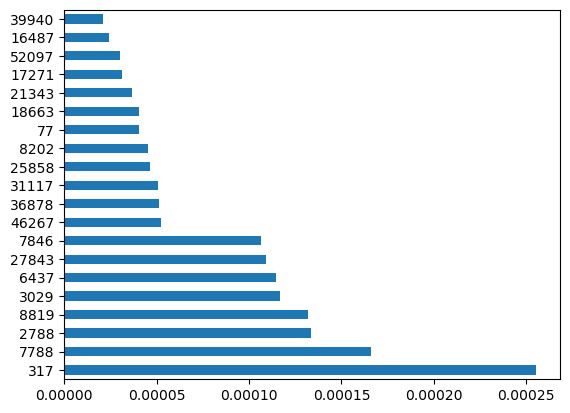

In [246]:
feat_importances_SW209497_1 = pd.Series(mymodel_SW209497_1.coef_)
feat_importances_SW209497_1.nlargest(20).plot(kind='barh')


In [ ]:
genes_important_SW209497_1 = df2.iloc[:, [318, 7789, 2789, 8820, 3030, 6438, 27844, 7847, 46368, 36879]]
genes_important_SW209497_1

### A for loop was tried (see the other notebook in this folder); however results from the for loop were selecting all features below 500th rank. The reason for which it is not running through the whole dataset is unclear, but most likely a memory related technical issue. The dataset is small enough (13 compounds) to finish runing them manually.

## Each compound separately:

In [256]:
y_SW209498_1= np.array(l_merged_all_5["SW209498-1"])

In [257]:
X_train_SW209498_1, X_test_SW209498_1, y_train_SW209498_1, y_test_SW209498_1 = train_test_split (X_all, y_SW209498_1, test_size = 0.25)


In [258]:
eNet_AC50_tuned_SW209498_1 = ElasticNet (alpha = 0.0001).fit(X_train_SW209498_1, y_train_SW209498_1)


In [259]:
y_pred_tuned_SW209498_1 = eNet_AC50_tuned_SW209498_1.predict(X_test_SW209498_1)

In [260]:
score_tuned_SW209498_1 = eNet_AC50_tuned_SW209498_1.score(X_test_SW209498_1, y_test_SW209498_1)
mse_tuned_SW209498_1 = mean_squared_error (y_test_SW209498_1, y_pred_tuned_SW209498_1)
print ('R2:{0:4f}, MSE:{1:4f}, RMSE:{2:4f}'
        .format(score_tuned_SW209498_1, mse_tuned_SW209498_1, np.sqrt(mse_tuned_SW209498_1)))


R2:-1.544339, MSE:0.523670, RMSE:0.723650


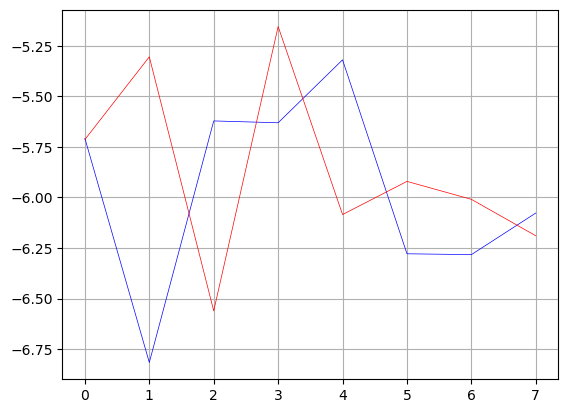

In [261]:
x_ax_SW209498_1 = range(len(X_test_SW209498_1))
plt.plot(x_ax_SW209498_1, y_test_SW209498_1, lw = 0.5, color = 'blue', label = 'observed')
plt.plot(x_ax_SW209498_1, y_pred_tuned_SW209498_1, lw = 0.5, color = 'red', label = 'predicted')
plt.grid()
plt.show()


In [262]:
eNet_AC50_CV_SW209498_1 = ElasticNetCV(alphas = alphas, cv =10)
mymodel_SW209498_1 = eNet_AC50_CV_SW209498_1.fit (X_train_SW209498_1, y_train_SW209498_1)


In [263]:
print (mymodel_SW209498_1.alpha_)

0.2


In [264]:
print (mymodel_SW209498_1.intercept_)

-4.4684191458916604


In [265]:
print (mymodel_SW209498_1.coef_)

[ 0.  0.  0. ...  0.  0. -0.]


In [266]:
y_pred_SW209498_1 = mymodel_SW209498_1.predict(X_test_SW209498_1)

In [267]:
score_2_SW209498_1= mymodel_SW209498_1.score(X_test_SW209498_1, y_test_SW209498_1)
mse_2_SW209498_1 = mean_squared_error (y_test_SW209498_1, y_pred_SW209498_1)
print ('R2:{0:4f}, MSE:{1:4f}, RMSE:{2:4f}'
       .format(score_2_SW209498_1, mse_2_SW209498_1, np.sqrt(mse_tuned_SW209498_1)))


R2:-0.792488, MSE:0.368926, RMSE:0.723650


<AxesSubplot:>

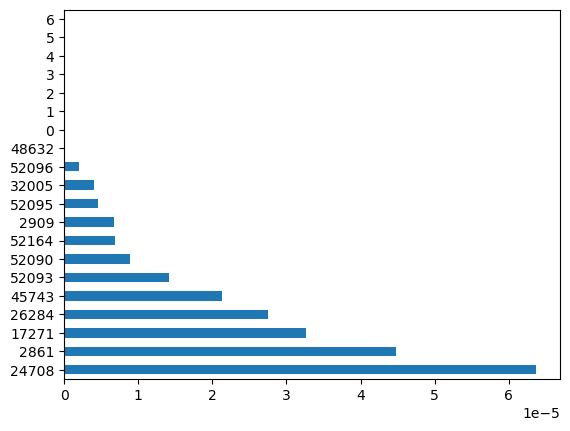

In [268]:
feat_importances_SW209498_1 = pd.Series(mymodel_SW209498_1.coef_)
feat_importances_SW209498_1.nlargest(20).plot(kind='barh')


In [ ]:
genes_important_SW209498_1 = df2.iloc[:, [24709, 2862, 17272, 26285, 45744, 52094, 52091, 52165, 2910, 52096]]
genes_important_SW209498_1


In [317]:
y_SW209499_1= np.array(l_merged_all_5["SW209499-1"])

In [318]:
X_train_SW209499_1, X_test_SW209499_1, y_train_SW209499_1, y_test_SW209499_1 = train_test_split (X_all, y_SW209499_1, test_size = 0.25)


In [319]:
eNet_AC50_tuned_SW209499_1 = ElasticNet (alpha = 0.0001).fit(X_train_SW209499_1, y_train_SW209499_1)


In [320]:
y_pred_tuned_SW209499_1 = eNet_AC50_tuned_SW209499_1.predict(X_test_SW209499_1)

In [321]:
score_tuned_SW209499_1 = eNet_AC50_tuned_SW209499_1.score(X_test_SW209499_1, y_test_SW209499_1)
mse_tuned_SW209499_1 = mean_squared_error (y_test_SW209499_1, y_pred_tuned_SW209499_1)
print ('R2:{0:4f}, MSE:{1:4f}, RMSE:{2:4f}'
        .format(score_tuned_SW209499_1, mse_tuned_SW209499_1, np.sqrt(mse_tuned_SW209499_1)))


R2:-0.952738, MSE:0.175384, RMSE:0.418789


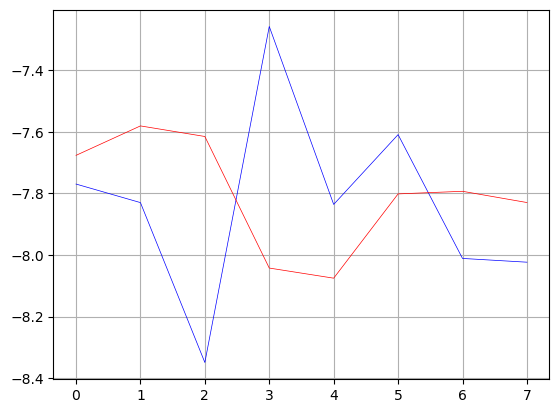

In [322]:
x_ax_SW209499_1 = range(len(X_test_SW209499_1))
plt.plot(x_ax_SW209499_1, y_test_SW209499_1, lw = 0.5, color = 'blue', label = 'observed')
plt.plot(x_ax_SW209499_1, y_pred_tuned_SW209499_1, lw = 0.5, color = 'red', label = 'predicted')
plt.grid()
plt.show()


In [276]:
eNet_AC50_CV_SW209499_1 = ElasticNetCV(alphas = alphas, cv =10)
mymodel_SW209499_1 = eNet_AC50_CV_SW209499_1.fit (X_train_SW209499_1, y_train_SW209499_1)


In [277]:
print (mymodel_SW209499_1.alpha_)

0.19899547738693468


In [278]:
print (mymodel_SW209499_1.intercept_)

-8.529657297621869


In [279]:
print (mymodel_SW209499_1.coef_)

[ 0.  0. -0. ...  0.  0. -0.]


In [280]:
y_pred_SW209499_1 = mymodel_SW209499_1.predict(X_test_SW209499_1)

In [281]:
score_2_SW209499_1= mymodel_SW209499_1.score(X_test_SW209499_1, y_test_SW209499_1)
mse_2_SW209499_1 = mean_squared_error (y_test_SW209499_1, y_pred_SW209499_1)
print ('R2:{0:4f}, MSE:{1:4f}, RMSE:{2:4f}'
       .format(score_2_SW209499_1, mse_2_SW209499_1, np.sqrt(mse_tuned_SW209499_1)))


R2:-2.380472, MSE:0.291448, RMSE:0.754195


<AxesSubplot:>

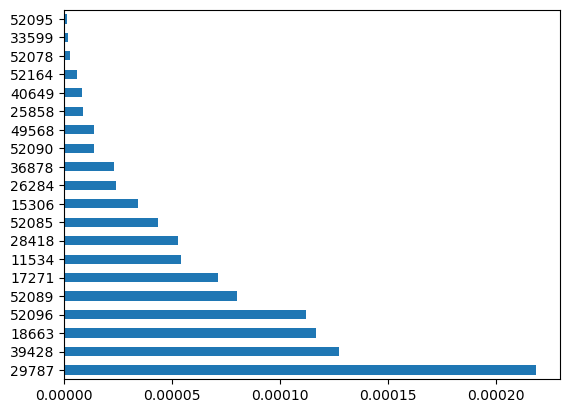

In [282]:
feat_importances_SW209499_1 = pd.Series(mymodel_SW209499_1.coef_)
feat_importances_SW209499_1.nlargest(20).plot(kind='barh')


In [ ]:
genes_important_SW209499_1 = df2.iloc[:, [29788, 39429, 18664, 52097, 52090, 17272, 11535, 28419, 52086, 15307]]
genes_important_SW209499_1

In [284]:
y_SW209500_1= np.array(l_merged_all_5["SW209500-1"])

In [285]:
X_train_SW209500_1, X_test_SW209500_1, y_train_SW209500_1, y_test_SW209500_1 = train_test_split (X_all, y_SW209500_1, test_size = 0.25)


In [286]:
eNet_AC50_tuned_SW209500_1 = ElasticNet (alpha = 0.0001).fit(X_train_SW209500_1, y_train_SW209500_1)


In [287]:
y_pred_tuned_SW209500_1 = eNet_AC50_tuned_SW209500_1.predict(X_test_SW209500_1)

In [288]:
score_tuned_SW209500_1 = eNet_AC50_tuned_SW209500_1.score(X_test_SW209500_1, y_test_SW209500_1)
mse_tuned_SW209500_1 = mean_squared_error (y_test_SW209500_1, y_pred_tuned_SW209500_1)
print ('R2:{0:4f}, MSE:{1:4f}, RMSE:{2:4f}'
        .format(score_tuned_SW209500_1, mse_tuned_SW209500_1, np.sqrt(mse_tuned_SW209500_1)))


R2:-53.625060, MSE:0.702266, RMSE:0.838013


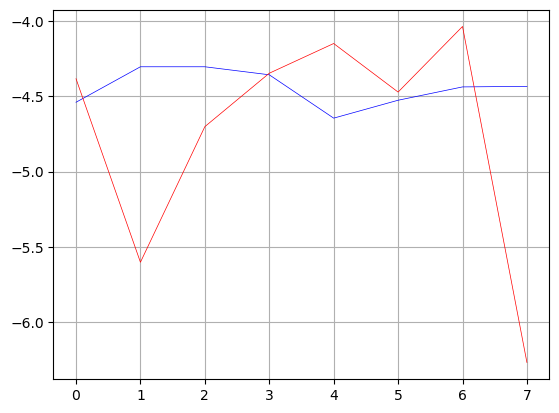

In [289]:
x_ax_SW209500_1 = range(len(X_test_SW209500_1))
plt.plot(x_ax_SW209500_1, y_test_SW209500_1, lw = 0.5, color = 'blue', label = 'observed')
plt.plot(x_ax_SW209500_1, y_pred_tuned_SW209500_1, lw = 0.5, color = 'red', label = 'predicted')
plt.grid()
plt.show()


In [290]:
eNet_AC50_CV_SW209500_1 = ElasticNetCV(alphas = alphas, cv =10)
mymodel_SW209500_1 = eNet_AC50_CV_SW209500_1.fit (X_train_SW209500_1, y_train_SW209500_1)


In [291]:
print (mymodel_SW209500_1.alpha_)

0.19899547738693468


In [292]:
print (mymodel_SW209500_1.intercept_)

-3.6710092143731847


In [293]:
print (mymodel_SW209500_1.coef_)

[ 0.  0.  0. ...  0.  0. -0.]


In [294]:
y_pred_SW209500_1 = mymodel_SW209500_1.predict(X_test_SW209500_1)

In [295]:
score_2_SW209500_1= mymodel_SW209500_1.score(X_test_SW209500_1, y_test_SW209500_1)
mse_2_SW209500_1 = mean_squared_error (y_test_SW209500_1, y_pred_SW209500_1)
print ('R2:{0:4f}, MSE:{1:4f}, RMSE:{2:4f}'
       .format(score_2_SW209500_1, mse_2_SW209500_1, np.sqrt(mse_tuned_SW209500_1)))


R2:-31.145003, MSE:0.413260, RMSE:0.838013


<AxesSubplot:>

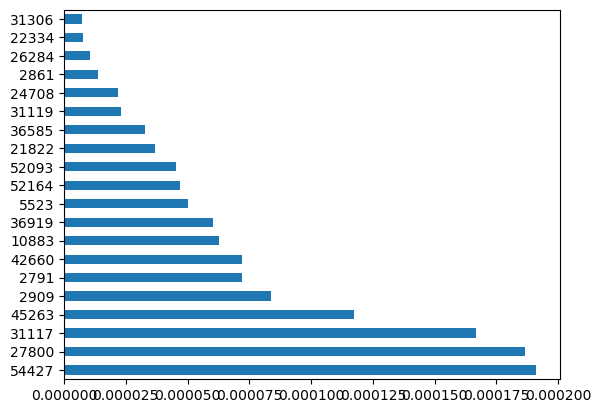

In [296]:
feat_importances_SW209500_1 = pd.Series(mymodel_SW209500_1.coef_)
feat_importances_SW209500_1.nlargest(20).plot(kind='barh')


In [ ]:
genes_important_SW209500_1 = df2.iloc[:, [54428, 27801, 31118, 45264, 2910, 2792, 42661, 10884, 36920, 5524]]
genes_important_SW209500_1


In [298]:
y_SW209501_1= np.array(l_merged_all_5["SW209501-1"])

In [299]:
X_train_SW209501_1, X_test_SW209501_1, y_train_SW209501_1, y_test_SW209501_1 = train_test_split (X_all, y_SW209501_1, test_size = 0.25)

In [300]:
eNet_AC50_tuned_SW209501_1 = ElasticNet (alpha = 0.0001).fit(X_train_SW209501_1, y_train_SW209501_1)

In [301]:
y_pred_tuned_SW209501_1 = eNet_AC50_tuned_SW209501_1.predict(X_test_SW209501_1)

In [302]:
score_tuned_SW209501_1 = eNet_AC50_tuned_SW209501_1.score(X_test_SW209501_1, y_test_SW209501_1)
mse_tuned_SW209501_1 = mean_squared_error (y_test_SW209501_1, y_pred_tuned_SW209501_1)
print ('R2:{0:4f}, MSE:{1:4f}, RMSE:{2:4f}'
        .format(score_tuned_SW209501_1, mse_tuned_SW209501_1, np.sqrt(mse_tuned_SW209501_1)))


R2:-0.495432, MSE:0.078623, RMSE:0.280397


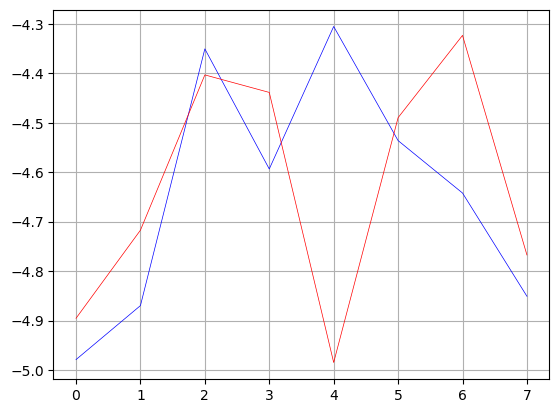

In [303]:
x_ax_SW209501_1 = range(len(X_test_SW209501_1))
plt.plot(x_ax_SW209501_1, y_test_SW209501_1, lw = 0.5, color = 'blue', label = 'observed')
plt.plot(x_ax_SW209501_1, y_pred_tuned_SW209501_1, lw = 0.5, color = 'red', label = 'predicted')
plt.grid()
plt.show()


In [304]:
eNet_AC50_CV_SW209501_1 = ElasticNetCV(alphas = alphas, cv =10)
mymodel_SW209501_1 = eNet_AC50_CV_SW209501_1.fit (X_train_SW209501_1, y_train_SW209501_1)


In [305]:
print (mymodel_SW209501_1.alpha_)

0.19799095477386935


In [306]:
print (mymodel_SW209501_1.intercept_)

-4.164911257781085


In [307]:
print (mymodel_SW209501_1.coef_)

[ 0. -0. -0. ...  0.  0. -0.]


In [308]:
y_pred_SW209501_1 = mymodel_SW209501_1.predict(X_test_SW209501_1)

In [309]:
score_2_SW209501_1= mymodel_SW209501_1.score(X_test_SW209501_1, y_test_SW209501_1)
mse_2_SW209501_1 = mean_squared_error (y_test_SW209501_1, y_pred_SW209501_1)
print ('R2:{0:4f}, MSE:{1:4f}, RMSE:{2:4f}'
       .format(score_2_SW209501_1, mse_2_SW209501_1, np.sqrt(mse_tuned_SW209501_1)))


R2:-0.493314, MSE:0.078511, RMSE:0.280397


<AxesSubplot:>

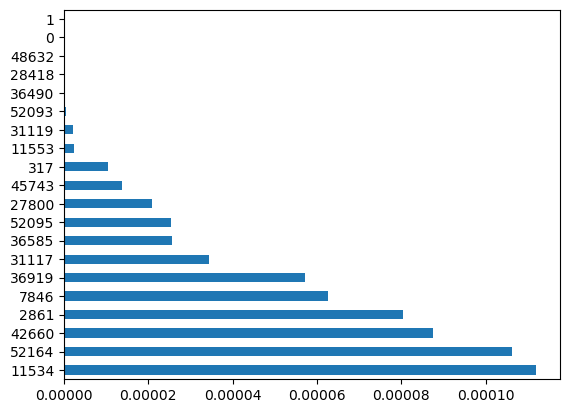

In [310]:
feat_importances_SW209501_1 = pd.Series(mymodel_SW209501_1.coef_)
feat_importances_SW209501_1.nlargest(20).plot(kind='barh')

In [ ]:
genes_important_SW209501_1 = df2.iloc[:, [11535, 52165, 42661, 2862, 7847, 36920, 31118, 36586, 52096, 27801]]
genes_important_SW209501_1


In [323]:
y_SW209502_1= np.array(l_merged_all_5["SW209502-1"])

In [324]:
X_train_SW209502_1, X_test_SW209502_1, y_train_SW209502_1, y_test_SW209502_1 = train_test_split (X_all, y_SW209502_1, test_size = 0.25)

In [325]:
eNet_AC50_tuned_SW209502_1 = ElasticNet (alpha = 0.0001).fit(X_train_SW209502_1, y_train_SW209502_1)


In [326]:
y_pred_tuned_SW209502_1 = eNet_AC50_tuned_SW209502_1.predict(X_test_SW209502_1)

In [316]:
score_tuned_SW209502_1 = eNet_AC50_tuned_SW209502_1.score(X_test_SW209502_1, y_test_SW209502_1)
mse_tuned_SW209502_1 = mean_squared_error (y_test_SW209502_1, y_pred_tuned_SW209502_1)
print ('R2:{0:4f}, MSE:{1:4f}, RMSE:{2:4f}'
        .format(score_tuned_SW209502_1, mse_tuned_SW209502_1, np.sqrt(mse_tuned_SW209502_1)))


R2:-6.593760, MSE:0.595971, RMSE:0.771991


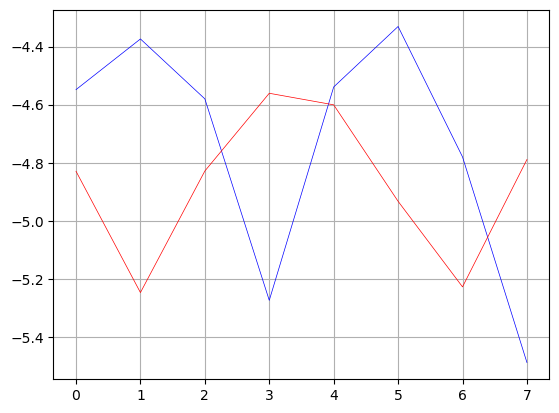

In [327]:
x_ax_SW209502_1 = range(len(X_test_SW209502_1))
plt.plot(x_ax_SW209502_1, y_test_SW209502_1, lw = 0.5, color = 'blue', label = 'observed')
plt.plot(x_ax_SW209502_1, y_pred_tuned_SW209502_1, lw = 0.5, color = 'red', label = 'predicted')
plt.grid()
plt.show()


In [328]:
eNet_AC50_CV_SW209502_1 = ElasticNetCV(alphas = alphas, cv =10)
mymodel_SW209502_1 = eNet_AC50_CV_SW209502_1.fit (X_train_SW209502_1, y_train_SW209502_1)


In [329]:
print (mymodel_SW209502_1.alpha_)

0.1929683417085427


In [330]:
print (mymodel_SW209502_1.intercept_)

-4.137743393752077


In [331]:
print (mymodel_SW209502_1.coef_)

[ 0. -0. -0. ...  0.  0. -0.]


In [332]:
y_pred_SW209502_1 = mymodel_SW209502_1.predict(X_test_SW209502_1)

In [333]:
score_2_SW209502_1= mymodel_SW209502_1.score(X_test_SW209502_1, y_test_SW209502_1)
mse_2_SW209502_1 = mean_squared_error (y_test_SW209502_1, y_pred_SW209502_1)
print ('R2:{0:4f}, MSE:{1:4f}, RMSE:{2:4f}'
       .format(score_2_SW209502_1, mse_2_SW209502_1, np.sqrt(mse_tuned_SW209502_1)))


R2:-1.107406, MSE:0.329543, RMSE:0.771991


<AxesSubplot:>

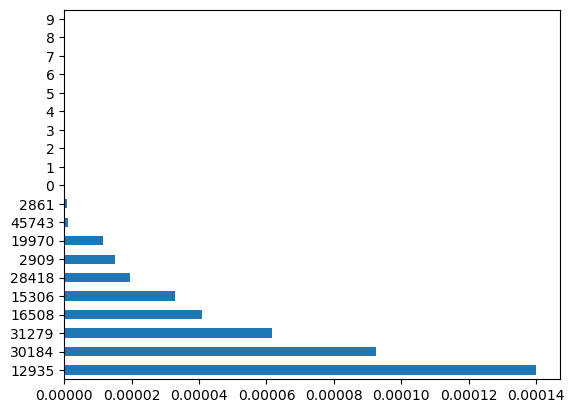

In [334]:
feat_importances_SW209502_1 = pd.Series(mymodel_SW209502_1.coef_)
feat_importances_SW209502_1.nlargest(20).plot(kind='barh')

In [ ]:
genes_important_SW209502_1 = df2.iloc[:, [12936, 30185, 31280, 16509, 15307, 28419, 2910, 19971, 45744, 2862]]
genes_important_SW209502_1


In [336]:
y_SW209503_1= np.array(l_merged_all_5["SW209503-1"])


In [337]:
X_train_SW209503_1, X_test_SW209503_1, y_train_SW209503_1, y_test_SW209503_1 = train_test_split (X_all, y_SW209503_1, test_size = 0.25)


In [338]:
eNet_AC50_tuned_SW209503_1 = ElasticNet (alpha = 0.0001).fit(X_train_SW209503_1, y_train_SW209503_1)

In [339]:
y_pred_tuned_SW209503_1 = eNet_AC50_tuned_SW209503_1.predict(X_test_SW209503_1)

In [340]:
score_tuned_SW209503_1 = eNet_AC50_tuned_SW209503_1.score(X_test_SW209503_1, y_test_SW209503_1)
mse_tuned_SW209503_1 = mean_squared_error (y_test_SW209503_1, y_pred_tuned_SW209503_1)
print ('R2:{0:4f}, MSE:{1:4f}, RMSE:{2:4f}'
        .format(score_tuned_SW209503_1, mse_tuned_SW209503_1, np.sqrt(mse_tuned_SW209503_1)))


R2:-1.140875, MSE:2.266766, RMSE:1.505578


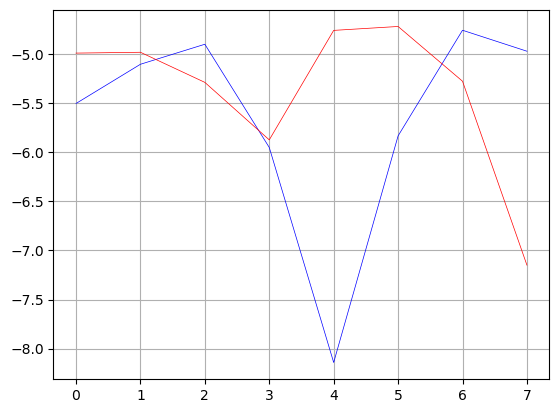

In [341]:
x_ax_SW209503_1 = range(len(X_test_SW209503_1))
plt.plot(x_ax_SW209503_1, y_test_SW209503_1, lw = 0.5, color = 'blue', label = 'observed')
plt.plot(x_ax_SW209503_1, y_pred_tuned_SW209503_1, lw = 0.5, color = 'red', label = 'predicted')
plt.grid()
plt.show()


In [342]:
eNet_AC50_CV_SW209503_1 = ElasticNetCV(alphas = alphas, cv =10)
mymodel_SW209503_1 = eNet_AC50_CV_SW209503_1.fit (X_train_SW209503_1, y_train_SW209503_1)


In [343]:
print (mymodel_SW209503_1.alpha_)

0.1929683417085427


In [344]:
print (mymodel_SW209503_1.intercept_)

-5.588789268040232


In [345]:
print (mymodel_SW209503_1.coef_)

[ 0. -0. -0. ...  0.  0. -0.]


In [346]:
y_pred_SW209503_1 = mymodel_SW209503_1.predict(X_test_SW209503_1)

In [347]:
score_2_SW209503_1= mymodel_SW209503_1.score(X_test_SW209503_1, y_test_SW209503_1)
mse_2_SW209503_1 = mean_squared_error (y_test_SW209503_1, y_pred_SW209503_1)
print ('R2:{0:4f}, MSE:{1:4f}, RMSE:{2:4f}'
       .format(score_2_SW209503_1, mse_2_SW209503_1, np.sqrt(mse_tuned_SW209503_1)))


R2:-0.143955, MSE:1.211224, RMSE:1.505578


<AxesSubplot:>

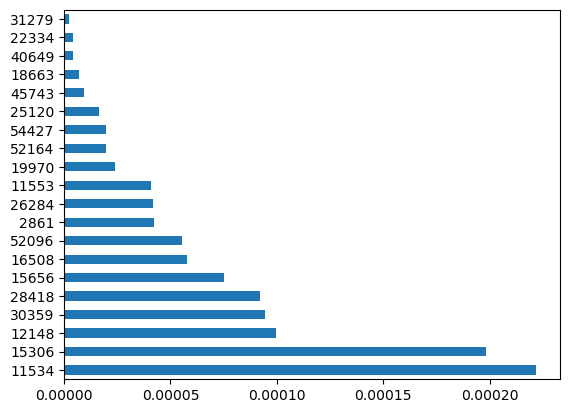

In [348]:
feat_importances_SW209503_1 = pd.Series(mymodel_SW209503_1.coef_)
feat_importances_SW209503_1.nlargest(20).plot(kind='barh')


In [ ]:
genes_important_SW209503_1 = df2.iloc[:, [11535, 15307, 12149, 30360, 28419, 15657, 16509, 52097, 2862, 26285]]
genes_important_SW209503_1

In [350]:
y_SW209504_1= np.array(l_merged_all_5["SW209504-1"])

In [351]:
X_train_SW209504_1, X_test_SW209504_1, y_train_SW209504_1, y_test_SW209504_1 = train_test_split (X_all, y_SW209504_1, test_size = 0.25)

In [352]:
eNet_AC50_tuned_SW209504_1 = ElasticNet (alpha = 0.0001).fit(X_train_SW209504_1, y_train_SW209504_1)

In [353]:
y_pred_tuned_SW209504_1 = eNet_AC50_tuned_SW209504_1.predict(X_test_SW209504_1)

In [354]:
score_tuned_SW209504_1 = eNet_AC50_tuned_SW209504_1.score(X_test_SW209504_1, y_test_SW209504_1)
mse_tuned_SW209504_1 = mean_squared_error (y_test_SW209504_1, y_pred_tuned_SW209504_1)
print ('R2:{0:4f}, MSE:{1:4f}, RMSE:{2:4f}'
        .format(score_tuned_SW209504_1, mse_tuned_SW209504_1, np.sqrt(mse_tuned_SW209504_1)))


R2:-27.633714, MSE:0.068792, RMSE:0.262282


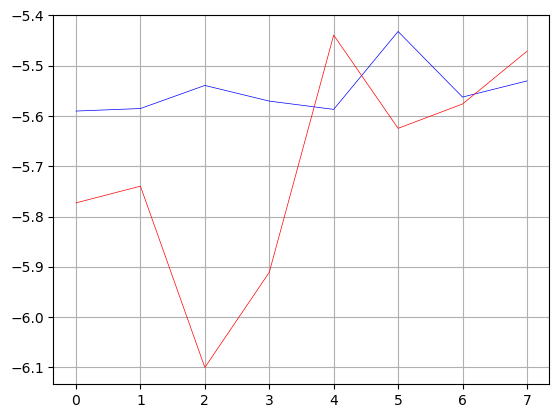

In [355]:
x_ax_SW209504_1 = range(len(X_test_SW209504_1))
plt.plot(x_ax_SW209504_1, y_test_SW209504_1, lw = 0.5, color = 'blue', label = 'observed')
plt.plot(x_ax_SW209504_1, y_pred_tuned_SW209504_1, lw = 0.5, color = 'red', label = 'predicted')
plt.grid()
plt.show()


In [356]:
eNet_AC50_CV_SW209504_1 = ElasticNetCV(alphas = alphas, cv =10)
mymodel_SW209504_1 = eNet_AC50_CV_SW209504_1.fit (X_train_SW209504_1, y_train_SW209504_1)


In [357]:
print (mymodel_SW209504_1.alpha_)

0.2


In [358]:
print (mymodel_SW209504_1.intercept_)

-5.582636589582425


In [359]:
print (mymodel_SW209504_1.coef_)

[ 0. -0. -0. ...  0.  0. -0.]


In [360]:
y_pred_SW209504_1 = mymodel_SW209504_1.predict(X_test_SW209504_1)

In [361]:
score_2_SW209504_1= mymodel_SW209504_1.score(X_test_SW209504_1, y_test_SW209504_1)
mse_2_SW209504_1 = mean_squared_error (y_test_SW209504_1, y_pred_SW209504_1)
print ('R2:{0:4f}, MSE:{1:4f}, RMSE:{2:4f}'
       .format(score_2_SW209504_1, mse_2_SW209504_1, np.sqrt(mse_tuned_SW209504_1)))


R2:-25.237862, MSE:0.063036, RMSE:0.262282


<AxesSubplot:>

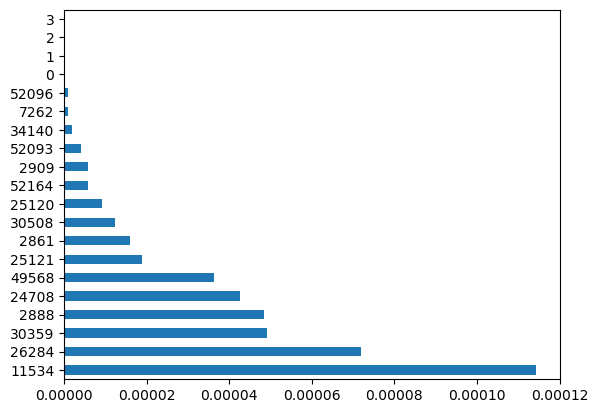

In [362]:
feat_importances_SW209504_1 = pd.Series(mymodel_SW209504_1.coef_)
feat_importances_SW209504_1.nlargest(20).plot(kind='barh')

In [ ]:
genes_important_SW209504_1 = df2.iloc[:, [11535, 26285, 30360, 2889, 24709, 49569, 25122, 2862, 30509, 25121]]
genes_important_SW209504_1

In [364]:
y_PAK4I= np.array(l_merged_all_5["PAK4i"])

In [365]:
X_train_PAK4I, X_test_PAK4I, y_train_PAK4I, y_test_PAK4I = train_test_split (X_all, y_PAK4I, test_size = 0.25)


In [366]:
eNet_AC50_tuned_PAK4I = ElasticNet (alpha = 0.0001).fit(X_train_PAK4I, y_train_PAK4I)


In [367]:
y_pred_tuned_PAK4I = eNet_AC50_tuned_PAK4I.predict(X_test_PAK4I)



In [368]:
score_tuned_PAK4I = eNet_AC50_tuned_PAK4I.score(X_test_PAK4I, y_test_PAK4I)
mse_tuned_PAK4I = mean_squared_error (y_test_PAK4I, y_pred_tuned_PAK4I)
print ('R2:{0:4f}, MSE:{1:4f}, RMSE:{2:4f}'
        .format(score_tuned_PAK4I, mse_tuned_PAK4I, np.sqrt(mse_tuned_PAK4I)))



R2:-5.682987, MSE:2.199870, RMSE:1.483196


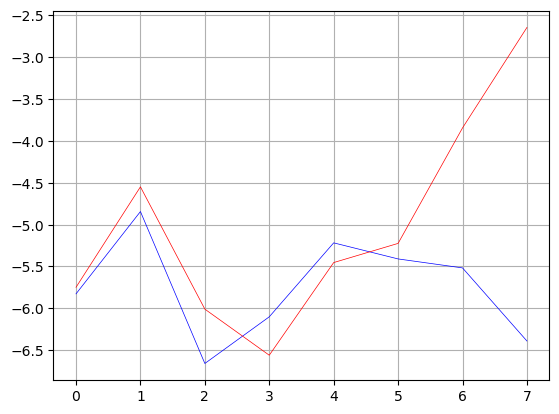

In [369]:
x_ax_PAK4I = range(len(X_test_PAK4I))
plt.plot(x_ax_PAK4I, y_test_PAK4I, lw = 0.5, color = 'blue', label = 'observed')
plt.plot(x_ax_PAK4I, y_pred_tuned_PAK4I, lw = 0.5, color = 'red', label = 'predicted')
plt.grid()
plt.show()



In [370]:
eNet_AC50_CV_PAK4I = ElasticNetCV(alphas = alphas, cv =10)
mymodel_PAK4I = eNet_AC50_CV_PAK4I.fit (X_train_PAK4I, y_train_PAK4I)


In [371]:
print (mymodel_PAK4I.alpha_)


0.2


In [372]:
print (mymodel_PAK4I.intercept_)


-5.655044324548563


In [373]:
print (mymodel_PAK4I.coef_)


[ 0.  0.  0. ...  0.  0. -0.]


In [374]:
y_pred_PAK4I = mymodel_PAK4I.predict(X_test_PAK4I)


In [375]:
score_2_PAK4I= mymodel_PAK4I.score(X_test_PAK4I, y_test_PAK4I)
mse_2_PAK4I = mean_squared_error (y_test_PAK4I, y_pred_PAK4I)
print ('R2:{0:4f}, MSE:{1:4f}, RMSE:{2:4f}'
       .format(score_2_PAK4I, mse_2_PAK4I, np.sqrt(mse_tuned_PAK4I)))


R2:-0.791588, MSE:0.589745, RMSE:1.483196


<AxesSubplot:>

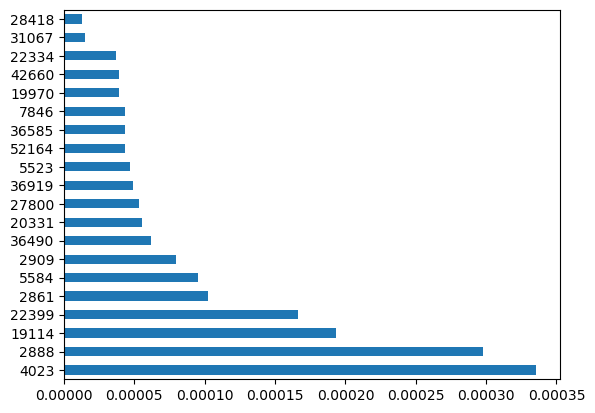

In [376]:
feat_importances_PAK4I = pd.Series(mymodel_PAK4I.coef_)
feat_importances_PAK4I.nlargest(20).plot(kind='barh')

In [ ]:
genes_important_PAK4I = df2.iloc[:, [4024, 2889, 19115, 22400, 2862, 5585, 2910, 36491, 20332, 27801]]
genes_important_PAK4I

# Data visualization
All feature importance serieses need to be converted into dataframe and represented a s a heatmap.
Additionally data will be visualized in the form of a pairs plot and violin plot for the data spread.

In [378]:
feat_imp_SW174769_3_df= feat_importances_SW174769_3.to_frame()
feat_imp_SW174769_3_df.columns= ['Score_SW174769_3']
feat_imp_SW174769_3_df

,Score_SW174769_3
0,0.0
1,0.0
2,-0.0
3,-0.0
4,0.0
...,...
54482,0.0
54483,0.0
54484,0.0
54485,0.0


In [379]:
feat_imp_SW202558_2_df= feat_importances_SW202558_2.to_frame()
feat_imp_SW202558_2_df.columns= ['Score_SW202558_2']
feat_imp_SW202558_2_df

,Score_SW202558_2
0,0.0
1,0.0
2,-0.0
3,-0.0
4,-0.0
...,...
54482,0.0
54483,0.0
54484,0.0
54485,0.0


In [380]:
feat_imp_SW209495_1_df= feat_importances_SW209495_1.to_frame()
feat_imp_SW209495_1_df.columns= ['Score_SW209495_1']
feat_imp_SW209495_1_df

,Score_SW209495_1
0,0.0
1,-0.0
2,-0.0
3,-0.0
4,0.0
...,...
54482,0.0
54483,0.0
54484,0.0
54485,0.0


In [381]:
feat_imp_SW209496_1_df= feat_importances_SW209496_1.to_frame()
feat_imp_SW209496_1_df.columns= ['Score_SW209496_1']
feat_imp_SW209496_1_df

,Score_SW209496_1
0,0.0
1,0.0
2,-0.0
3,0.0
4,-0.0
...,...
54482,-0.0
54483,0.0
54484,0.0
54485,0.0


In [382]:
feat_imp_SW209497_1_df= feat_importances_SW209497_1.to_frame()
feat_imp_SW209497_1_df.columns= ['Score_SW209497_1']
feat_imp_SW209497_1_df

,Score_SW209497_1
0,0.0
1,0.0
2,-0.0
3,-0.0
4,-0.0
...,...
54482,0.0
54483,0.0
54484,0.0
54485,0.0


In [383]:
feat_imp_SW209498_1_df= feat_importances_SW209498_1.to_frame()
feat_imp_SW209498_1_df.columns= ['Score_SW209498_1']
feat_imp_SW209498_1_df

,Score_SW209498_1
0,0.0
1,0.0
2,0.0
3,-0.0
4,-0.0
...,...
54482,-0.0
54483,0.0
54484,0.0
54485,0.0


In [384]:
feat_imp_SW209499_1_df= feat_importances_SW209499_1.to_frame()
feat_imp_SW209499_1_df.columns= ['Score_SW209499_1']
feat_imp_SW209499_1_df

,Score_SW209499_1
0,0.0
1,0.0
2,-0.0
3,0.0
4,-0.0
...,...
54482,0.0
54483,0.0
54484,0.0
54485,0.0


In [385]:
feat_imp_SW209500_1_df= feat_importances_SW209500_1.to_frame()
feat_imp_SW209500_1_df.columns= ['Score_SW209500_1']
feat_imp_SW209500_1_df

,Score_SW209500_1
0,0.0
1,0.0
2,0.0
3,0.0
4,-0.0
...,...
54482,-0.0
54483,0.0
54484,0.0
54485,0.0


In [386]:
feat_imp_SW209501_1_df= feat_importances_SW209501_1.to_frame()
feat_imp_SW209501_1_df.columns= ['Score_SW209501_1']
feat_imp_SW209501_1_df

,Score_SW209501_1
0,0.0
1,-0.0
2,-0.0
3,-0.0
4,-0.0
...,...
54482,-0.0
54483,0.0
54484,0.0
54485,0.0


In [387]:
feat_imp_SW209502_1_df= feat_importances_SW209502_1.to_frame()
feat_imp_SW209502_1_df.columns= ['Score_SW209502_1']
feat_imp_SW209502_1_df

,Score_SW209502_1
0,0.0
1,-0.0
2,-0.0
3,0.0
4,-0.0
...,...
54482,-0.0
54483,0.0
54484,0.0
54485,0.0


In [388]:
feat_imp_SW209503_1_df= feat_importances_SW209503_1.to_frame()
feat_imp_SW209503_1_df.columns= ['Score_SW209503_1']
feat_imp_SW209503_1_df

,Score_SW209503_1
0,0.0
1,-0.0
2,-0.0
3,0.0
4,-0.0
...,...
54482,-0.0
54483,0.0
54484,0.0
54485,0.0


In [389]:
feat_imp_SW209504_1_df= feat_importances_SW209504_1.to_frame()
feat_imp_SW209504_1_df.columns= ['Score_SW209504_1']
feat_imp_SW209504_1_df

,Score_SW209504_1
0,0.0
1,-0.0
2,-0.0
3,-0.0
4,0.0
...,...
54482,-0.0
54483,0.0
54484,0.0
54485,0.0


In [390]:
feat_imp_PAK4I_df= feat_importances_PAK4I.to_frame()
feat_imp_PAK4I_df.columns= ['Score_PAK4I']
feat_imp_PAK4I_df

,Score_PAK4I
0,0.0
1,0.0
2,0.0
3,0.0
4,-0.0
...,...
54482,-0.0
54483,0.0
54484,0.0
54485,0.0


In [392]:
l_merged_5.T

,0,1,2,3,4,5,6,7,8,9,...,19,20,21,22,23,24,25,26,27,28
0,0.000000,0.00000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.000000,0.01490,0.000000,0.000000,0.00000,0.000000,0.018100,0.000000,0.000000,0.000000,...,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.000000,0.00711,0.000000,0.000000,0.00000,0.000000,0.044300,0.000000,0.053100,0.000000,...,0.00402,0.000000,0.007810,0.000000,0.000000,0.007960,0.000000,0.000000,0.000000,0.000000
3,0.000000,0.00000,0.000000,0.000000,0.00000,0.000000,0.016600,0.000000,0.000000,0.000000,...,0.00000,0.000000,0.008390,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.750000,0.29600,0.148000,0.138000,1.13000,1.010000,2.040000,0.492000,1.560000,1.060000,...,1.77000,0.274000,0.418000,1.260000,0.039900,1.560000,0.678000,0.887000,1.480000,5.330000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54484,0.000000,0.00000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
54485,0.000000,0.00000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
54486,0.024200,0.01310,0.023100,0.003690,0.00332,0.063400,0.020900,0.009840,0.019200,0.183000,...,0.03750,0.052000,0.057000,0.000000,0.060700,0.003530,0.168000,0.002710,0.038900,0.201000
54487,0.152000,0.13600,0.009600,0.006960,0.05180,0.107000,0.015600,0.020100,0.015600,0.205000,...,0.11500,0.090800,0.166000,0.070400,0.131000,0.000000,0.304000,0.001290,0.288000,0.016200


In [393]:
gene_name= df3.iloc[:, 0]
gene_name

index          HUGO
0        AL627309.2
1           OR4G11P
2           FAM138A
3             OR4F5
            ...    
54483    AC145212.2
54484    AC145212.3
54485    AL360154.2
54486    AL360154.1
54487    AC109135.1
Name: 0, Length: 54489, dtype: object

In [394]:
#concat the feature importance scores with df3; so that the gene names appear om the heatmap

results= pd.concat([gene_name, feat_imp_SW174769_3_df, feat_imp_SW202558_2_df, feat_imp_SW209495_1_df, feat_imp_SW209496_1_df, feat_imp_SW209497_1_df, feat_imp_SW209498_1_df, feat_imp_SW209499_1_df, feat_imp_SW209500_1_df, feat_imp_SW209501_1_df, feat_imp_SW209502_1_df, feat_imp_SW209503_1_df, feat_imp_SW209504_1_df, feat_imp_PAK4I_df], axis= 1)
results


,0,Score_SW174769_3,Score_SW202558_2,Score_SW209495_1,Score_SW209496_1,Score_SW209497_1,Score_SW209498_1,Score_SW209499_1,Score_SW209500_1,Score_SW209501_1,Score_SW209502_1,Score_SW209503_1,Score_SW209504_1,Score_PAK4I
index,HUGO,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,AL627309.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,OR4G11P,0.0,0.0,-0.0,0.0,0.0,0.0,0.0,0.0,-0.0,-0.0,-0.0,-0.0,0.0
2,FAM138A,-0.0,-0.0,-0.0,-0.0,-0.0,0.0,-0.0,0.0,-0.0,-0.0,-0.0,-0.0,0.0
3,OR4F5,-0.0,-0.0,-0.0,0.0,-0.0,-0.0,0.0,0.0,-0.0,0.0,0.0,-0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54483,AC145212.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
54484,AC145212.3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
54485,AL360154.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
54486,AL360154.1,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0


In [395]:
results

,0,Score_SW174769_3,Score_SW202558_2,Score_SW209495_1,Score_SW209496_1,Score_SW209497_1,Score_SW209498_1,Score_SW209499_1,Score_SW209500_1,Score_SW209501_1,Score_SW209502_1,Score_SW209503_1,Score_SW209504_1,Score_PAK4I
index,HUGO,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,AL627309.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,OR4G11P,0.0,0.0,-0.0,0.0,0.0,0.0,0.0,0.0,-0.0,-0.0,-0.0,-0.0,0.0
2,FAM138A,-0.0,-0.0,-0.0,-0.0,-0.0,0.0,-0.0,0.0,-0.0,-0.0,-0.0,-0.0,0.0
3,OR4F5,-0.0,-0.0,-0.0,0.0,-0.0,-0.0,0.0,0.0,-0.0,0.0,0.0,-0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54483,AC145212.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
54484,AC145212.3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
54485,AL360154.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
54486,AL360154.1,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0


In [396]:
X_all.shape

(32, 54487)

In [397]:
#X_all_df last value index 54487 is missing during varaible declaration: proof below
X_all_df= pd.DataFrame(X_all)
X_all_df

,0,1,2,3,4,5,6,7,8,9,...,54477,54478,54479,54480,54481,54482,54483,54484,54485,54486
0,0.0,0.0000,0.00000,0.00000,0.7500,0.2130,3.840000e-06,0.0737,1.600,0.596,...,0.0,0.0,0.0,0.0111,0.0,2.980,0.0,0.0,0.0,0.02420
1,0.0,0.0000,0.00000,0.00000,0.1190,0.3240,2.870000e-01,0.0358,0.242,0.125,...,0.0,0.0,0.0,0.0000,0.0,2.240,0.0,0.0,0.0,0.08830
2,0.0,0.0149,0.00711,0.00000,0.2960,0.0671,5.970000e-02,0.0698,0.912,1.600,...,0.0,0.0,0.0,0.0000,0.0,1.570,0.0,0.0,0.0,0.01310
3,0.0,0.0000,0.00000,0.00000,0.1480,0.0558,8.540000e-08,0.0174,0.127,0.111,...,0.0,0.0,0.0,0.2870,0.0,1.220,0.0,0.0,0.0,0.02310
4,0.0,0.0000,0.00000,0.00000,0.1380,0.3920,1.310000e-01,0.0706,0.444,0.299,...,0.0,0.0,0.0,0.0137,0.0,1.370,0.0,0.0,0.0,0.00369
5,0.0,0.0000,0.00000,0.00000,1.1300,0.6280,1.390000e-01,0.1460,1.280,0.346,...,0.0,0.0,0.0,1.3900,0.0,0.553,0.0,0.0,0.0,0.00332
6,0.0,0.0000,0.00000,0.00000,1.0100,0.1900,2.240000e-01,0.0570,1.510,0.662,...,0.0,0.0,0.0,0.0101,0.0,1.540,0.0,0.0,0.0,0.06340
7,0.0,0.0181,0.04430,0.01660,2.0400,0.4910,1.540000e-01,0.1010,4.030,1.010,...,0.0,0.0,0.0,0.3330,0.0,1.050,0.0,0.0,0.0,0.02090
8,0.0,0.0000,0.00000,0.00000,0.4920,0.0915,2.160000e-02,0.0409,0.679,0.589,...,0.0,0.0,0.0,0.0000,0.0,0.763,0.0,0.0,0.0,0.00984
9,0.0,0.0000,0.05310,0.00000,1.5600,0.2100,1.480000e-01,0.0492,1.970,2.080,...,0.0,0.0,0.0,1.3900,0.0,5.460,0.0,0.0,0.0,0.01920


In [430]:
results_2= results.iloc[2:54486, 1:]
results_2

,Score_SW174769_3,Score_SW202558_2,Score_SW209495_1,Score_SW209496_1,Score_SW209497_1,Score_SW209498_1,Score_SW209499_1,Score_SW209500_1,Score_SW209501_1,Score_SW209502_1,Score_SW209503_1,Score_SW209504_1,Score_PAK4I
1,0.0,0.0,-0.0,0.0,0.0,0.0,0.0,0.0,-0.0,-0.0,-0.0,-0.0,0.0
2,-0.0,-0.0,-0.0,-0.0,-0.0,0.0,-0.0,0.0,-0.0,-0.0,-0.0,-0.0,0.0
3,-0.0,-0.0,-0.0,0.0,-0.0,-0.0,0.0,0.0,-0.0,0.0,0.0,-0.0,0.0
4,0.0,-0.0,0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,0.0,-0.0
5,0.0,-0.0,-0.0,-0.0,-0.0,0.0,0.0,0.0,0.0,-0.0,-0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
54480,0.0,-0.0,0.0,-0.0,0.0,0.0,-0.0,0.0,0.0,-0.0,-0.0,-0.0,-0.0
54481,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
54482,0.0,0.0,0.0,-0.0,0.0,-0.0,0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0
54483,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [406]:
type(results)

pandas.core.frame.DataFrame

<AxesSubplot:>

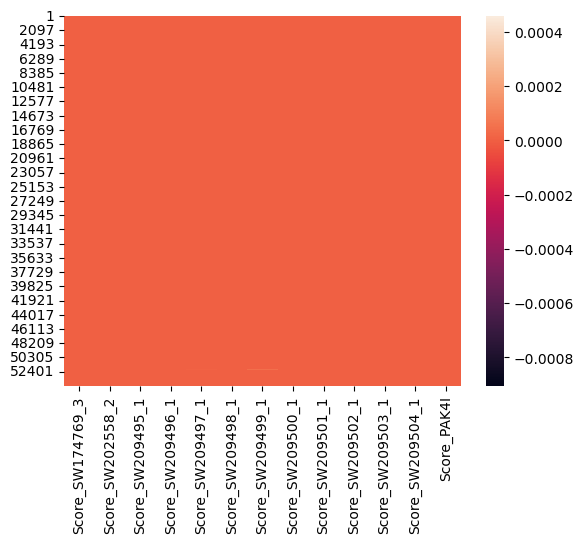

In [431]:
sns.heatmap(results_2)

The heatmap colors are off since most values are within a very tiny range. We need to change the vmin and vmax argument to capture proper dynamic range

<AxesSubplot:>

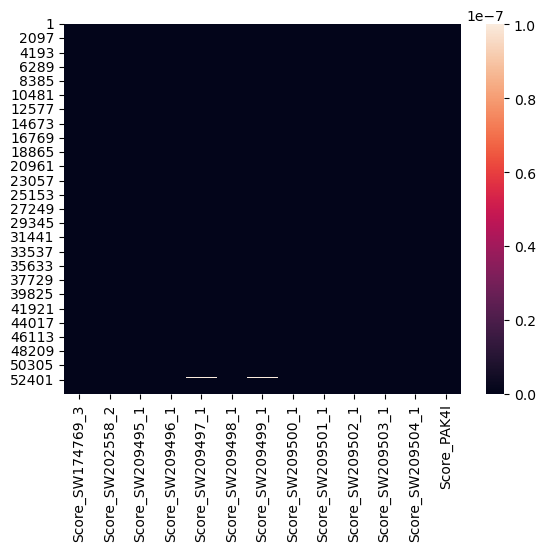

In [472]:
sns.heatmap(results_2, vmax= 0.0000001, vmin= 0)

In [474]:
results_2.nlargest(5, 'Score_SW174769_3')

,Score_SW174769_3,Score_SW202558_2,Score_SW209495_1,Score_SW209496_1,Score_SW209497_1,Score_SW209498_1,Score_SW209499_1,Score_SW209500_1,Score_SW209501_1,Score_SW209502_1,Score_SW209503_1,Score_SW209504_1,Score_PAK4I
36585,0.000187,-0.000000,-0.0,-0.000000,-0.000000,-0.0,-0.000002,0.000033,0.000026,0.0,0.0000,-0.0,0.000043
36878,0.000157,0.000000,0.0,0.000055,0.000051,0.0,0.000023,0.000000,0.000000,0.0,0.0000,0.0,0.000000
37944,0.000128,0.000026,0.0,0.000000,0.000000,-0.0,0.000000,0.000000,-0.000025,0.0,0.0000,0.0,-0.000000
12148,0.000103,0.000067,-0.0,-0.000000,-0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0001,0.0,0.000000
22007,0.000076,0.000137,0.0,0.000000,-0.000022,0.0,0.000000,0.000004,0.000000,0.0,-0.0000,0.0,-0.000000


In [476]:
results_2_cols = results_2[0: 0]
results_2_cols

,Score_SW174769_3,Score_SW202558_2,Score_SW209495_1,Score_SW209496_1,Score_SW209497_1,Score_SW209498_1,Score_SW209499_1,Score_SW209500_1,Score_SW209501_1,Score_SW209502_1,Score_SW209503_1,Score_SW209504_1,Score_PAK4I


Top 5 for the feature importance scores are tabulated and concatanated 

In [507]:
top5_1= results_2.nlargest(5, 'Score_SW174769_3')
top5_2= results_2.nlargest(5, 'Score_SW202558_2')
top5_3= results_2.nlargest(5, 'Score_SW209495_1') 
top5_4= results_2.nlargest(5, 'Score_SW209496_1') 
top5_5= results_2.nlargest(5, 'Score_SW209497_1') 
top5_6= results_2.nlargest(5, 'Score_SW209498_1') 
top5_7= results_2.nlargest(5, 'Score_SW209499_1') 
top5_8= results_2.nlargest(5, 'Score_SW209500_1') 
top5_9= results_2.nlargest(5, 'Score_SW209501_1') 
top5_10= results_2.nlargest(5, 'Score_SW209502_1') 
top5_11= results_2.nlargest(5, 'Score_SW209503_1') 
top5_12= results_2.nlargest(5, 'Score_SW209504_1') 
top5_13= results_2.nlargest(5, 'Score_PAK4I') 


In [518]:
print( top5_1)
print( top5_2)

       Score_SW174769_3  Score_SW202558_2  Score_SW209495_1  Score_SW209496_1  \
36585          0.000187         -0.000000              -0.0         -0.000000   
36878          0.000157          0.000000               0.0          0.000055   
37944          0.000128          0.000026               0.0          0.000000   
12148          0.000103          0.000067              -0.0         -0.000000   
22007          0.000076          0.000137               0.0          0.000000   

       Score_SW209497_1  Score_SW209498_1  Score_SW209499_1  Score_SW209500_1  \
36585         -0.000000              -0.0         -0.000002          0.000033   
36878          0.000051               0.0          0.000023          0.000000   
37944          0.000000              -0.0          0.000000          0.000000   
12148         -0.000000               0.0          0.000000          0.000000   
22007         -0.000022               0.0          0.000000          0.000004   

       Score_SW209501_1  S

In [523]:
concat_12= pd.concat([top5_1, top5_2], axis =0)
concat_12

,Score_SW174769_3,Score_SW202558_2,Score_SW209495_1,Score_SW209496_1,Score_SW209497_1,Score_SW209498_1,Score_SW209499_1,Score_SW209500_1,Score_SW209501_1,Score_SW209502_1,Score_SW209503_1,Score_SW209504_1,Score_PAK4I
36585,0.000187,-0.000000,-0.0,-0.000000,-0.000000,-0.0,-0.000002,0.000033,0.000026,0.0,0.0000,-0.0,0.000043
36878,0.000157,0.000000,0.0,0.000055,0.000051,0.0,0.000023,0.000000,0.000000,0.0,0.0000,0.0,0.000000
37944,0.000128,0.000026,0.0,0.000000,0.000000,-0.0,0.000000,0.000000,-0.000025,0.0,0.0000,0.0,-0.000000
12148,0.000103,0.000067,-0.0,-0.000000,-0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0001,0.0,0.000000
22007,0.000076,0.000137,0.0,0.000000,-0.000022,0.0,0.000000,0.000004,0.000000,0.0,-0.0000,0.0,-0.000000
6437,0.000000,0.000457,-0.0,0.000000,0.000115,-0.0,0.000000,0.000000,0.000000,-0.0,0.0000,-0.0,0.000000
3160,0.000000,0.000394,0.0,0.000000,0.000000,-0.0,0.000000,0.000000,-0.000000,0.0,-0.0000,0.0,-0.000000
11505,0.000000,0.000393,0.0,0.000000,-0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0000,0.0,0.000000
7788,0.000000,0.000239,0.0,-0.000000,0.000166,0.0,0.000000,-0.000000,-0.000000,-0.0,-0.0000,0.0,-0.000725
21822,0.000000,0.000228,-0.0,-0.000000,0.000000,0.0,-0.000000,0.000037,0.000000,0.0,-0.0000,-0.0,-0.000000


In [525]:
concat_all= pd.concat([top5_1, top5_2, top5_3, top5_4, top5_5, top5_6, top5_7, top5_8, top5_9, top5_10, top5_11, top5_12, top5_13], axis =0)
concat_all

,Score_SW174769_3,Score_SW202558_2,Score_SW209495_1,Score_SW209496_1,Score_SW209497_1,Score_SW209498_1,Score_SW209499_1,Score_SW209500_1,Score_SW209501_1,Score_SW209502_1,Score_SW209503_1,Score_SW209504_1,Score_PAK4I
36585,0.000187,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000002,0.000033,0.000026,0.000000e+00,0.000000,-0.000000,0.000043
36878,0.000157,0.000000,0.000000,0.000055,0.000051,0.000000,0.000023,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000
37944,0.000128,0.000026,0.000000,0.000000,0.000000,-0.000000,0.000000,0.000000,-0.000025,0.000000e+00,0.000000,0.000000,-0.000000
12148,0.000103,0.000067,-0.000000,-0.000000,-0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000100,0.000000,0.000000
22007,0.000076,0.000137,0.000000,0.000000,-0.000022,0.000000,0.000000,0.000004,0.000000,0.000000e+00,-0.000000,0.000000,-0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4023,0.000000,0.000000,-0.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000336
2888,-0.000000,0.000052,-0.000000,0.000000,-0.000000,-0.000000,0.000000,0.000000,0.000000,0.000000e+00,-0.000000,0.000048,0.000298
19114,-0.000103,-0.000045,-0.000258,0.000000,-0.000085,-0.000000,-0.000039,-0.000000,-0.000031,-0.000000e+00,0.000000,-0.000140,0.000193
22399,-0.000000,0.000000,-0.000000,0.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,-0.000000e+00,-0.000000,-0.000000,0.000166


In [536]:
top5_all = concat_all.merge(gene_name, left_index= True, right_index= True)
top5_all

,Score_SW174769_3,Score_SW202558_2,Score_SW209495_1,Score_SW209496_1,Score_SW209497_1,Score_SW209498_1,Score_SW209499_1,Score_SW209500_1,Score_SW209501_1,Score_SW209502_1,Score_SW209503_1,Score_SW209504_1,Score_PAK4I,0
317,-0.000320,0.000018,-0.000000,3.200493e-05,0.000255,-0.000005,-0.000000e+00,-0.000000,0.000010,-0.000000e+00,-0.000000,-0.000000e+00,0.000000,ENO1
2788,-0.000000,0.000000,0.000000,0.000000e+00,0.000134,-0.000000,0.000000e+00,-0.000000,-0.000000,-0.000000e+00,-0.000000,0.000000e+00,-0.000000,S100A10
2861,-0.000000,-0.000799,0.000000,1.647358e-04,-0.000004,0.000045,-0.000000e+00,0.000014,0.000080,9.369387e-07,0.000042,1.601263e-05,0.000103,S100A9
2861,-0.000000,-0.000799,0.000000,1.647358e-04,-0.000004,0.000045,-0.000000e+00,0.000014,0.000080,9.369387e-07,0.000042,1.601263e-05,0.000103,S100A9
2861,-0.000000,-0.000799,0.000000,1.647358e-04,-0.000004,0.000045,-0.000000e+00,0.000014,0.000080,9.369387e-07,0.000042,1.601263e-05,0.000103,S100A9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45743,0.000015,0.000018,0.000027,3.409849e-07,0.000002,0.000021,-8.925142e-07,-0.000004,0.000014,1.248073e-06,0.000009,-9.570952e-06,-0.000041,FTL
52089,-0.000000,-0.000000,0.000000,2.180876e-05,0.000010,-0.000000,8.019530e-05,-0.000028,0.000000,-0.000000e+00,-0.000000,0.000000e+00,-0.000000,MT-CO1
52096,0.000000,0.000043,0.000020,9.150990e-05,0.000006,0.000002,1.122065e-04,-0.000051,-0.000011,-1.330442e-05,0.000055,8.522598e-07,-0.000000,MT-ND3
52164,0.000000,-0.000024,-0.000004,0.000000e+00,0.000002,0.000007,6.078412e-06,0.000047,0.000106,0.000000e+00,0.000020,5.876123e-06,0.000043,MT-ND4L


In [539]:
y_axis_labels= top5_all.iloc[:, 13]
y_axis_labels

317          ENO1
2788      S100A10
2861       S100A9
2861       S100A9
2861       S100A9
           ...   
45743         FTL
52089      MT-CO1
52096      MT-ND3
52164     MT-ND4L
54427    RNA5-8S5
Name: 0, Length: 65, dtype: object

<AxesSubplot:>

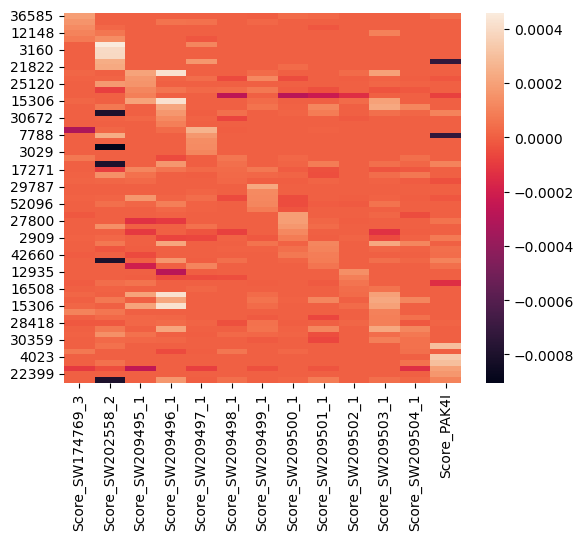

In [526]:
sns.heatmap(concat_all)

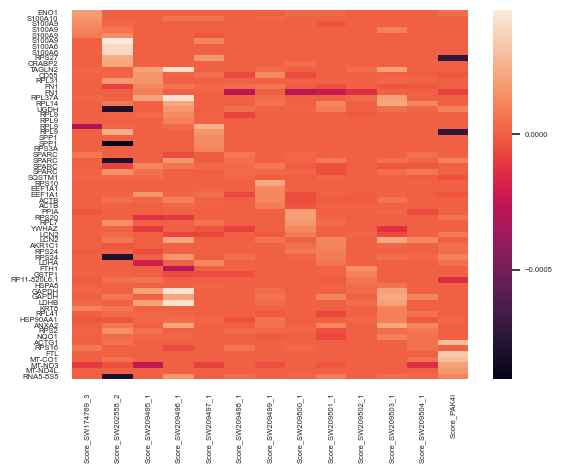

In [547]:
#gene name added
sns.heatmap(concat_all, yticklabels= y_axis_labels)
sns.set(font_scale = 10)


From this heatmap, on positive side of the spectrum (positive correlator of the response), we can see that for a compound with known mechanism of action (PAK4), the best biomarker was ACTG1. ACTG1 was also did not show up on other compounds as a biomerker; which means the hit was probably specific. ACTG1 codes for the gamma subunit of the Actine cytoskeleton in the cell. PAK4 inhibitor targets the protein PAK4, a protein that regulates cytoskeleton rearrangement. Hence, there are some meaningful connection to be made here. Some of the other biomarkers from this plot were mitochondria related genes.  Mitochondrial activity can be associated to the compound associated death. 

The second compound (from left) was one of the most promising one. It identified S100 proteins as a major biomarkers. These proteins are calcium binding and hence there may be a calcium binding structural function being affected by this compound. S100 proteins regulate many pathway functions including cellular growth in the body and hence is a good target to start with.  

The fourth (from left) compound identified GAPDH as a biomarker. This gene is ubiquitously expressed in the cell and often used as a non specific hit. The higher the expression of this in cells the higher metabolically active (such as proliferation and etc.). GAPDH being pulled as a hot most likely indicates that the biomarker is predicting cellular metabolism/growth as a whole and not selective to any particular biological process. This is also indicative of the fact that thrid, 11th and 12th (from right) compounds also were predicting this as somewhat of a candidate biomarker. These observations indicate that these compounds were mostly not very specific for a partcular hit (like chemotherapy) and hence could be globally cytotoxic. 

On negative side of the spectrum (negative regulator of the response), for second compound (from left) UDP-Glucose 6-Dehydrogenase was predicted. It is an enzyme that reulates particular membrane protein such as glycan biology as well as many other functions. It also found secreted phospho proteins (SPP1) as a negative biomarker. These observations indicate that protein ligand binding process (which S100 proteins are also involved in), are may be a potential mechanism of action for this protein.

<AxesSubplot:>

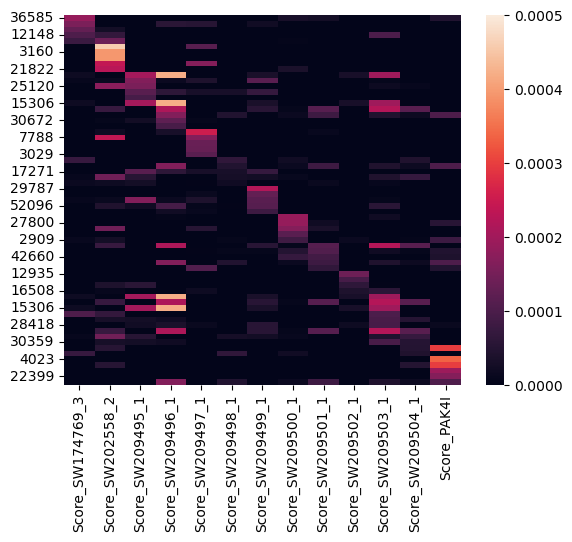

In [530]:
#Positive Separately
sns.heatmap(concat_all, vmax= 0.0005, vmin= 0.000)

<AxesSubplot:>

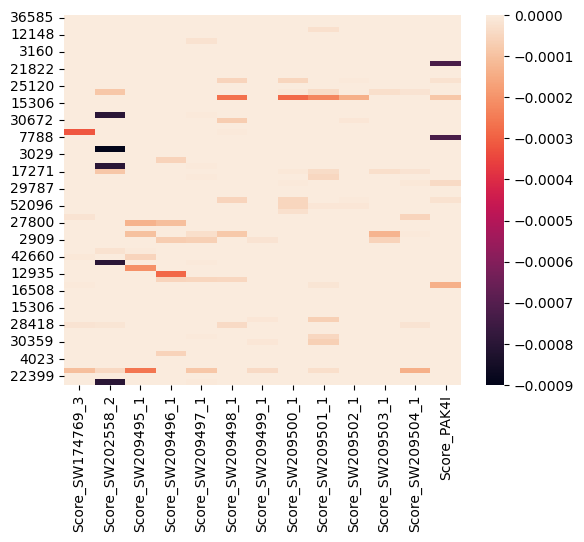

In [531]:
#Negative separately
sns.heatmap(concat_all, vmax= 0.0000, vmin= -0.0009)

<AxesSubplot:xlabel='Score_SW174769_3'>

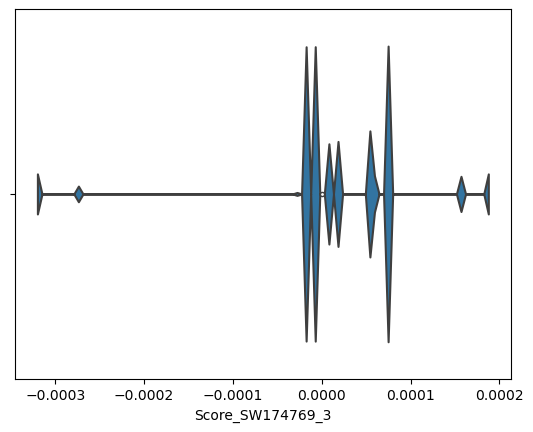

In [443]:
#All violin plot separately
sns.violinplot(results_2.iloc[:, 0])

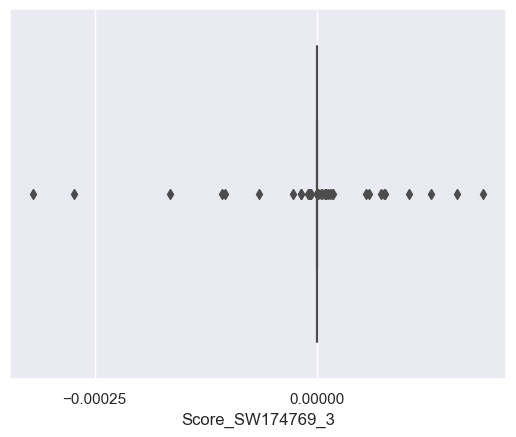

In [565]:
sns.boxplot(results_2.iloc[:, 0])
sns.set(font_scale = 100)

#### The violoin plots are indicative of our observations that most values are centered around zero, since Elastic net regression's lasso regularization causes most non significant contributors towards zero. The other values that are spread apart from the distribution are the caniddate biomarkers we are dealing with.

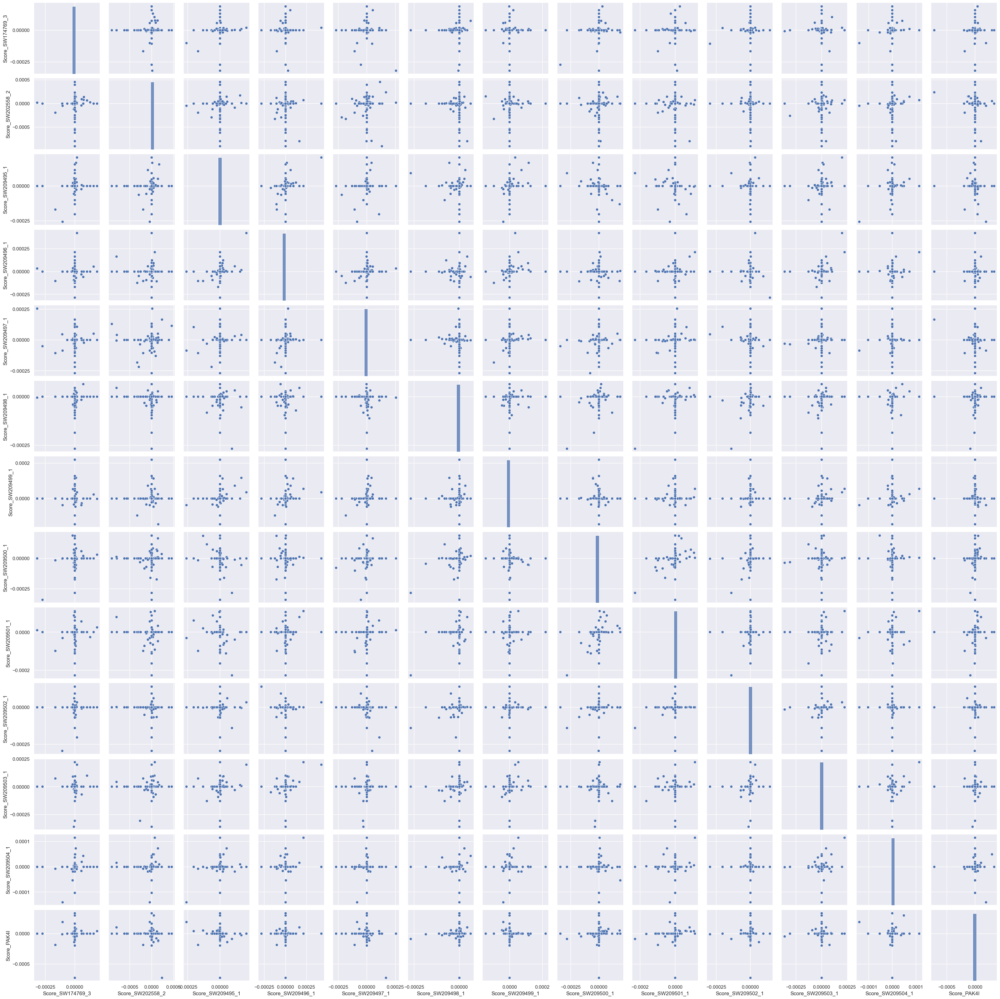

In [569]:
sns.pairplot(results_2)
sns.set(font_scale = 5)
plt.show()

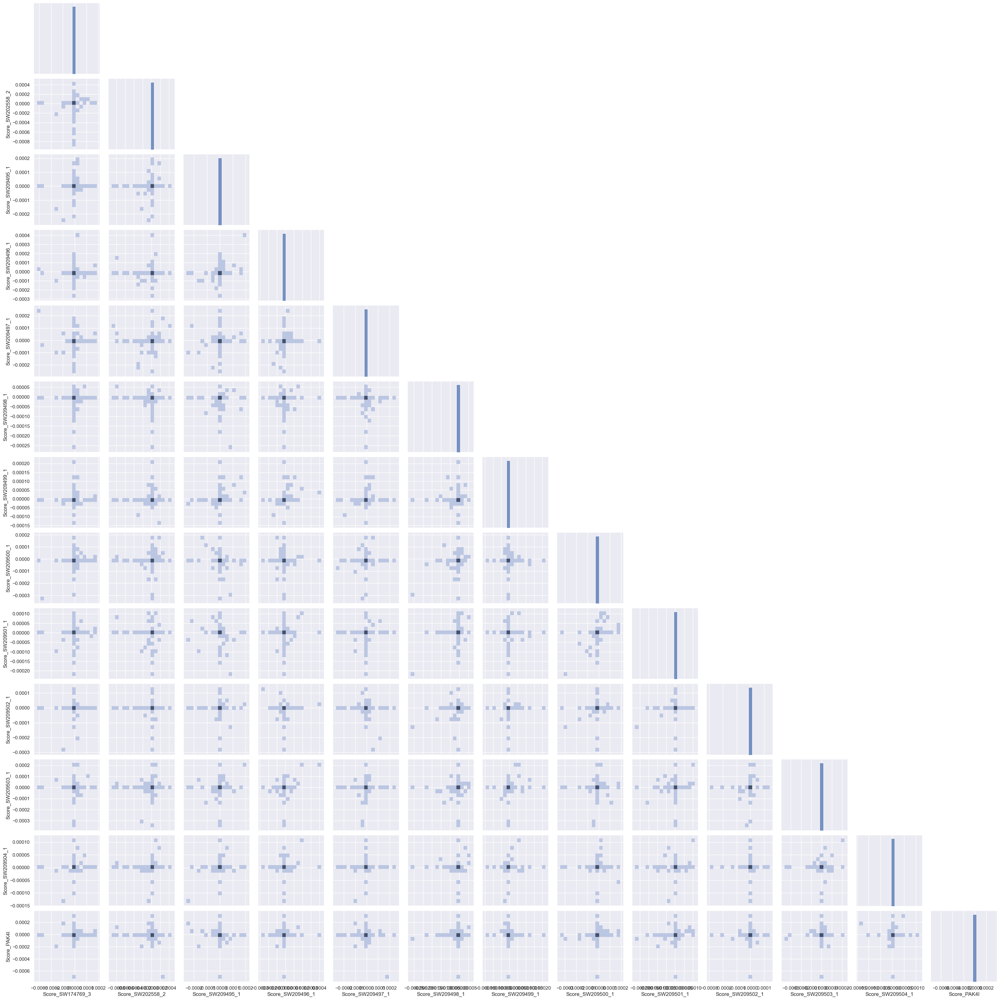

In [576]:
sns.pairplot(results_2, kind="hist", corner=True)
sns.set(font_scale = 0.5)

#### Pairsplot indicates that there is not many overmaps between the top hits from each compound; this indicates that the results have specificity. The similarity between compound 11 and 4 (from left) is seen, again indicating our previous observation on the heatmap.

<AxesSubplot:xlabel='Score_SW202558_2'>

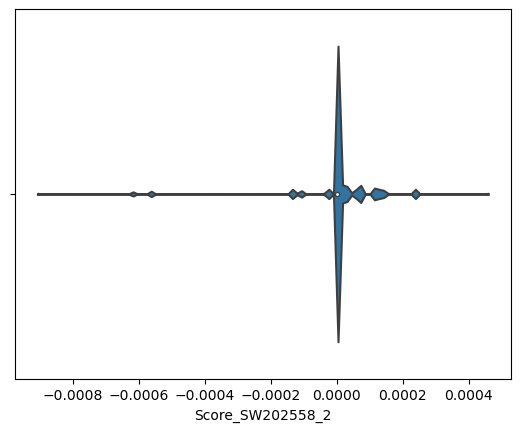

In [444]:
sns.violinplot(results_2.iloc[:, 1])

<AxesSubplot:xlabel='Score_SW209495_1'>

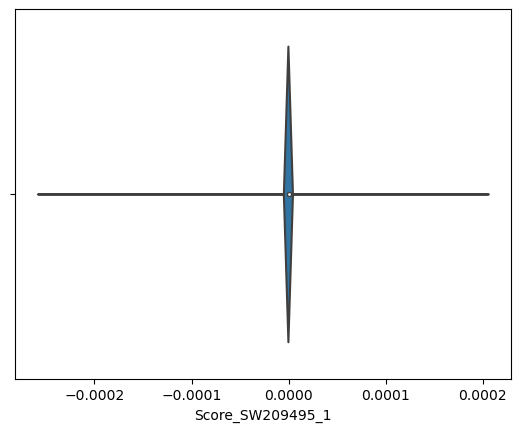

In [445]:
sns.violinplot(results_2.iloc[:, 2])

<AxesSubplot:xlabel='Score_SW209496_1'>

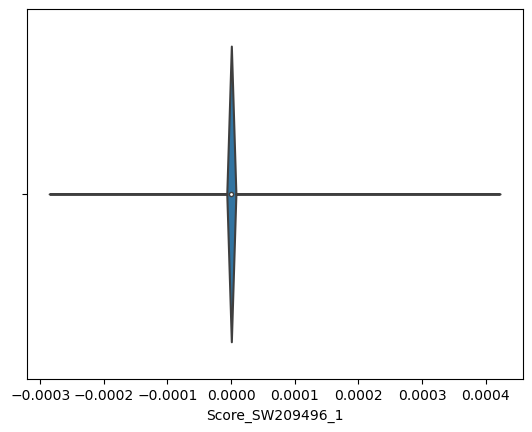

In [446]:
sns.violinplot(results_2.iloc[:, 3])

#### Since the 4th compound biomarker was found to be non-specific, this is not surprising that in the violin plot none of the values were an actual outlier.

<AxesSubplot:xlabel='Score_SW209497_1'>

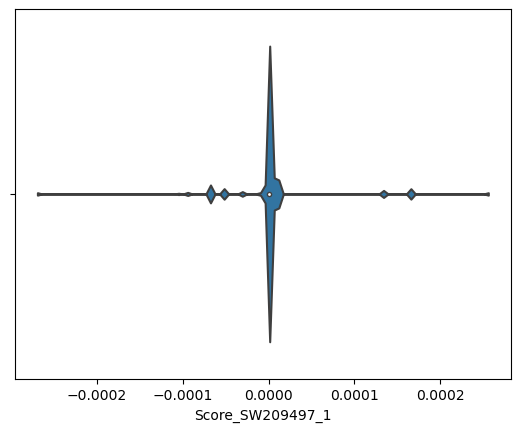

In [447]:
sns.violinplot(results_2.iloc[:, 4])

<AxesSubplot:xlabel='Score_SW209498_1'>

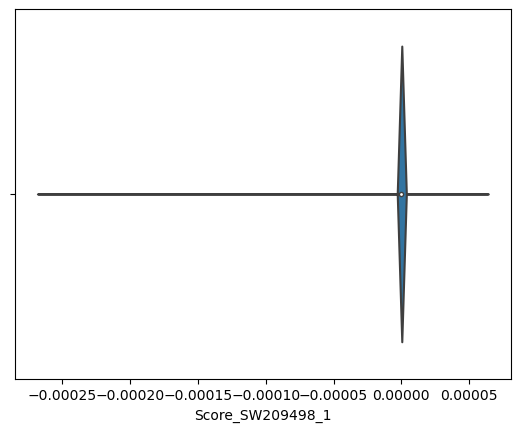

In [448]:
sns.violinplot(results_2.iloc[:, 5])

<AxesSubplot:xlabel='Score_SW209499_1'>

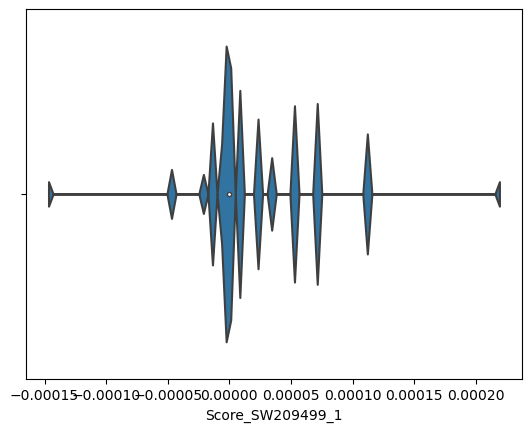

In [449]:
sns.violinplot(results_2.iloc[:, 6])

<AxesSubplot:xlabel='Score_SW209500_1'>

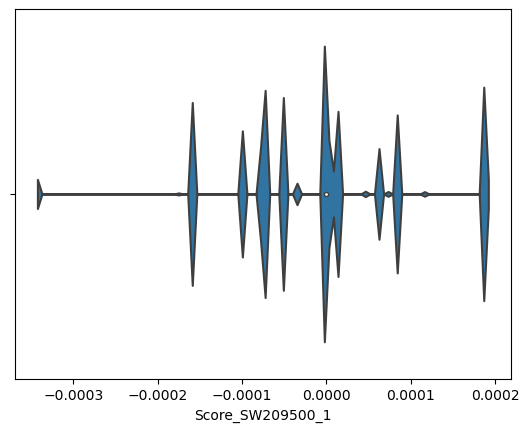

In [450]:
sns.violinplot(results_2.iloc[:, 7])

<AxesSubplot:xlabel='Score_SW209501_1'>

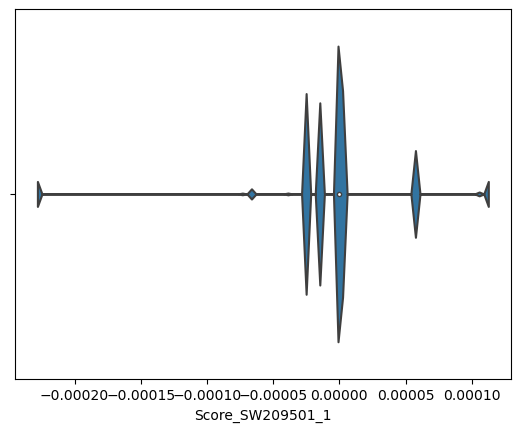

In [451]:
sns.violinplot(results_2.iloc[:, 8])

<AxesSubplot:xlabel='Score_SW209502_1'>

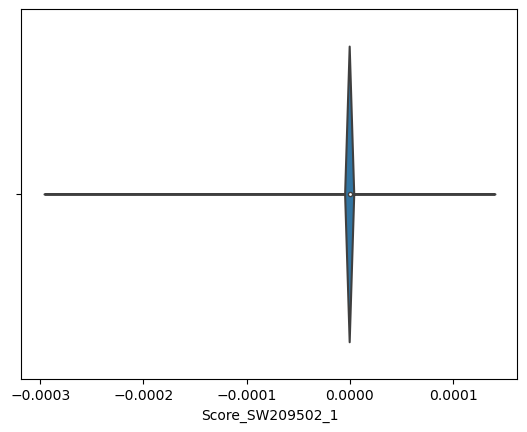

In [452]:
sns.violinplot(results_2.iloc[:, 9])

<AxesSubplot:xlabel='Score_SW209503_1'>

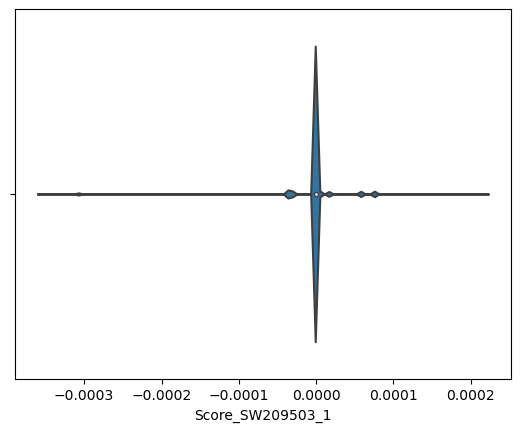

In [453]:
sns.violinplot(results_2.iloc[:, 10])

<AxesSubplot:xlabel='Score_SW209504_1'>

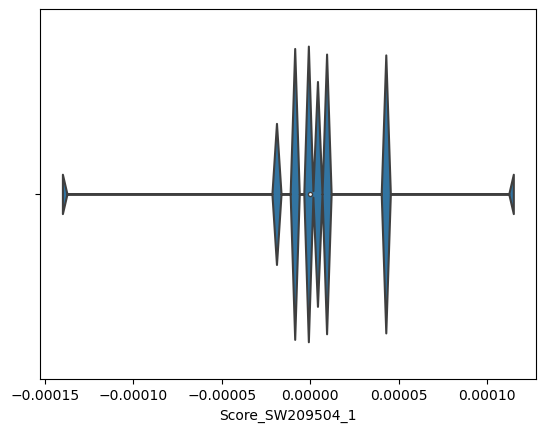

In [454]:
sns.violinplot(results_2.iloc[:, 11])

<AxesSubplot:xlabel='Score_PAK4I'>

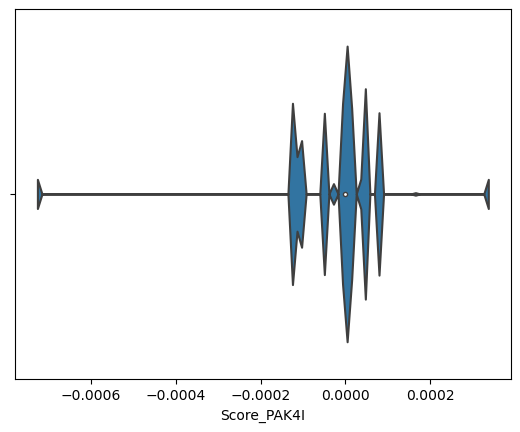

In [455]:
sns.violinplot(results_2.iloc[:, 12])

# Conclusion
Elastic net regularization, Nonzero matrix factorization and PCA are three different modeling tried in this notebook to deconvolute complex datasets such as gene expression matrix. Out of these, only elastic net, as a starting point, keeps the gene information discreet. Elastic net algorthm alpha value was empirically determined using a gridsearch for the expression dataset (0.0001). Elastic net results identified most important features that contributed to response prediction. From 13 different compounds the best hit was identified for compound S202558_2. The candidate pathway that it affects are ligand protein binding. And the mechanism of action likely is via perturbation of calcium binding of the S100 proteins.